<div style="text-align:center; font-size:20px; font-weight:bold;">
    D213 Task 1: Time Series Modeling<br>
    Joseph Duszynski<br>
    ID #011237236<br>
</div>
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
A.1. Research question
</div>
<br>

With the provided medical revenue dataset (WGU, 2024 [1]), this project seeks to answer the following question: “Can an ARIMA (or SARIMAX) model be created for this dataset that provides accurate and meaningful daily revenue forecasts, specifically for 90 days beyond the last day of the collected data?”
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
A.2. Objectives or goals
</div>
<br>

This project aims to investigate the revenue data's seasonality (if present), autocorrelations, partial autocorrelations, trends, and other traits in forming the most accurate ARIMA model possible, determined primarily by the model's AIC, Ljung-Box p-values, reliability of model coefficients (by p-value), mean absolute error, and root mean square error. The data will be split 80/20 in a training and test set to assess the model's performance outside of its training data. Additionally, the model will be used for a forecast 90 days after the last date in the dataset.
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
B. Summary of assumptions
</div>
<br>

Time series data in a single variable are frequently modeled using ARIMA (autoregressive integrated moving average) models, while SARIMAX is an enhancement that can account for seasonality and exogenous factors. On stationary, non-seasonal data, ARMA$(p, q)$ models approximate the coefficients $\phi_i, \: \mu_i$ from
$$\tag{1} y(t) = \sum_{i=1}^{p}{\phi_i \: y(t-i)} \: + \: \sum_{i=0}^{q}{\mu_i \: \varepsilon(t-i)} \: + \: \beta$$

where $\beta$ is a (possibly zero) constant term. More generally, non-stationary data with seasonality (SARIMAX) takes input parameters $(p, d, q)$ and seasonal parameters $(P, D, Q)$ to approximate the coefficients of the polynomials $\Theta(L)^p, \: \Phi(L)^q, \: \theta(L^s)^P, \: \phi(L^s)^Q$ (of degrees $p, \ q, \ P, \ Q$ respectively) in the equation (Feldman, unknown [1]):
$$\tag{2} \Theta(L)^p \theta(L^s)^P \Delta^d \Delta^D_s y_t = \Phi(L)^q \phi(L^s)^Q \Delta^d \Delta^D_s \varepsilon_t$$

Here, the constant $\beta$ was absorbed into one of the polynomials, $y_t$ is the modeled variable $y$ at time step $t$, $\varepsilon_t$ is the noise at time step $t$, and $\Theta(L)^p$ is a polynomial of degree $p$ on the lag operator $L$ such that $L^n y_t = y_{t-n}$, representing the $p$ autoregressive (AR) components. $\Phi(L)^q$ is a polynomial of degree $q$ on the lag operator $L$ representing the $q$ moving average (MA) components. Similarly, the seasonality $s$ is handled by the analogous seasonal polynomials $\theta(L^s)^P$ and $\phi(L^s)^Q$. The data is made stationary through the integration operator $\Delta^d$, which applies differencing of order $d$. More precisely,
$$y_t^{[d]} = \Delta^d y_t = y_t^{[d-1]} - y_{t-1}^{[d-1]}$$

Which produces ARIMA$(p, d, q)$ models (without the SARIMAX $(P, D, Q)$ seasonal component) of the form:
$$\tag{3} \Delta^d y_t = \Theta(L)^p \Delta^d y_t + \Phi(L)^q \Delta^d \varepsilon_t + \Delta^d \varepsilon_t$$

When including the seasonal terms $(P, D, Q)$, the above equation (3) reproduces the SARIMAX equation (2).
<br>

Essential to (S)ARIMA models is predicting subsequent data points $y_{t+i} \: (i \geq 0)$ from previous data points, namely from the values $y_{t-k} \: (k > 0)$, the autoregressive terms, and previous shock/noise values within $\varepsilon_{t-k}$, the moving average terms. The time series is assumed to be stationary (i.e. the data's statistical properties, such as mean and variance at each point, don't change over time) when fitting the model, which is handled through the parameters $d$ and $D$ to appropriately difference the initial data to ensure it is stationary prior to fitting. The coefficients within the polynomials $\Theta(L)^p, \ \Phi(L)^q, \theta(L^s)^P, \ \phi(L^s)^Q$ fit by the model are assumed to be constant across time.
<br>

Additionally, (S)ARIMA models assume randomly distributed, uncorrelated errors $\varepsilon_t$ (Elleh, 2024 [2]). It's assumed the series contains no outliers, as that would distort the coefficients fit by the model. The model also assumes a lack of autocorrelation, meaning a point $y_t$ has negligible correlations with past terms $y_{t-k} \: (k > 0)$. The presence of autocorrelations indicates relevant predictive information is contained in past values, so accurate coefficients and predictive capabilities of (S)ARIMA models require no significant autocorrelation. In many cases, this is handled through appropriately differencing and transforming (e.g. taking a logarithm of) the data to make it stationary while inspecting plots of the autocorrelation function (ACF) and partial autocorrelation function (PACF) to verify a lack of autocorrelation. Further, the model's residuals are assumed to lack autocorrelation as well, resembling Gaussian white noise for a valid, accurate model.
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
C.1. Line graph visualization
</div>
<br>

Presenting a line graph of the data requires some initial preparation and processing. As will be discussed in section C.2., the dates are set to start at Januar 1, 2020 and end at December 31, 2021.

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates
from datetime import datetime
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
from scipy.signal import periodogram
from pandas.plotting import autocorrelation_plot
from pmdarima.arima import auto_arima
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


df_med = pd.read_csv('data/D213-medical-files/medical_time_series.csv')
pd.set_option('display.max_columns', None)

# When True, displays extensive summary statistics and plots. Output streamlined when False.
run_verbose = False

# auto_arima takes too long and too much memory to be practical to run for very long,
# so set to False unless desired otherwise
use_auto_arima = False

# Setting directory to save images. The function plots() will have errors if its parameter save=True and
# this isn't adjusted to fit the local environment.
img_dir = 'C:/'


print(f"\nChecking for columns with null values: {list(df_med.columns[df_med.isna().sum() > 0])}\n")
print(f"Number of duplicated values in column 'Day': {df_med.duplicated(subset='Day').sum()}\n")
print(f"Verifying 'Day' column is sequential from 1 to 731 with no gaps:\n{df_med.Day.describe()}\n")
print(f"Differences between rows are all 1.0:\n{df_med['Day'].diff().dropna().describe()}\n")


# Adapted from Dr. Festus Elleh's “D213 Webinar Task 1 Data Preprocessing Python” lecture video, accessed 2024.
# https://wgu.hosted.panopto.com/Panopto/Pages/Viewer.aspx?id=8d32afc8-d66f-42d5-9117-b100016cf9ac

# Converts numbered day_coln to datetimes starting at January 1 of start_year.
def day_to_datetime(start_year=2020, day_coln='Day', df=df_med):
    start_month = 1
    start_day = 1
    df['Date'] = pd.date_range(start=datetime(start_year, start_month, start_day), periods=df.shape[0], freq='24h')
    df.set_index('Date', inplace=True)
    df = df.asfreq('D')
    df = df.drop(columns=[day_coln])
    return df


# Adjusting dataframe from integer numbered days to dates starting at January 1, 2020 through December 31, 2021.
df_med = day_to_datetime(2020, 'Day', df_med)
df_stationary = df_med.diff().dropna()


# Variables used for graphs from the function "plots"
df_mov = df_med
df_stat = df_stationary
revenue_column = 'Revenue'
dim_figures = (12, 6)
prd = 90
save = False


Checking for columns with null values: []

Number of duplicated values in column 'Day': 0

Verifying 'Day' column is sequential from 1 to 731 with no gaps:
count    731.000000
mean     366.000000
std      211.165812
min        1.000000
25%      183.500000
50%      366.000000
75%      548.500000
max      731.000000
Name: Day, dtype: float64

Differences between rows are all 1.0:
count    730.0
mean       1.0
std        0.0
min        1.0
25%        1.0
50%        1.0
75%        1.0
max        1.0
Name: Day, dtype: float64



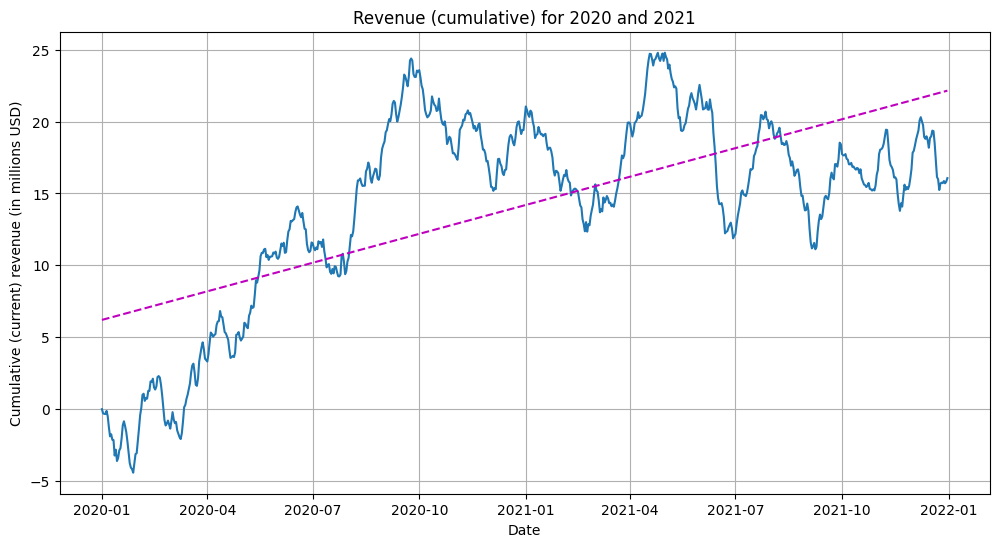

In [2]:
plt.figure(figsize=dim_figures)
plt.plot(df_mov[revenue_column])
x0 = matplotlib.dates.date2num(df_mov.index)
L0 = np.poly1d(np.polyfit(x0, df_mov[revenue_column], 1))
plt.plot(x0, L0(x0), 'm--')
plt.title('Revenue (cumulative) for 2020 and 2021')
plt.xlabel('Date')
plt.ylabel('Cumulative (current) revenue (in millions USD)')
plt.grid(True)
plt.show()

<br>
<div style="font-size:18px; font-weight:bold;">
C.2. Time step formatting
</div>
<br>

The dataset consists of two columns, `'Day'` and `'Revenue'`. As displayed in the output in the previous section, the `'Day'` column is verified to start at 1 and run consecutively to 731 with no gaps or duplicates between all 731 observations. As it's intended to represent two years' worth of data but doesn't specify a starting date, the project selected the nearest leap year of 2020 as the starting point, where `Day 1` corresponds to January 1, 2020 and `Day 731` corresponds to December 31, 2021.
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
C.3. Stationarity
</div>
<br>

The graph of the revenue over time in section C.1. shows a clear upward trend from the overlaid linear fit, starting at 0 and ending at ~16, so the initial data is not stationary. This will be discussed further in the following sections assessing necessary transformations to make the data stationary, which is determined by a line plot resembling Gaussian white noise with constant mean and variance over time. The below plot with rolling means accounted for clearly shows the data is not stationary, as the rolling mean should be constant. The augmented Dickey-Fuller test will be applied in section C.4., demonstrating the lack of stationarity numerically.

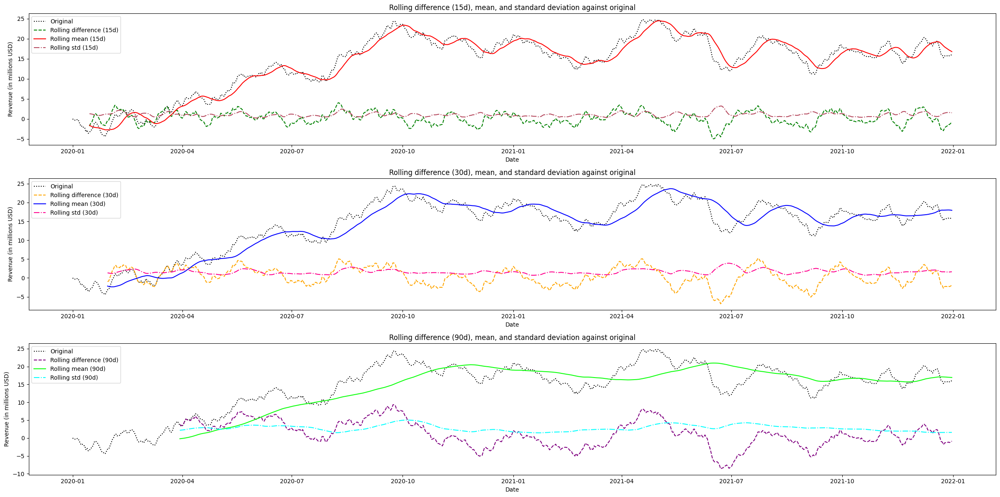

In [3]:
color_arr = [['green', 'red', 'xkcd:dark rose'], ['orange', 'blue', 'xkcd:hot pink'], ['purple', 'xkcd:neon green', 'cyan']]
fig_1 = plt.figure(figsize=(24, 12))
for i, w in enumerate([15, 30, 90]):
    fig_1.add_subplot(3, 1, i+1)
    mean_roll = df_med.rolling(w).mean()
    std_roll = df_med.rolling(w).std()
    df_roll_diff = (df_med - mean_roll).dropna()
    plt.plot(df_med['Revenue'], color='black', label='Original', linestyle='dotted')
    plt.plot(df_roll_diff['Revenue'], color=color_arr[i][0], label=f'Rolling difference ({w}d)', linestyle='dashed')
    plt.plot(mean_roll, color=color_arr[i][1], label=f'Rolling mean ({w}d)')
    plt.plot(std_roll, color=color_arr[i][2], label=f'Rolling std ({w}d)', linestyle='dashdot')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.title(f'Rolling difference ({w}d), mean, and standard deviation against original')
    plt.legend(loc='best')
plt.tight_layout()
plt.show()

<br>
<div style="font-size:18px; font-weight:bold;">
C.4. Steps to prepare the data
</div>
<br>

After loading the data, it must first be inspected for null values and duplicates. Additionally, the `'Day'` column is inspected to sequentially run from 1 to 731 with no gaps.

In [6]:
print(f"\nChecking for columns with null values: {list(df_med.columns[df_med.isna().sum() > 0])}\n")
print(f"Number of duplicated values in column 'Day': {df_med.duplicated(subset='Day').sum()}\n")
print(f"Verifying 'Day' column is sequential from 1 to 731 with no gaps:\n{df_med.Day.describe()}\n")
print(f"Differences between rows are all 1.0:\n{df_med['Day'].diff().dropna().describe()}\n")


Checking for columns with null values: []

Number of duplicated values in column 'Day': 0

Verifying 'Day' column is sequential from 1 to 731 with no gaps:
count    731.000000
mean     366.000000
std      211.165812
min        1.000000
25%      183.500000
50%      366.000000
75%      548.500000
max      731.000000
Name: Day, dtype: float64

Differences between rows are all 1.0:
count    730.0
mean       1.0
std        0.0
min        1.0
25%        1.0
50%        1.0
75%        1.0
max        1.0
Name: Day, dtype: float64



Next, to improve functionality in modeling and analysis, the integer days are converted to datetimes from 01-01-2020 through 12-31-2021. A second dataframe `df_stationary` is created by taking the first order difference and removing the singular null value left in the first observation.

In [7]:
# Adapted from Dr. Festus Elleh's “D213 Webinar Task 1 Data Preprocessing Python” lecture video, accessed 2024.
# https://wgu.hosted.panopto.com/Panopto/Pages/Viewer.aspx?id=8d32afc8-d66f-42d5-9117-b100016cf9ac

# Converts numbered day_coln to datetimes starting at January 1 of start_year.
def day_to_datetime(start_year=2020, day_coln='Day', df=df_med):
    start_month = 1
    start_day = 1
    df['Date'] = pd.date_range(start=datetime(start_year, start_month, start_day), periods=df.shape[0], freq='24h')
    df.set_index('Date', inplace=True)
    df = df.asfreq('D')
    df = df.drop(columns=[day_coln])
    return df


# Adjusting dataframe from integer numbered days to dates starting at January 1, 2020 through December 31, 2021.
df_med = day_to_datetime(2020, 'Day', df_med)
df_stationary = df_med.diff().dropna()
print(df_med)
print(df_stationary)

              Revenue
Date                 
2020-01-01   0.000000
2020-01-02  -0.292356
2020-01-03  -0.327772
2020-01-04  -0.339987
2020-01-05  -0.124888
...               ...
2021-12-27  15.722056
2021-12-28  15.865822
2021-12-29  15.708988
2021-12-30  15.822867
2021-12-31  16.069429

[731 rows x 1 columns]
             Revenue
Date                
2020-01-02 -0.292356
2020-01-03 -0.035416
2020-01-04 -0.012215
2020-01-05  0.215100
2020-01-06 -0.366702
...              ...
2021-12-27 -0.032693
2021-12-28  0.143766
2021-12-29 -0.156834
2021-12-30  0.113880
2021-12-31  0.246562

[730 rows x 1 columns]


<br>

To verify the data is stationary after applying `.diff()` once, we use the augmented Dickey-Fuller test. As discussed in Dr. Elleh's presentation (Elleh, 2024 [2]), the Dickey-Fuller test takes the null hypothesis $H_0$ that the data is non-stationary, rejecting the null hypothesis (i.e. concluding the data is stationary) when the test statistics has a p-value below the chosen power $\alpha = 0.05$.

In [9]:
# Prints results of augmented Dickey-Fuller test. Null hypothesis H_0 is the data is non-stationary.
# It's rejected (i.e. the data is stationary) for p-values below alpha = 0.05.
def aug_dfuller_testing(data):
    results_adful = adfuller(data)
    print(f"\nTest statistic: {results_adful[0]}\n")
    print(f"p-value: {results_adful[1]}\n")
    print(f"Number of lags used: {results_adful[2]}\n")
    print(f"Number of observations: {results_adful[3]}\n")
    print(f"Critical values: {results_adful[4]}\n")
    return results_adful


# Differences of one (day) make the data stationary
r_adf_trend = aug_dfuller_testing(df_med['Revenue'])
r_adf_statn = aug_dfuller_testing(df_stationary['Revenue'])


Test statistic: -2.2183190476089485

p-value: 0.19966400615064228

Number of lags used: 1

Number of observations: 729

Critical values: {'1%': -3.4393520240470554, '5%': -2.8655128165959236, '10%': -2.5688855736949163}


Test statistic: -17.374772303557062

p-value: 5.113206978840171e-30

Number of lags used: 0

Number of observations: 729

Critical values: {'1%': -3.4393520240470554, '5%': -2.8655128165959236, '10%': -2.5688855736949163}



The null hypothesis cannot be rejected for the initial dataset `df_med`, proving the data is not stationary. However, applying `.diff()` once and removing the singular null value it created in `df_stationary` finds a near infinitesimal p-value on the Dickey-Fuller test statistic, demonstrating the data is definitively stationary after applying first order differencing.

<br>

This is the line plot of the data after first order differencing:

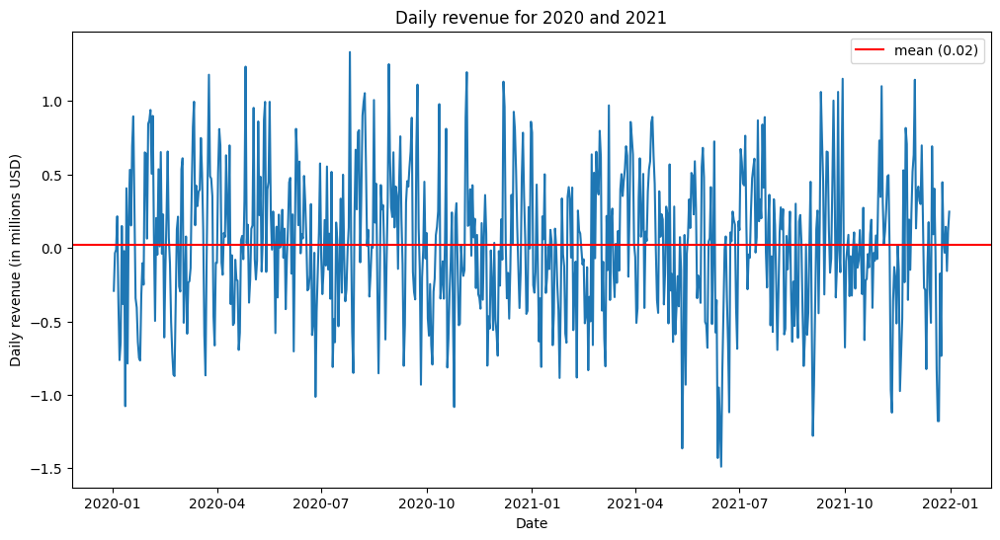

In [22]:
plt.figure(figsize=dim_figures)
plt.plot(df_stat)
plt.axhline(y=df_stat[revenue_column].mean(), color='red', label=f'mean ({round(df_stat[revenue_column].mean(), 2)})')
plt.xlabel('Date')
plt.ylabel('Daily revenue (in millions USD)')
plt.title('Daily revenue for 2020 and 2021')
plt.legend()
plt.show()

<br>

The data is now split into training and test sets (80%/20%) with chronological consistency enforced by setting `shuffle=False`. The cleaned data sets are then saved to .csv files.

In [10]:
# Splitting data into train and test sets, ending at August 7 for the training and starting at August 8
# for the test using test_size=0.2. X is the original trending data and X_statn is the stationary difference data.
X_train, X_test = train_test_split(df_med, test_size=0.2, shuffle=False)
X_statn_train, X_statn_test = train_test_split(df_stationary, test_size=0.2, shuffle=False)

# Saving processed data to csv files
if run_verbose:
    X_train.to_csv('X_train.csv')
    X_test.to_csv('X_test.csv')
    X_statn_train.to_csv('X_statn_train.csv')
    X_statn_test.to_csv('X_statn_test.csv')

<br>
<div style="font-size:18px; font-weight:bold;">
C.5. Prepared data set
</div>
<br>

See the attached files "X_train.csv" and "X_test.csv" for the non-stationary (trending) training and test data. See the attached files "X_statn_train.csv" and "X_statn_test.csv" for the stationary training and test data.
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
D.1. Report findings and visualizations
</div>
<br>

The trending data seems to show signs of seasonality, which can be examined in a number of ways. To start, a Fast Fourier Transform is used to identify the most prominent frequencies which are then converted back into seasonal lengths in days.

In [11]:
# Uses a Fast Fourier Transform on stationary data to look for prominent seasonal signals. Provides a plot and
# dictionary of the top 'max_peaks' frequencies, along with their associated periods and powers.
def seasonal_fft(max_peaks=5, df=df_stationary):
    itvl = 1.0
    fig_dims = (12, 6)

    fft_frq = np.fft.fftfreq(len(df))
    spec_pwr = np.abs(np.fft.fft(df['Revenue'])) ** 2

    plt.figure(figsize=fig_dims)
    plt.plot(fft_frq, spec_pwr)
    plt.xlabel('Frequency')
    plt.ylabel('Power')
    plt.xlim(0.0, 0.5)
    plt.title('FFT power spectrum of detrended revenue')
    plt.show()

    dom_idx = np.argsort(spec_pwr[:len(fft_frq) // 2])[::-1][:max_peaks]
    dom_pwr = spec_pwr[np.argsort(spec_pwr[:len(fft_frq) // 2])[::-1][:max_peaks]]
    dom_frqs = fft_frq[dom_idx]
    dom_periods = itvl / np.array(dom_frqs)
    dom_dict = {k: v for k, v in zip(np.round(dom_periods, 3), np.round(dom_pwr, 3))}

    print(f'Top {max_peaks} dominant frequencies: {np.round(dom_frqs, 5)}')
    print(f'Corresponding dominant periods and powers: {dom_dict}')
    return dom_dict

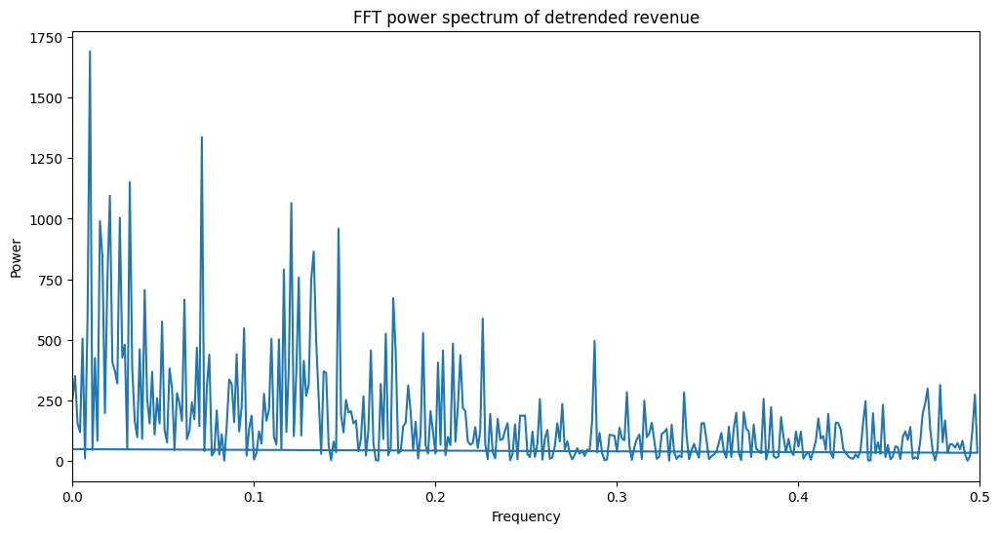

Top 7 dominant frequencies: [0.00959 0.07123 0.03151 0.02055 0.12055 0.02603 0.01507]
Corresponding dominant periods and powers: {104.286: 1691.46, 14.038: 1336.869, 31.739: 1150.716, 48.667: 1095.051, 8.295: 1064.39, 38.421: 1003.283, 66.364: 990.04}


In [12]:
fft_dict = seasonal_fft(7, df_stationary)

<br>

Seasonal lengths of 104, 14, 32, 49, 8, 38, and 66 are the most prominent, all of which are near or exact multiples of a fundamental frequency of either 7 or 8 days. Seasonality can be complex, and SARIMAX models don't readily account for multiple seasonal inputs (i.e. multiple applications of `(P, D, Q)` parameters would be extremely computationally intensive), so these potential seasonal frequencies will need to be examined individually. Initially, a fundamental frequency of 7 days agrees with weekly business operations, perhaps 8 days being present due to distortions from other independent frequencies. The strong peak at 104 days makes it a favorable starting point, as the graph of the trending revenue shows clear periodic behavior approximately every 90-100 days.

<br>

The following function uses ACF, PACF, residuals, and rolling means to inspect seasonality.

In [14]:
# Produces several plots (such as ACF, PACF, and rolling differences) to investigate seasonality. The seasonal period
# is set by 'per', 'max_lags' defines the range of most plots, and save=False by default as the global 'img_dir' at
# the top of the file is set to the local environment.
def inspect_seasonal(per=100, max_lags=600, df=df_med, save=False):
    fig_dims = (12, 6)
    # roll_window_arr = [14, 32, 104]
    roll_window_arr = [15, 30, 90]
    color_arr = [['green', 'red', 'xkcd:dark rose'], ['orange', 'blue', 'xkcd:hot pink'], ['purple', 'xkcd:neon green', 'cyan']]
    df_season = df.diff().diff(per).dropna()

    fig_0 = plt.figure(figsize=fig_dims)
    ax_0 = fig_0.add_subplot(111)
    fig_0 = plot_acf(df_stationary['Revenue'], lags=max_lags, ax=ax_0)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title('Autocorrelation on stationary revenue data vs lag')
    if save:
        plt.savefig(img_dir+'seasonal_acf_statn.png')
    plt.show()

    fig_1 = plt.figure(figsize=(24, 12))
    for i, w in enumerate(roll_window_arr):
        fig_1.add_subplot(3, 1, i+1)
        mean_roll = df.rolling(w).mean()
        std_roll = df.rolling(w).std()
        df_roll_diff = (df - mean_roll).dropna()
        plt.plot(df['Revenue'], color='black', label='Original', linestyle='dotted')
        plt.plot(df_roll_diff['Revenue'], color=color_arr[i][0], label=f'Rolling difference ({w}d)', linestyle='dashed')
        plt.plot(mean_roll, color=color_arr[i][1], label=f'Rolling mean ({w}d)')
        plt.plot(std_roll, color=color_arr[i][2], label=f'Rolling std ({w}d)', linestyle='dashdot')
        plt.xlabel('Date')
        plt.ylabel('Revenue (in millions USD)')
        plt.title(f'Rolling difference ({w}d), mean, and standard deviation against original')
        plt.legend(loc='best')
    plt.tight_layout()
    if save:
        plt.savefig(img_dir+'seasonal_rolling_diffs.png')
    plt.show()

    fig_2 = plt.figure(figsize=fig_dims)
    ax_2 = fig_2.add_subplot(111)
    fig_2 = plot_acf(df_roll_diff, lags=max_lags, ax=ax_2)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on difference of trending data with {roll_window_arr[-1]} day rolling average')
    plt.annotate(text='61', xy=(58, -0.193))
    plt.annotate(text='111', xy=(101, 0.249))
    plt.annotate(text='163', xy=(160, -0.235))
    plt.annotate(text='216', xy=(206, 0.229))
    plt.annotate(text='278', xy=(275, -0.316))
    plt.annotate(text='334', xy=(324, 0.062))
    plt.grid(True)
    if save:
        plt.savefig(img_dir+f'seasonal_rolling_diff_{roll_window_arr[-1]}_acf.png')
    plt.show()

    plt.figure(figsize=fig_dims)
    plt.plot(df_season['Revenue'])
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.title(f'Time series after first order difference then seasonal difference of {per}')
    if save:
        plt.savefig(img_dir+f'seasonal_revenue_statn_{per}.png')
    plt.show()

    fig_3 = plt.figure(figsize=fig_dims)
    ax_3 = fig_3.add_subplot(111)
    fig_3 = plot_acf(df_season, lags=max_lags, ax=ax_3)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on seasonally differenced data .diff().diff({per})')
    if save:
        plt.savefig(img_dir+f'seasonal_differenced_acf_{per}.png')
    plt.show()

    fig_4 = plt.figure(figsize=fig_dims)
    ax_4 = fig_4.add_subplot(111)
    fig_4 = plot_acf(df_season['Revenue'], lags=range(per, max_lags+1, per), ax=ax_4)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on seasonally differenced data .diff().diff({per}) by periodic increments')
    if save:
        plt.savefig(img_dir+f'seasonal_differenced_acf_periodic_{per}.png')
    plt.show()

    fig_5 = plt.figure(figsize=fig_dims)
    ax_5 = fig_5.add_subplot(111)
    fig_5 = plot_pacf(df_season['Revenue'], lags=range(per, int(max_lags/2+1), per), ax=ax_5)
    plt.xlabel('Lag')
    plt.ylabel('Partial autocorrelation')
    plt.title(f'Partial autocorrelation on seasonally differenced data .diff().diff({per}) by periodic increments')
    if save:
        plt.savefig(img_dir+f'seasonal_differenced_pacf_periodic_{per}.png')
    plt.show()

    return

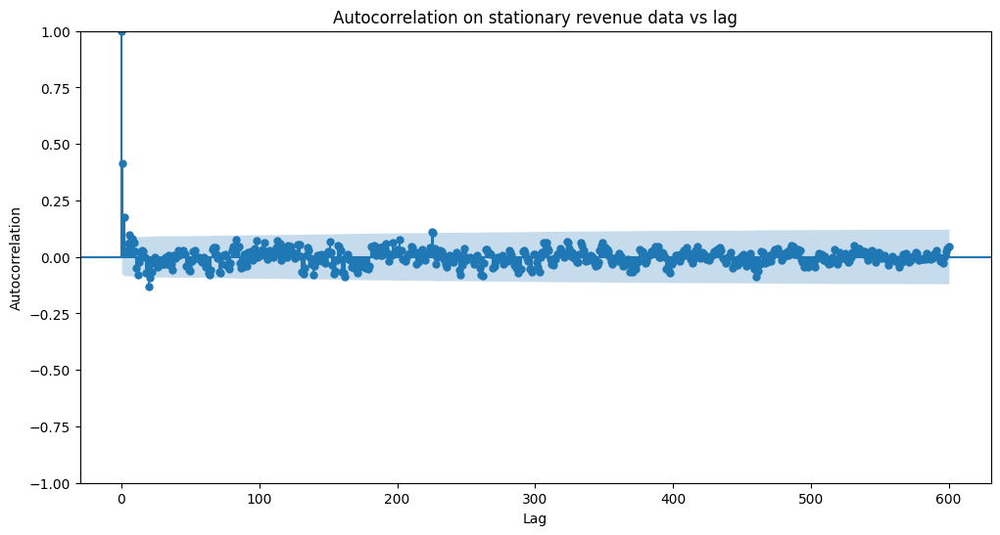

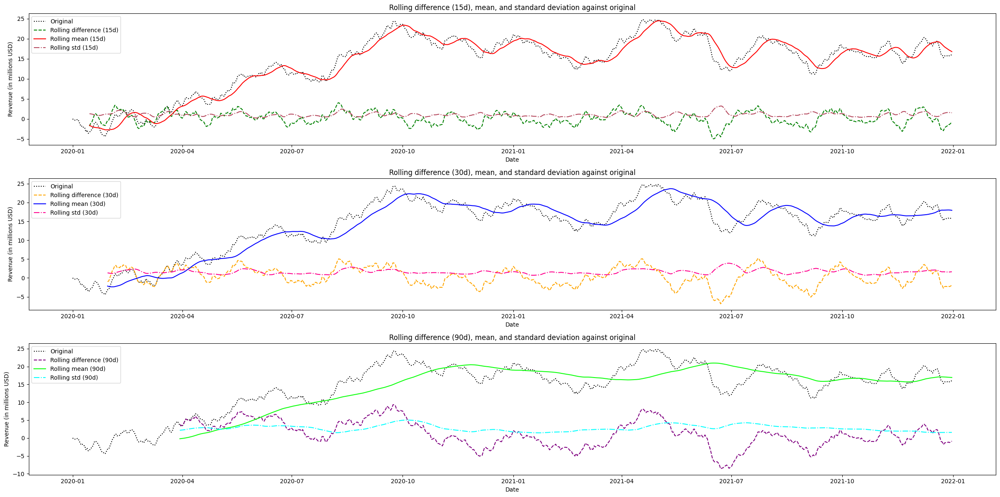

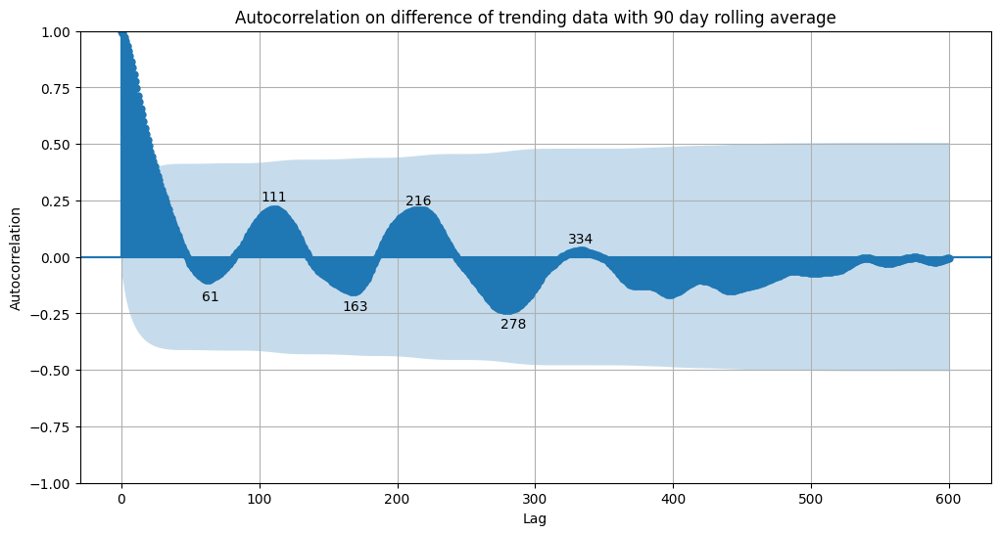

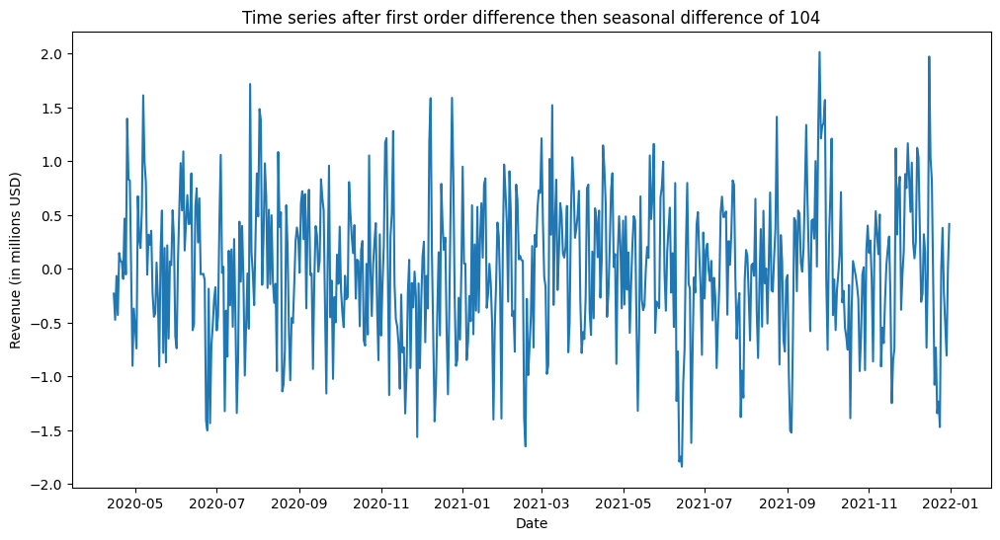

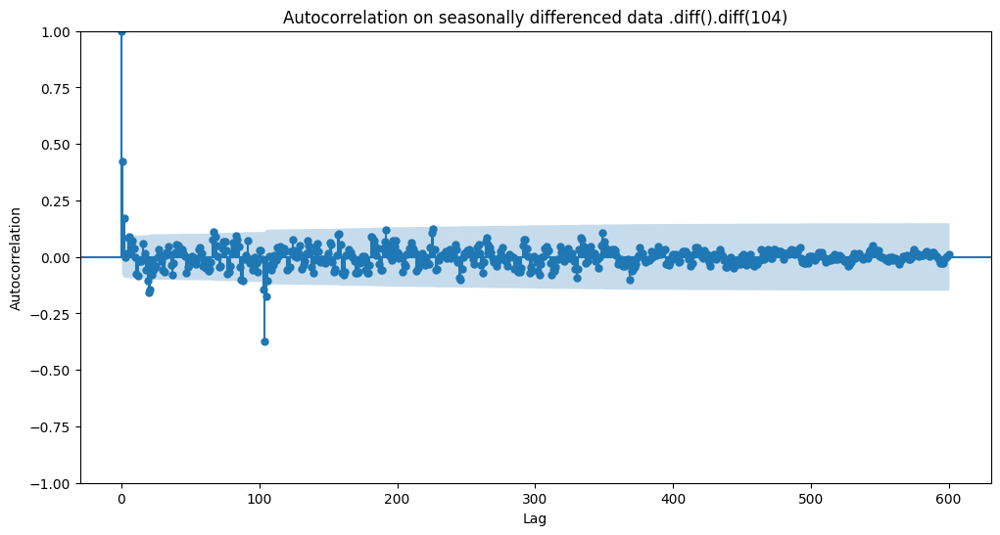

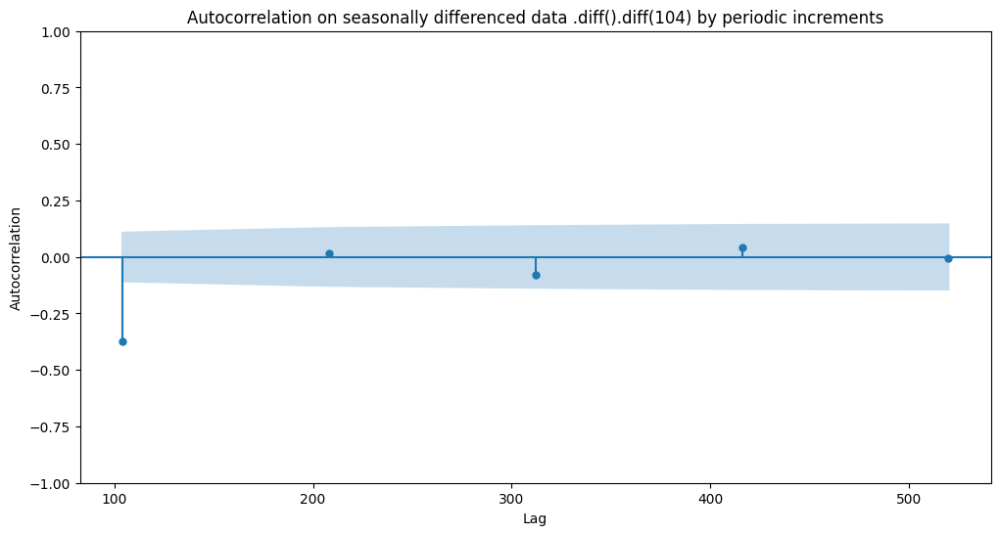

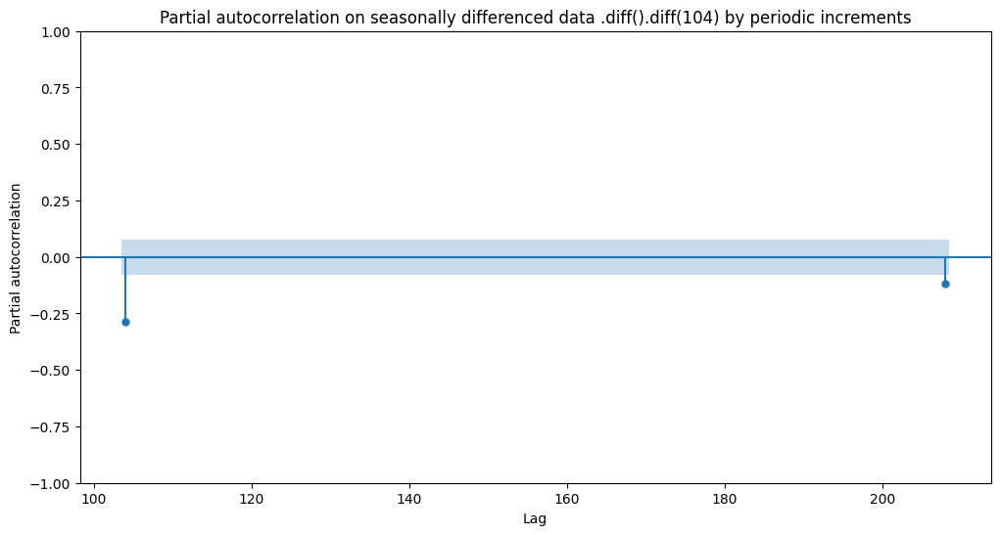

In [15]:
inspect_seasonal(104, 600, df_med, False)

<br>

The first plot shows periodic trends in the autocorrelation function on the stationary data, barely within the confidence interval ranges. This alone isn't particularly indicative of a seasonal period.

Moving to the second plot, as the rolling mean window increases, the difference between the trending data and the rolling mean more closely resembles the incremental changes (i.e. "shape" of the graph over time) of the trending data. Conversely, the rolling mean becomes loses its coherence and is a broad trend of the data.

The autocorrelation function on the difference between the trending data and 90 day rolling mean finds clear periodic behavior approximately eveyr 100 days up until day 334, after which it tails off.

The residuals visually resemble Gaussian white noise after applying first order differencing (to make the data stationary) then a seasonal difference of 104, although this will require a more detailed review.

The autocorrelation function after applying first order and 104-day seasonal differencing is smoother yet not ideal. A small peak outside of the confidence interval at ~30 could pertain to monthly cycles, while the values at 0 and 104 are expected. There's some periodicity until day ~360, but it's noisier than in the first plot, while after day ~360 it's reduced substantially. The autocorrelation values primarily are within the bounds of the confidence intervals.

Isolating the autocorrelation and partial autocorrelations values to the set period of 104 days, we see fairly small values in favor of using a 104 day seasonal period. Of course, it's less than perfect, but as previously stated, the model is in practice (for the scope of this project) limited to selecting a single seasonal period. It remains to demonstrate that 104 days is the best choice over 7 or 8 as a fundamental frequency or another (near) multiple such as 14 or 32.

<br>

The next function creates a grid of 16 plots for the data's seasonal decomposition, residuals, their autocorrelation functions, for a selected period `perd` on both the trending data and stationary data (i.e. first order differencing in `df_stationary`).

In [16]:
# Creates 16 subplots of seasonal decomposition seasonal and residual components on trending and stationary data,
# along with their corresponding autocorrelation functions.
def seasonal_plots(perd, save=False, df_mov=df_med, df_statn=df_stationary):
    max_lags = perd * 3
    decomp_mov = seasonal_decompose(df_mov['Revenue'], period=perd)
    fig1 = plt.figure(figsize=(24, 12))
    fig1.add_subplot(4, 4, 1)
    plt.plot(decomp_mov.resid)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Residuals of seasonal decomposition of trending revenue (period {perd})')

    fig1.add_subplot(4, 4, 2)
    plt.plot(decomp_mov.seasonal)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Seasonal decomposition of trending revenue (period {perd})')

    plot_acf(decomp_mov.resid.dropna(), lags=max_lags, ax=fig1.add_subplot(4, 4, 3))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on non-stationary residuals (period {perd})')

    plot_acf(decomp_mov.seasonal, lags=max_lags, ax=fig1.add_subplot(4, 4, 4))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on non-stationary seasonal component (period {perd})')

    decomp_mov = seasonal_decompose(df_mov['Revenue'])
    fig1.add_subplot(4, 4, 5)
    plt.plot(decomp_mov.resid)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Residuals of seasonal decomposition of trending revenue (no period)')

    fig1.add_subplot(4, 4, 6)
    plt.plot(decomp_mov.seasonal)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title('Seasonal decomposition of trending revenue (no period)')

    plot_acf(decomp_mov.resid.dropna(), lags=max_lags, ax=fig1.add_subplot(4, 4, 7))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on non-stationary residuals (no period))')

    plot_acf(decomp_mov.seasonal, lags=max_lags, ax=fig1.add_subplot(4, 4, 8))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on non-stationary seasonal component (no period)')

    decomp_stat = seasonal_decompose(df_statn['Revenue'], period=perd)
    fig1.add_subplot(4, 4, 9)
    plt.plot(decomp_stat.resid)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Residuals of seasonal decomposition of stationary revenue (period {perd})')

    fig1.add_subplot(4, 4, 10)
    plt.plot(decomp_stat.seasonal)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Seasonal decomposition of stationary revenue (period {perd})')

    plot_acf(decomp_stat.resid.dropna(), lags=max_lags, ax=fig1.add_subplot(4, 4, 11))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on stationary residuals with period {perd}')

    plot_acf(decomp_stat.seasonal, lags=max_lags, ax=fig1.add_subplot(4, 4, 12))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on stationary seasonal component with period {perd}')

    decomp_stat = seasonal_decompose(df_statn['Revenue'])
    fig1.add_subplot(4, 4, 13)
    plt.plot(decomp_stat.resid)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Residuals of seasonal decomposition of stationary revenue (no period)')

    fig1.add_subplot(4, 4, 14)
    plt.plot(decomp_stat.seasonal)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title('Seasonal decomposition of stationary revenue (no period)')

    plot_acf(decomp_stat.resid.dropna(), lags=max_lags, ax=fig1.add_subplot(4, 4, 15))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on stationary residuals (no period))')

    plot_acf(decomp_stat.seasonal, lags=max_lags, ax=fig1.add_subplot(4, 4, 16))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on stationary seasonal component (no period))')

    plt.tight_layout()
    if save:
        plt.savefig(img_dir+f'seasonal_plots_{perd}.png')
    plt.show()
    return

<br>

First, for a seasonal period of 104 days:

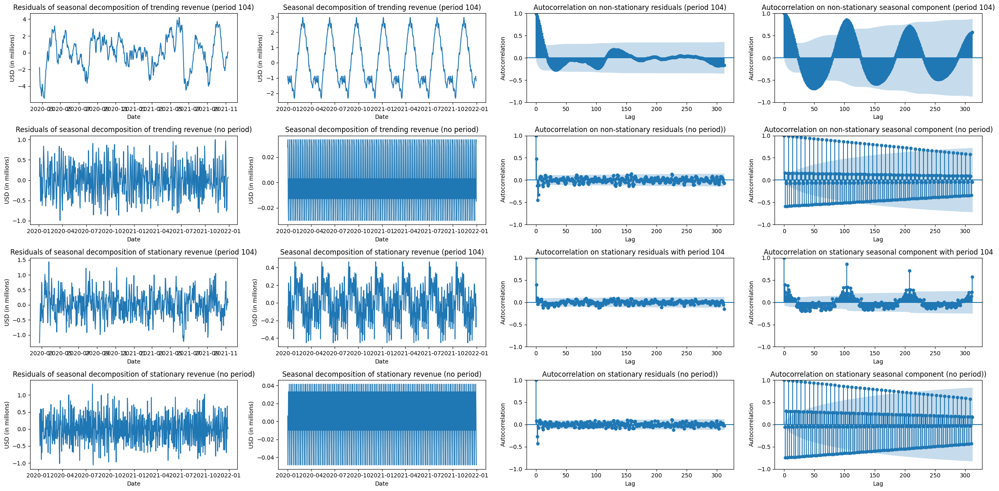

In [17]:
seasonal_plots(104, False, df_med, df_stationary)

<br>

Then for a seasonal period of 32 days to compare:

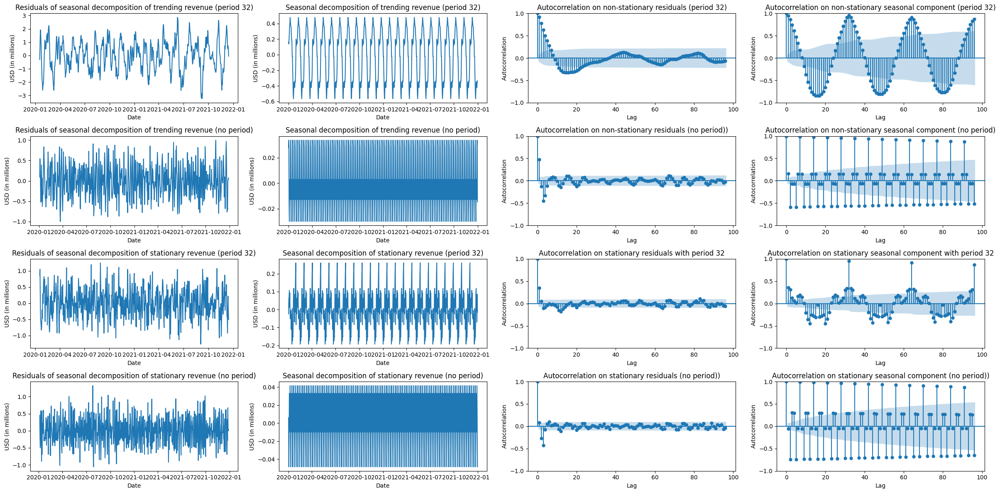

In [19]:
seasonal_plots(32, False, df_med, df_stationary)

<br>

And once again for a period of 8 days:

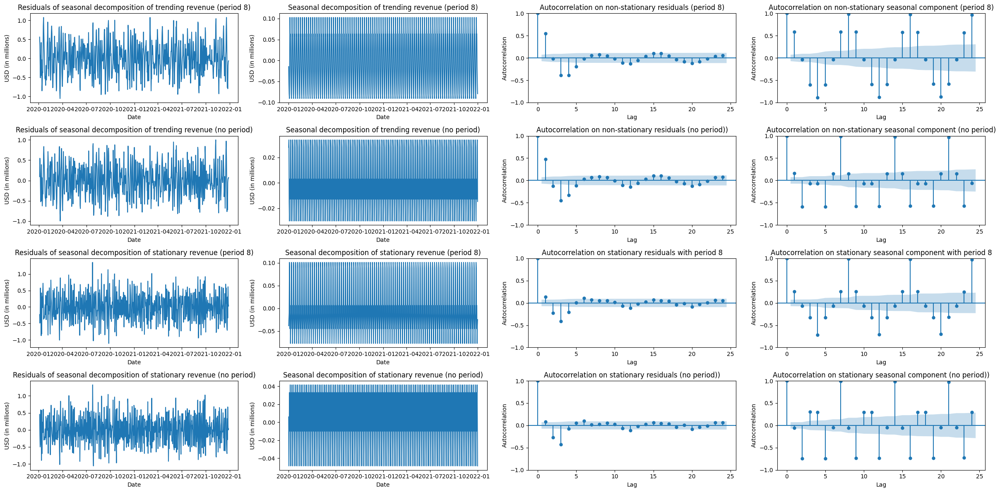

In [20]:
seasonal_plots(8, False, df_med, df_stationary)

<br>

As the seasonal period increases, the residuals of the trending data from the seasonal decomposition become "wider" in the sense that local extrema (peaks) are less frequent. Similarly, the seasonal component of the decomposition is also less narrow as the seasonal period increases. Most importantly, studying the autocorrelation functions finds more of the values within the confidence bands for a period of 104 compared to 32 or 8. The stationary residuals' ACF is virtually flat. Although there may be a fundamental seasonal period of 8 days, realistically the business will have various factors affecting its revenue at different points, such as some bills and salaries being paid weekly, biweekly, monthly, or quarterly. Assessing the intricacies of multiple signals of varying frequencies is well beyond the scope of this project, which ultimately must select the best possible seasonal frequency. From the above, it's determined that a seasonal period of 104 days is the optimal choice for a SARIMAX model. Section D.2. will discuss comparisons of different parameters for models, which found superior models across all metrics when using a period of 104 days.

<br>

Below is the seasonal decomposition produced by `seasonal_decompose` on the trending data, using a period of 90 days to compare with the plots displayed above.

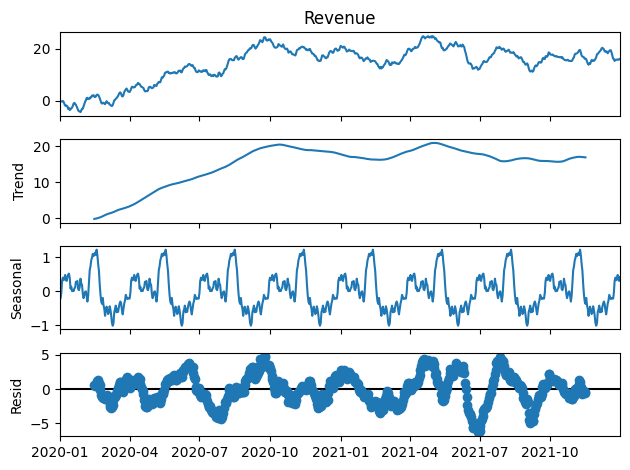

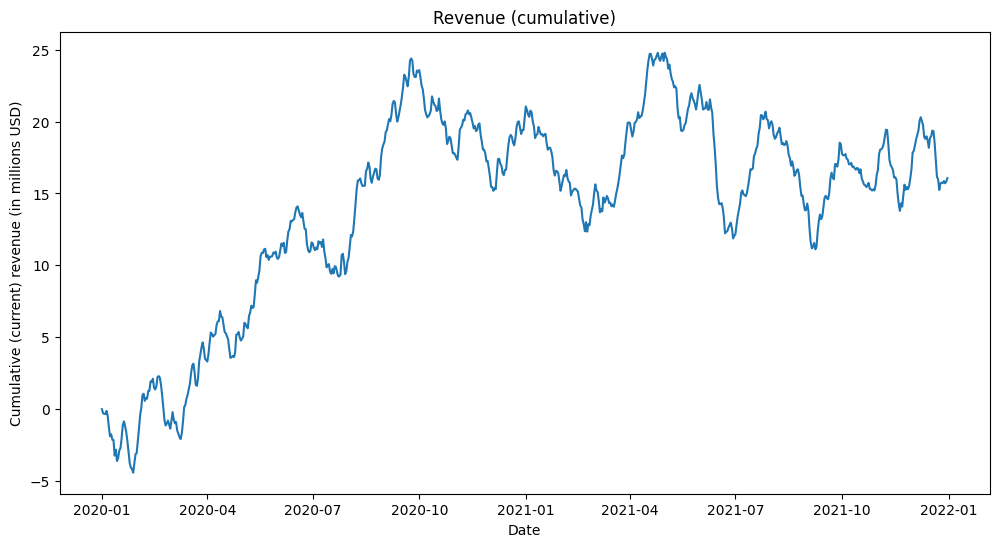

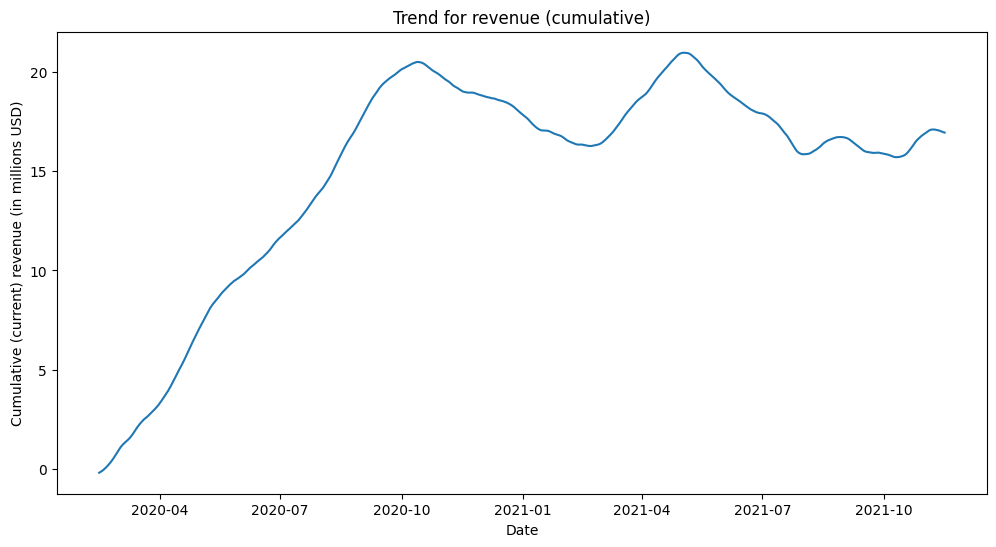

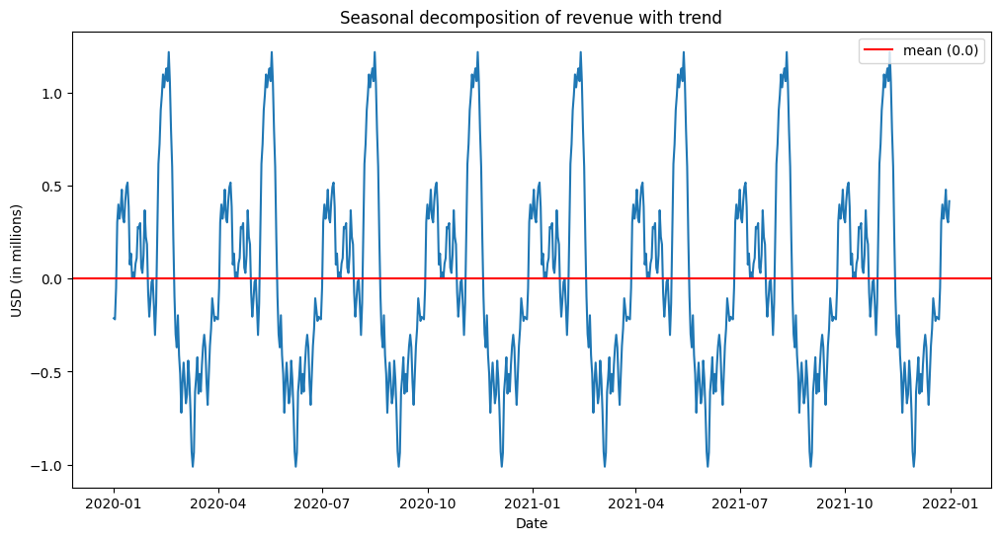

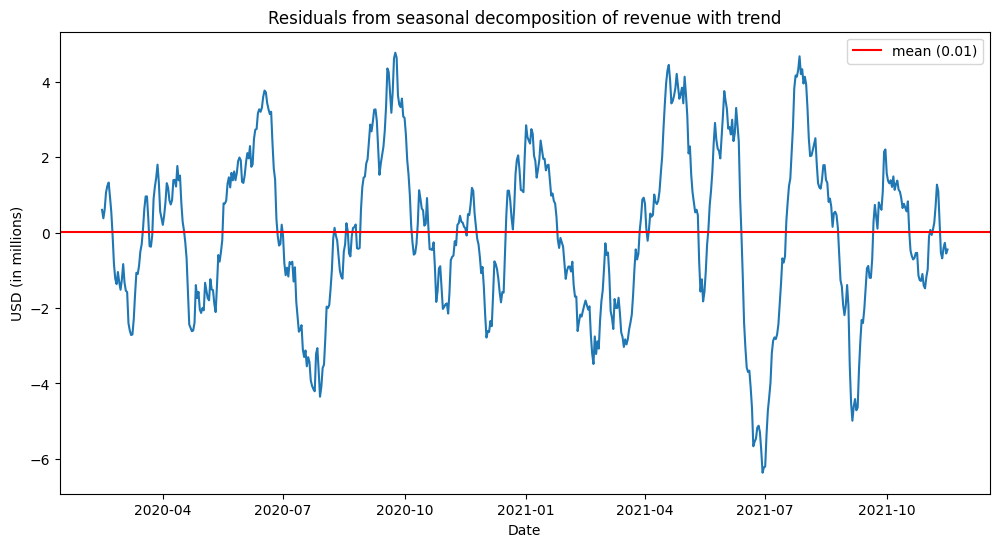

In [30]:
decomp_mov = seasonal_decompose(df_mov[revenue_column], period=prd)
decomp_mov.plot()
plt.show()

plt.figure(figsize=dim_figures)
plt.plot(decomp_mov.observed)
plt.xlabel('Date')
plt.ylabel('Cumulative (current) revenue (in millions USD)')
plt.title('Revenue (cumulative)')
plt.show()

plt.figure(figsize=dim_figures)
plt.plot(decomp_mov.trend)
plt.xlabel('Date')
plt.ylabel('Cumulative (current) revenue (in millions USD)')
plt.title('Trend for revenue (cumulative)')
plt.show()

plt.figure(figsize=dim_figures)
plt.plot(decomp_mov.seasonal)
plt.axhline(y=decomp_mov.seasonal.mean(), color='red', label=f'mean ({round(decomp_mov.seasonal.mean(), 2)})')
plt.xlabel('Date')
plt.ylabel('USD (in millions)')
plt.title('Seasonal decomposition of revenue with trend')
plt.legend()
plt.show()

plt.figure(figsize=dim_figures)
plt.plot(decomp_mov.resid)
plt.axhline(y=decomp_mov.resid.mean(), color='red', label=f'mean ({round(decomp_mov.resid.mean(), 2)})')
plt.xlabel('Date')
plt.ylabel('USD (in millions)')
plt.title('Residuals from seasonal decomposition of revenue with trend')
plt.legend()
plt.show()

<br>

The trend shows a roughly linear increase for about the first ten months before leveling off and oscillating for the remaining 14 months. The seasonal component shows clear periodic behavior with a magnitude varying approximately from -1.0 to 1.0. As this is on the trending data, the residual magnitudes are less important than the overall lack of a defined period or trending behavior (i.e. noisy).

<br>

This is now compared with the seasonal decomposition of the stationary data again using a period of 90 days:

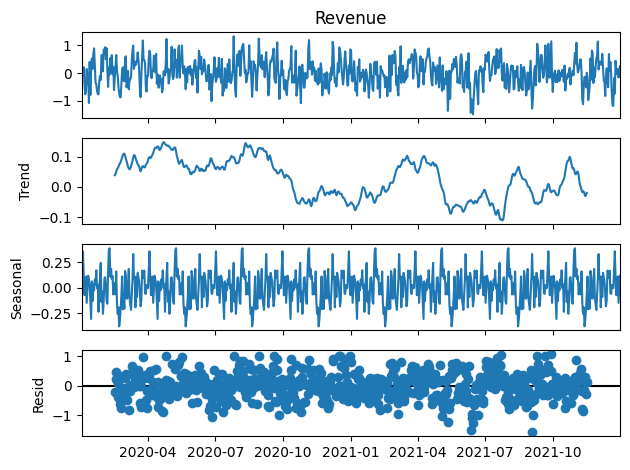

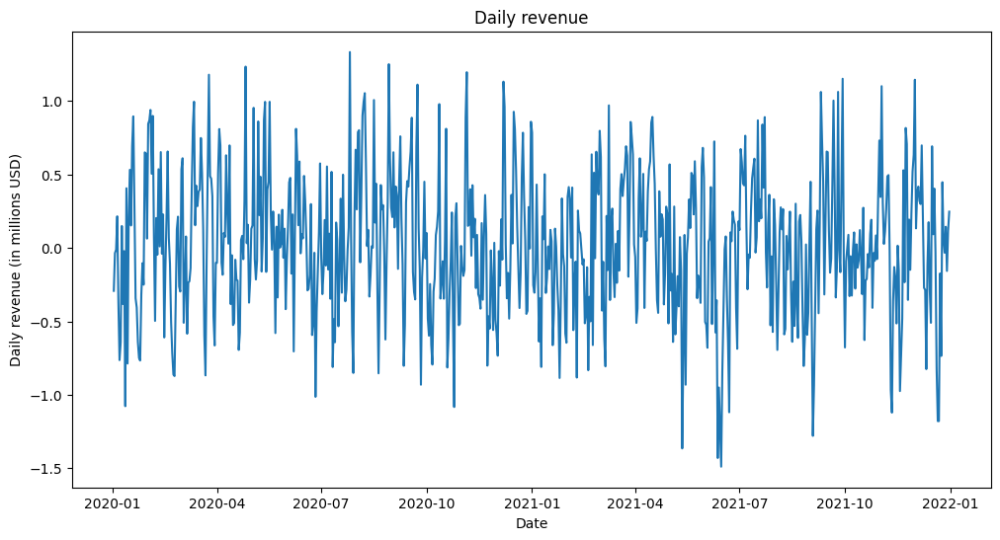

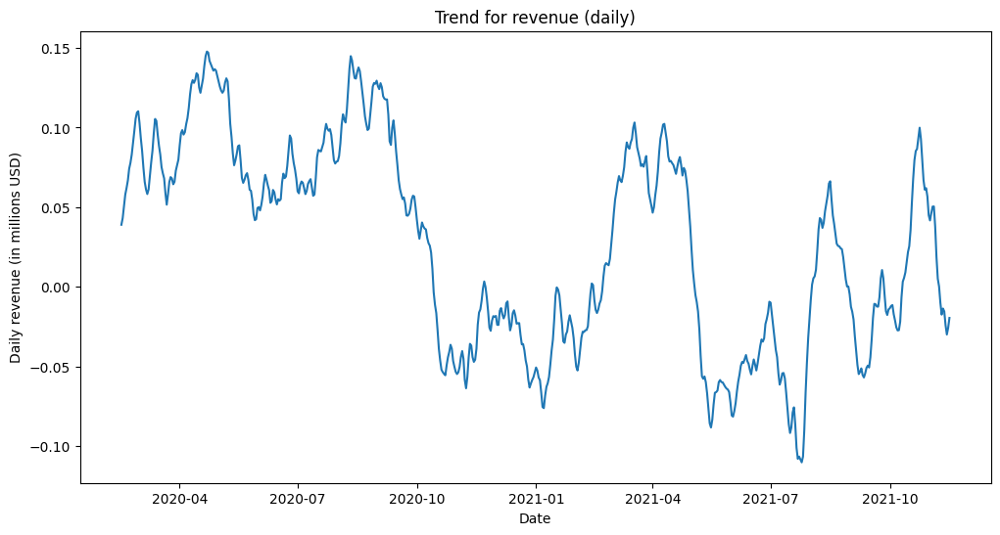

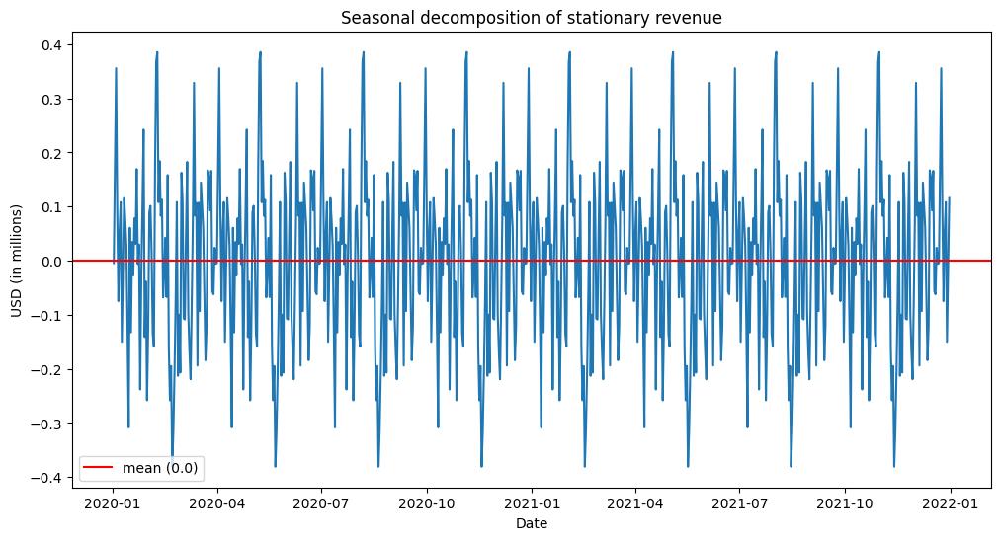

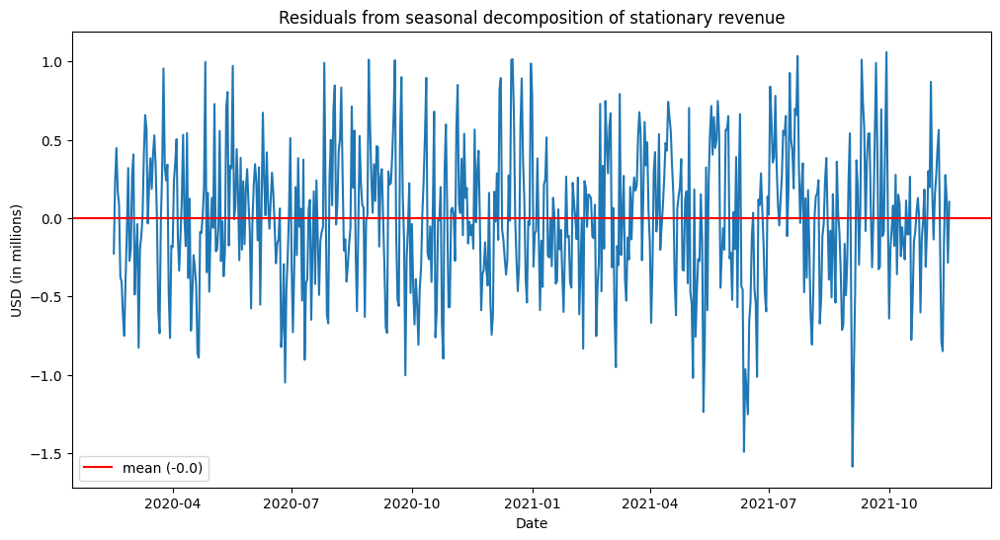

In [34]:
decomp_stat = seasonal_decompose(df_stat[revenue_column], period=prd)
decomp_stat.plot()
plt.show()

plt.figure(figsize=dim_figures)
plt.plot(decomp_stat.observed)
plt.xlabel('Date')
plt.ylabel('Daily revenue (in millions USD)')
plt.title('Daily revenue')
plt.show()

plt.figure(figsize=dim_figures)
plt.plot(decomp_stat.trend)
plt.xlabel('Date')
plt.ylabel('Daily revenue (in millions USD)')
plt.title('Trend for revenue (daily)')
plt.show()

plt.figure(figsize=dim_figures)
plt.plot(decomp_stat.seasonal)
plt.axhline(y=decomp_stat.seasonal.mean(), color='red', label=f'mean ({round(decomp_stat.seasonal.mean(), 2)})')
plt.xlabel('Date')
plt.ylabel('USD (in millions)')
plt.title('Seasonal decomposition of stationary revenue')
plt.legend()
plt.show()

plt.figure(figsize=dim_figures)
plt.plot(decomp_stat.resid)
plt.axhline(y=decomp_stat.resid.mean(), color='red', label=f'mean ({round(decomp_stat.resid.mean(), 2)})')
plt.xlabel('Date')
plt.ylabel('USD (in millions)')
plt.title('Residuals from seasonal decomposition of stationary revenue')
plt.legend()
plt.show()

<br>

On the stationary data, the decomposed trend values have no clear periodic behavior and have very small magnitudes on the order of 0.1 compared to overall stationary magnitudes of 1.0. Although compressed, the seasonal component shows periodic behavior on the magnitude of 0.4. The residuals resemble noise with no clear trends.

<br>

The autocorrelation function on the trending data across all possible lags:

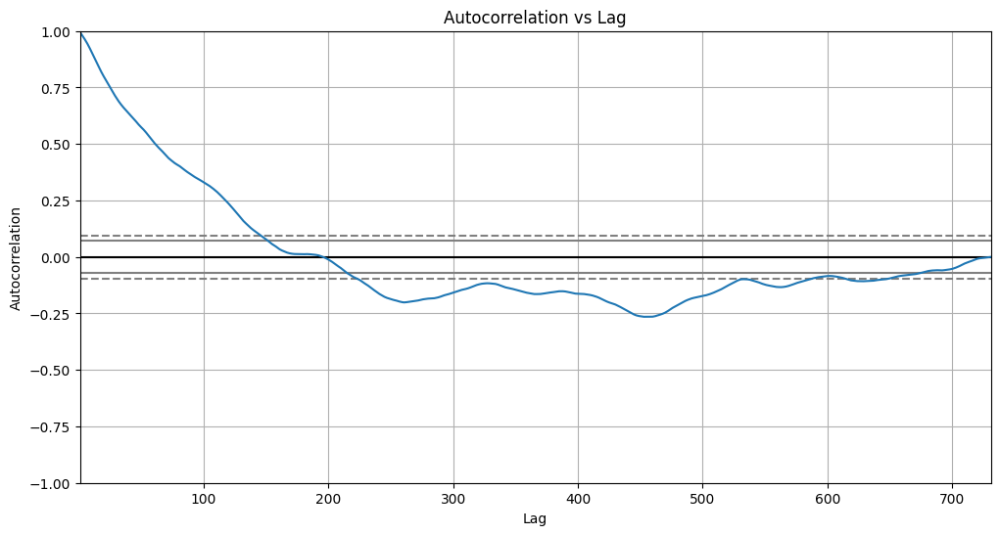

In [35]:
plt.figure(figsize=dim_figures)
autocorrelation_plot(df_mov[revenue_column].tolist())
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation vs Lag')
plt.show()

<br>

The autocorrelation function on the trending data up to 30 lags:

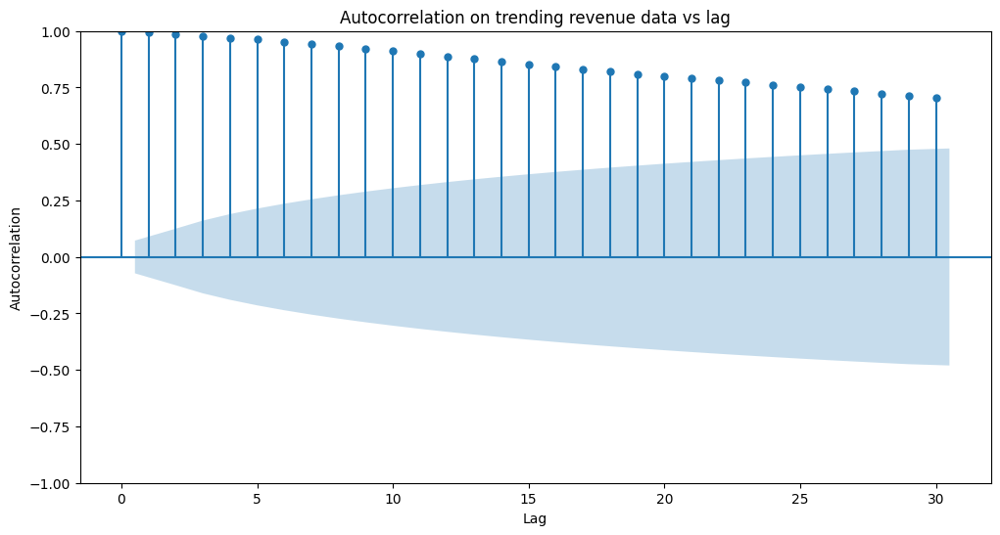

In [36]:
fig_0 = plt.figure(figsize=dim_figures)
ax_0 = fig_0.add_subplot(111)
fig_0 = plot_acf(df_mov[revenue_column], lags=30, ax=ax_0)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation on trending revenue data vs lag')
plt.show()

<br>

The partial autocorrelation function on the trending data up to 30 lags:

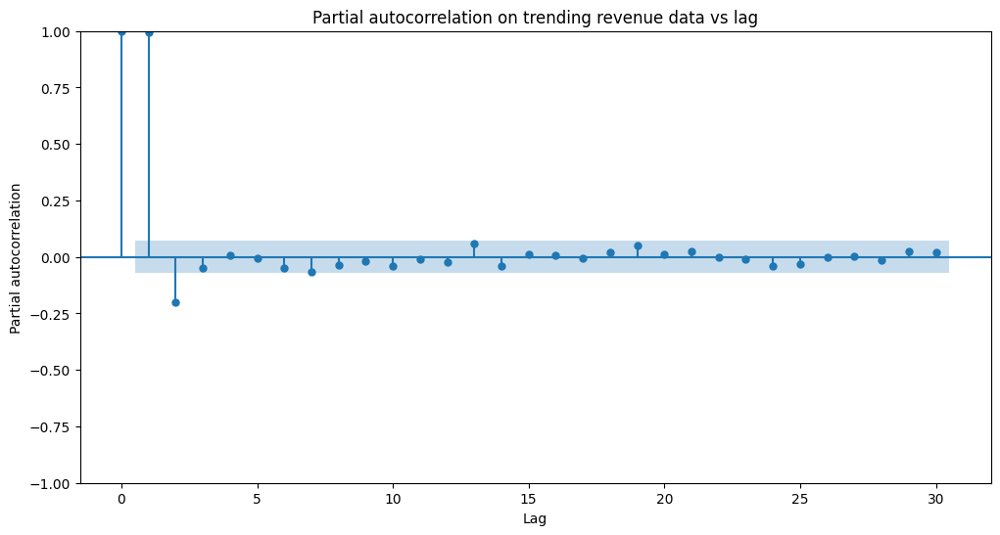

In [37]:
fig_1 = plt.figure(figsize=dim_figures)
ax_1 = fig_1.add_subplot(111)
fig_1 = plot_pacf(df_mov[revenue_column], lags=30, ax=ax_1)
plt.xlabel('Lag')
plt.ylabel('Partial autocorrelation')
plt.title('Partial autocorrelation on trending revenue data vs lag')
plt.show()

<br>

The autocorrelation function on the stationary data up to 30 lags:

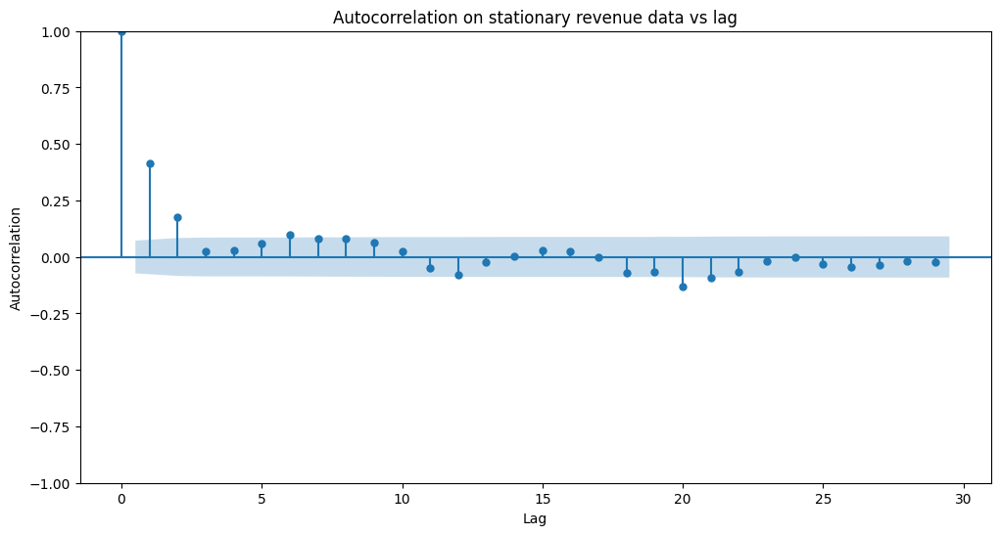

In [38]:
fig_2 = plt.figure(figsize=dim_figures)
ax_2 = fig_2.add_subplot(111)
fig_2 = plot_acf(df_stat[revenue_column], ax=ax_2)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation on stationary revenue data vs lag')
plt.show()

The ACF looks to turn off at 2, although it arguably decays to 0 with lag = 2 being the last value appreciably outside of the confidence band. The SARIMAX model may have $q = 2$, but this will require additional verification.

<br>

The partial autocorrelation function on the stationary data up to 30 lags:

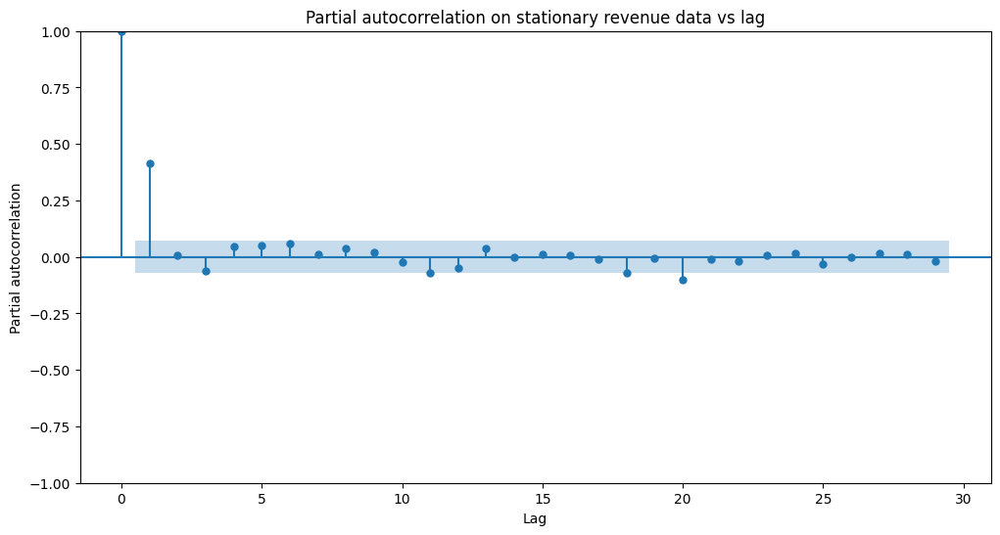

In [39]:
fig_3 = plt.figure(figsize=dim_figures)
ax_3 = fig_3.add_subplot(111)
fig_3 = plot_pacf(df_stat[revenue_column], ax=ax_3)
plt.xlabel('Lag')
plt.ylabel('Partial autocorrelation')
plt.title('Partial autocorrelation on stationary revenue data vs lag')
plt.show()

The PACF looks to turn off after lag = 1, indicating $p = 1$. As this is an ambiguous situation with a mixed model, more work will need to be done in section D.2. to determine the best model parameters.

<br>

The spectral density on the trending data:

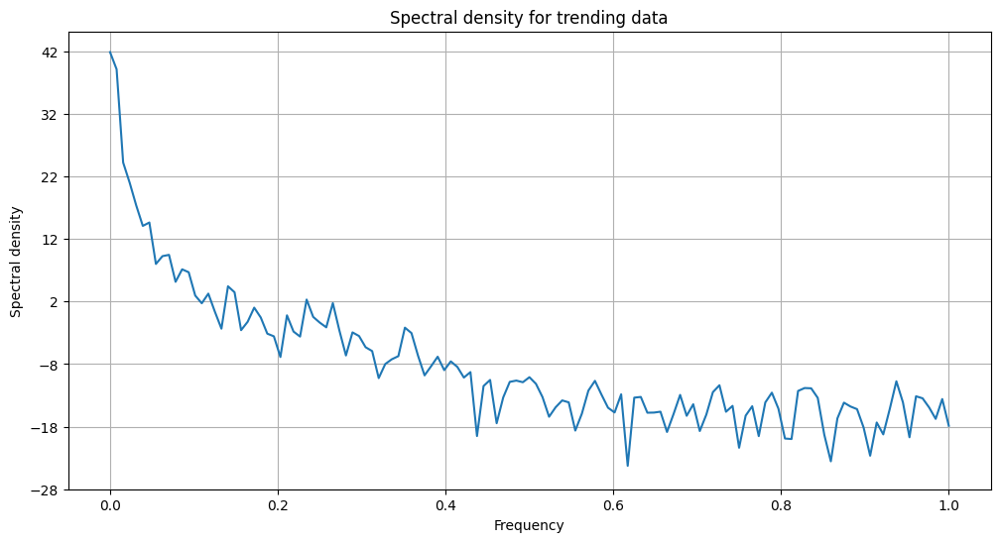

In [40]:
plt.figure(figsize=dim_figures)
plt.psd(df_mov[revenue_column])
plt.title('Spectral density for trending data')
plt.xlabel('Frequency')
plt.ylabel('Spectral density')
plt.grid(True)
plt.show()

<br>

The spectral density on the stationary data:

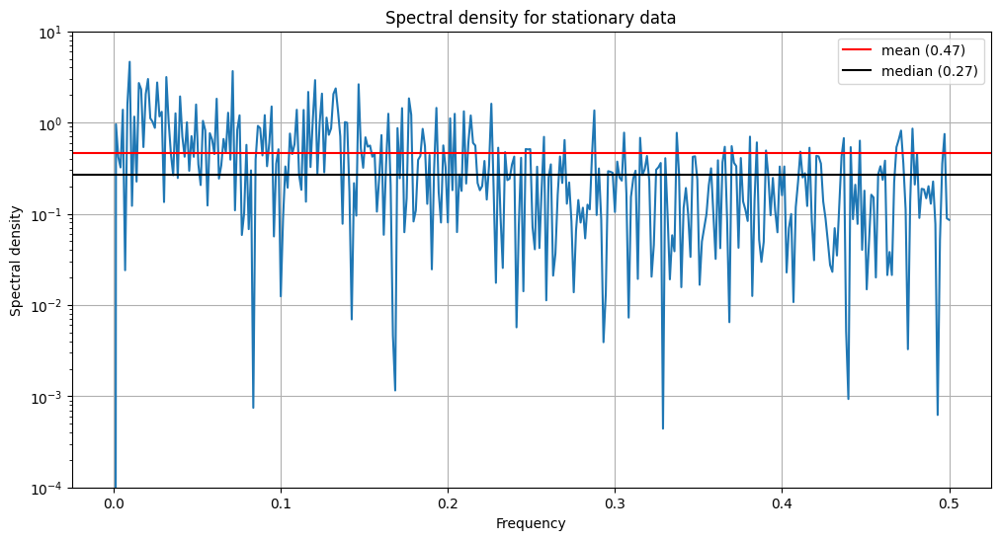

In [41]:
f, sp_den = periodogram(df_stat[revenue_column])
plt.figure(figsize=dim_figures)
plt.semilogy(f, sp_den)
plt.axhline(y=sp_den.mean(), color='red', label=f'mean ({round(sp_den.mean(), 2)})')
tmp_arr = sorted(sp_den)
sp_den_median = tmp_arr[int(len(sp_den)/2)]
plt.axhline(y=sp_den_median, color='black', label=f'median ({round(sp_den_median, 2)})')
plt.ylim([1e-4, 1e1])
plt.title('Spectral density for stationary data')
plt.xlabel('Frequency')
plt.ylabel('Spectral density')
plt.grid(True)
plt.legend()
plt.show()

<br>

This could be used to identify seasonal components, although this was done previously with the Fast Fourier Transform.

<br>
<div style="font-size:18px; font-weight:bold;">
D.2. ARIMA model
</div>
<br>

The SARIMAX model is defined primarily by the parameters $(p, d, q)$ and $(P, D, Q)$, along with a seasonal period currently favoring 104 days. From the work in the previous section, it's been determined that first order differencing is sufficient to make the data stationary on both $d$ and $D$. The model may be mixed, so the usual diagnosis of $p = 1$ from the ACF and $q = 2$ from the PACF isn't necessarily valid. To assist with this, `auto_arima` could be used. Unnfortunately, it struggles with memory management when incorporating seasonality, nor did it always find the best solution. Although more time consuming, memory consumed by models was released by using the following function. It assesses model viability by AIC and also incorporates the p-values of the Ljung-Box test and the model's coefficients to avoid suggesting unreliable models. A threshold of 0.05 for the Ljung-Box test and 0.10 for p-values on model coefficients was used.

In [42]:
# Adapted from Dr. Festus Elleh's “Task 1 Building Arima Model in Python video” lecture video, accessed 2024.
# https://wgu.hosted.panopto.com/Panopto/Pages/Viewer.aspx?id=1aaf2389-6483-4000-b498-b14f00441d57

# Selects ARIMA model with the lowest AIC and Ljung-Box statistic greater than lb_thresh = 0.05 and model
# coefficients with p-values below z_thresh = 0.10. Default value of d is 1 while p and q are looped from 0 to pq_rng-1.
# The SARIMAX trend parameter is looped over the array [None, 'c']. The models' AIC, smallest Ljung-Box value,
# largest p-value on model coefficients, and RSS values are placed in a dictionary with key (p, d, q, f_trend). The
# function returns the best model (lowest AIC and Ljung-Box > lb_thresh and coefficient p-values below z_thresh) and
# a dataframe for the models' AIC, smallest Ljung-Box value, the largest p-value for its coefficients, and RSS values
# (indexed by (p, d, q, f_trend) tuples). Methods other than 'lbfgs' were tried when fitting, but they all periodically 
# had convergence issues.
def aic_arima_search(pq_rng, d=1, data=X_train, season_param=None):
    # Could include 't', 'ct', or other options, but anything other than None or 'c' consistently created poor models
    trend_arr = [None, 'c']
    lb_thresh = 0.05
    z_thresh = 0.10
    mthd = 'lbfgs'

    aic_dict = {}
    best_aic = np.inf
    best_order = None
    best_model = None
    best_lb = None
    best_z_max = None

    for p in range(pq_rng):
        for q in range(pq_rng):
            for f_trend in trend_arr:
                try:
                    tmp_model = SARIMAX(data, order=(p, d, q), seasonal_order=season_param, trend=f_trend, freq='D')
                    tmp_results = tmp_model.fit(method=mthd, maxiter=100)
                    tmp_aic = tmp_results.aic
                    tmp_rss_mov = sum((tmp_results.fittedvalues - data['Revenue'])**2)
                    # When d != 1 this needs to be rewritten as nested diff()^d - this is currently a placeholder functional when d = 1
                    tmp_rss_statn = sum((tmp_results.fittedvalues.diff(d).dropna() - data['Revenue'].diff(d).dropna())**2)
                    tmp_ljung_box_results = acorr_ljungbox(tmp_results.filter_results.standardized_forecasts_error[0], lags=10, return_df=True)
                    tmp_lb_min = tmp_ljung_box_results['lb_pvalue'].min()
                    tmp_z_score_arr = []
                    for i in range(1, len(tmp_results.summary().tables[1])):
                        tmp_z_score_arr.append(float(str(tmp_results.summary().tables[1][i][4])))
                    tmp_z_max = max(tmp_z_score_arr)
                    aic_dict[(p, d, q, f_trend)] = (tmp_results.aic, tmp_lb_min, tmp_z_max, tmp_rss_statn, tmp_rss_mov)
                    print("p, d, q, f_trend: ", p, d, q, f_trend)
                    print("AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary): ", tmp_results.aic, tmp_results.bic, tmp_lb_min, tmp_z_max, tmp_rss_statn)
                    if tmp_aic < best_aic and tmp_lb_min > lb_thresh and tmp_z_max <= z_thresh:
                        best_aic = tmp_aic
                        best_order = (p, d, q, f_trend)
                        best_model = tmp_model
                        best_lb = tmp_lb_min
                        best_z_max = tmp_z_max
                except:
                    print(f"Encountered an error with the above SARIMAX model on (p, d, q) = {(p, d, q)} and trend = '{f_trend}'.\n")
                    print(p, d, q, None, None)

    print(f"\nBest AIC: {best_aic} | Order: {best_order} | Ljung-Box: {best_lb} | Largest coefficient p-value: {best_z_max} | Seasonal order fixed at {season_param}")
    aic_dict = {k: v for k, v in sorted(aic_dict.items(), key=lambda s: s[1][0])}
    df_aic = pd.DataFrame.from_dict(aic_dict, orient='index', columns=['AIC', 'Ljung-Box min', 'Largest coef p-value', 'RSS (stationary)', 'RSS (with trend)'])
    with pd.option_context('display.max_rows', None):
        print(f"\nModels with Ljung-Box p-values above {lb_thresh}:\n")
        print(df_aic[df_aic['Ljung-Box min'] > lb_thresh])
        print(f"\nModels with Ljung-Box p-values above {lb_thresh} and coefficient p-values below {z_thresh}:\n")
        print(df_aic[(df_aic['Ljung-Box min'] > lb_thresh) & (df_aic['Largest coef p-value'] <= z_thresh)])
    print("Best model:\n", best_model.fit(method=mthd, maxiter=100).summary())
    return best_model, df_aic

In [21]:
b_model, b_aic = aic_arima_search(3, 1, X_train, (2, 1, 0, 104))

p, d, q, f_trend:  0 1 0 None
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  842.7209589439852 855.236060736218 2.2484946329382223e-25 0.0 220.0159443545302
p, d, q, f_trend:  0 1 0 c
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  842.8719208047273 859.5587231943709 2.572873709906637e-25 0.183 219.87907078166623
p, d, q, f_trend:  0 1 1 None
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  771.4604627113063 788.1472651009499 1.645945930742926e-05 0.0 289.47245883403724
p, d, q, f_trend:  0 1 1 c
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  772.1352897728922 792.9937927599467 1.7312115979268168e-05 0.255 289.06029695674465
p, d, q, f_trend:  0 1 2 None
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  751.4307942662888 772.2892972533433 0.6814481040745597 0.0 295.3992793253318
p, d, q, f_trend:  0 1 2 c
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  752.4729478383289 777.503151

C:\Users\Joe\Desktop\Files\Programming\WGU MS\Python_projects\.venv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Joe\Desktop\Files\Programming\WGU MS\Python_projects\.venv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


p, d, q, f_trend:  2 1 1 None
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  757.0315206555731 782.0617242400386 0.13384140771822645 0.093 292.0109658904266


C:\Users\Joe\Desktop\Files\Programming\WGU MS\Python_projects\.venv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Joe\Desktop\Files\Programming\WGU MS\Python_projects\.venv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


p, d, q, f_trend:  2 1 1 c
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  758.1967900007118 787.3986941825882 0.12809838511612207 0.369 291.48054388971923
p, d, q, f_trend:  2 1 2 None
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  754.0324133511022 783.2343175329786 0.9045972540432836 0.967 295.117881017848
p, d, q, f_trend:  2 1 2 c
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  754.959965587064 788.3335703663513 0.9128903215523925 0.941 294.58741600247316

Best AIC: 751.4307942662888 | Order: (0, 1, 2, None) | Ljung-Box: 0.6814481040745597 | Largest coefficient p-value: 0.0 | Seasonal order fixed at (2, 1, 0, 104)

Models with Ljung-Box p-values above 0.05:

                        AIC  Ljung-Box min  Largest coef p-value  \
(0, 1, 2, None)  751.430794       0.681448                 0.000   
(0, 1, 2, c)     752.472948       0.683437                 0.333   
(1, 1, 2, None)  753.367386       0.683518                 0.826   
(

<br>

Another test performed produced this output:

<br>

`aic_arima_search(3, 1, X_train, (2, 1, 0, 104))` found an acceptable model of AIC 751.431 with parameters (0, 1, 2) when using fixed seasonal parameters of (2, 1, 0)[104]. The second output found a model of AIC 748.202 using (0, 1, 2)(0, 1, 1)[100]. Although this is an improvement, later testing found models with seasonal parameters (0, 1, 1)[100] did not extend well to the test data, producing poor results in terms of MAE and RMSE.

Extensive testing was done on many different sets of parameters (not all shown) produced by `aic_arima_search` and a few instances of `auto_arima`. It would be cluttered to depict dozens of model summaries, so the function `model_creation` below can be used to manually test different combinations of parameters. Assessment of the model with test data can be evaluated through the function `model_predictions`, also given further below.

That said, some of the findings in parameter searching are summarized below:

* (1, 1, 0)(0, 1, 1)[100] and (0, 1, 2)(0, 1, 1)[100] generally have good results but are poor fits to the test data
* A much longer run using `aic_arima_search(5, 1, X_train, (2, 1, 0, 104))` concluded $(p, d, q)$ = (0, 1, 2) was best
* Changing the seasonal period from 104 days to 32 days or 8 days raised the AIC by nearly 100 (see instances of `model_creation` below)
* (4, 1, 2)(1, 1, 0, 104) has low residuals but its coefficients have high p-values. Similarly, (2, 1, 2) has an RMSE of 3.37 on the test data but has unreliable coefficients as well. As might be expected, introducing too many model parameters isn't necessarily wise. Note that the RMSE is 3.33 on the final model of (0, 1, 2)(2, 1, 0)[104].
* (4, 1, 2)(0, 1, 1, 104) had a lower RMSE of 3.16 but similar to (4, 1, 2)(1, 1, 0, 104) and (2, 1, 2)(1, 1, 0, 104) had high p-values on multiple model coefficients.
* Trying (3, 1, 4)(1, 1, 0, 104), the AIC was 779, Ljung-Box values were acceptable, but once again the coefficients were unreliable. Similarly, (4, 1, 1)(1, 1, 0, 104) had an AIC of 776 with unreliable coefficients.
* One instance of `auto_arima` recommended (0, 1, 1)(2, 1, 0, 104) but its Ljung-Box values were below 0.05.
* (0, 1, 2)(1, 1, 0, 104) had an RMSE of 3.35 on the test data, residuals on the test data much smaller than other models, an AIC of 772, good Ljung-Box p-values, and extended to the test data well. Trying (1, 1, 0)(1, 1, 0, 104), the AIC increased to 777, RMSE remained about the same on the test data, but when fit on the entire dataset the model had low p-values on Ljung-Box statistics. Generally, testing found many similarities between $(p, d, q) = (0, 1, 2)$ being substituted with $(p, d, q) = (1, 1, 0)$, but in nearly all cases favored (0, 1, 2) for AIC and/or other reasons.
* (0, 1, 3)(1, 1, 0, 104) had an AIC of 774 and a very high p-value on one of its coefficients.
* (2, 1, 1)(1, 1, 0, 104) had an AIC of 778.
* (0, 1, 2)(2, 1, 0, 104) was found to be an improvement over (0, 1, 2)(1, 1, 0, 104), with an AIC of 751, low p-values on coefficients, strong p-values on Ljung-Box statistics, small residuals on the test data, RMSE of 3.33 on the test data, and an RSS of 1634 on the test data.

In [44]:
# Creates a SARIMAX model using input 'data' with order 'ordr' as a tuple (p, d, q) and trend 'f_trend' and
# seasonal_order 'season_param'. The trend and seasonal_order default to None. Calculates results, RSS, RMSE, MAE,
# and Ljung-Box values. Returns the model, its results from applying .fit(), and the created dataframe df_results for
# additional statistics (when simple=False).
def model_creation(data, ordr, f_trend=None, season_param=None, simple=False):
    fq = 'D'
    fit_method = 'lbfgs'
    iter_max = 100
    max_lag = 10
    p, d, q = ordr

    model0 = SARIMAX(data, order=(p, d, q), seasonal_order=season_param, trend=f_trend, freq=fq)
    results0 = model0.fit(method=fit_method, maxiter=iter_max)

    if simple:
        return model0, results0
    else:
        rss = sum((results0.fittedvalues - data['Revenue']) ** 2)
        ljung_box_results = acorr_ljungbox(results0.filter_results.standardized_forecasts_error[0], lags=max_lag, return_df=True)
        lb_min = ljung_box_results['lb_pvalue'].min()
        rmse = np.sqrt(mean_squared_error(results0.fittedvalues, data['Revenue']))
        mae = np.mean(np.abs(results0.resid))

        if d == 1:
            rss_statn = sum((results0.fittedvalues.diff(d).dropna() - data['Revenue'].diff(d).dropna()) ** 2)
            df_results = pd.DataFrame([rmse, mae, rss, rss_statn, lb_min], columns=['Value'], index=['RMSE', 'MAE', 'RSS', 'RSS (stationary)', 'Lowest Ljung-Box p-value'])
        else:
            df_results = pd.DataFrame([rmse, mae, rss, lb_min], columns=['Value'], index=['RMSE', 'MAE', 'RSS', 'Lowest Ljung-Box p-value'])
        print(results0.summary())
        print(f"\nAdditional model statistics:\n{df_results}\n")
        print(f"Ljung-Box statistics for lags 1 to {max_lag}:\n{ljung_box_results}\n")
        results0.plot_diagnostics(figsize=[16, 10])
        plt.show()
        return model0, results0, df_results

                                      SARIMAX Results                                       
Dep. Variable:                              Revenue   No. Observations:                  584
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 104)   Log Likelihood                -370.715
Date:                              Sat, 01 Jun 2024   AIC                            751.431
Time:                                      20:38:34   BIC                            772.289
Sample:                                  01-01-2020   HQIC                           759.631
                                       - 08-06-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4150      0.043      9.590      0.000       0.330       0.500
ma.L2          0.21

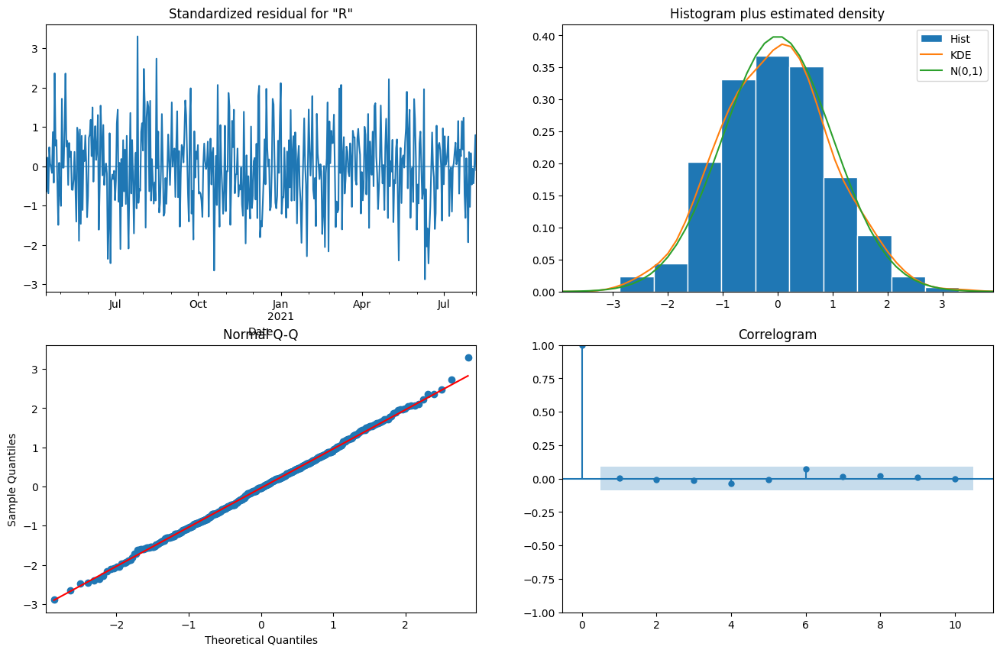

In [46]:
model_0, results_0, df_results_0 = model_creation(X_train, (0, 1, 2), None, (2, 1, 0, 104), False)

                                      SARIMAX Results                                      
Dep. Variable:                             Revenue   No. Observations:                  584
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 32)   Log Likelihood                -418.997
Date:                             Sun, 02 Jun 2024   AIC                            847.994
Time:                                     17:02:11   BIC                            869.553
Sample:                                 01-01-2020   HQIC                           856.418
                                      - 08-06-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4012      0.041      9.750      0.000       0.321       0.482
ma.L2          0.1664      

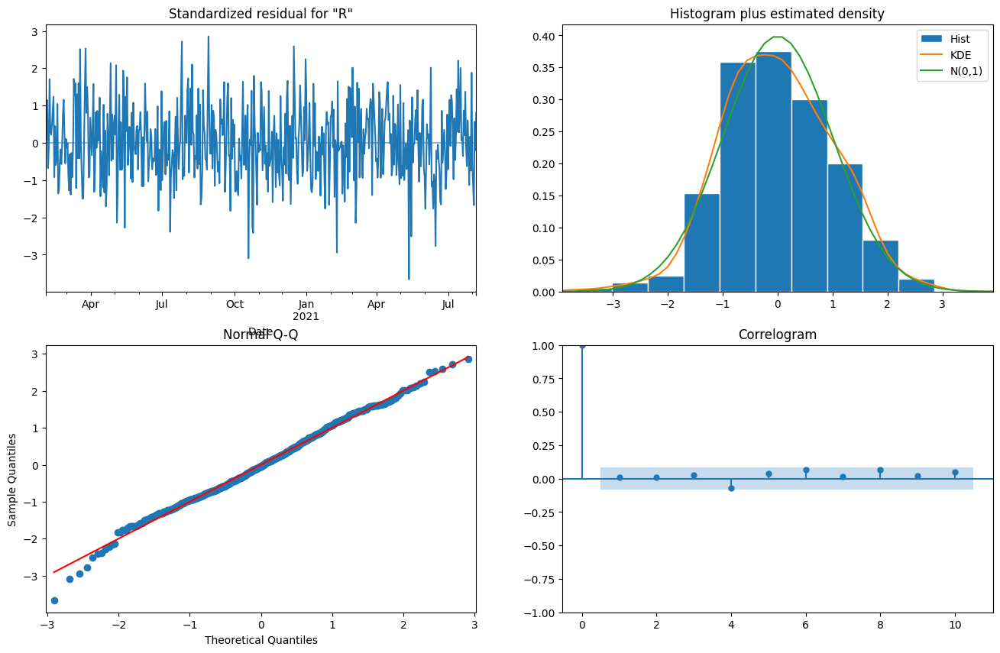

In [45]:
model_32, results_32, df_results_32 = model_creation(X_train, (0, 1, 2), None, (2, 1, 0, 32), False)

                                     SARIMAX Results                                      
Dep. Variable:                            Revenue   No. Observations:                  584
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 8)   Log Likelihood                -418.716
Date:                            Sun, 02 Jun 2024   AIC                            847.432
Time:                                    17:02:12   BIC                            869.203
Sample:                                01-01-2020   HQIC                           855.923
                                     - 08-06-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3805      0.041      9.294      0.000       0.300       0.461
ma.L2          0.2236      0.042   

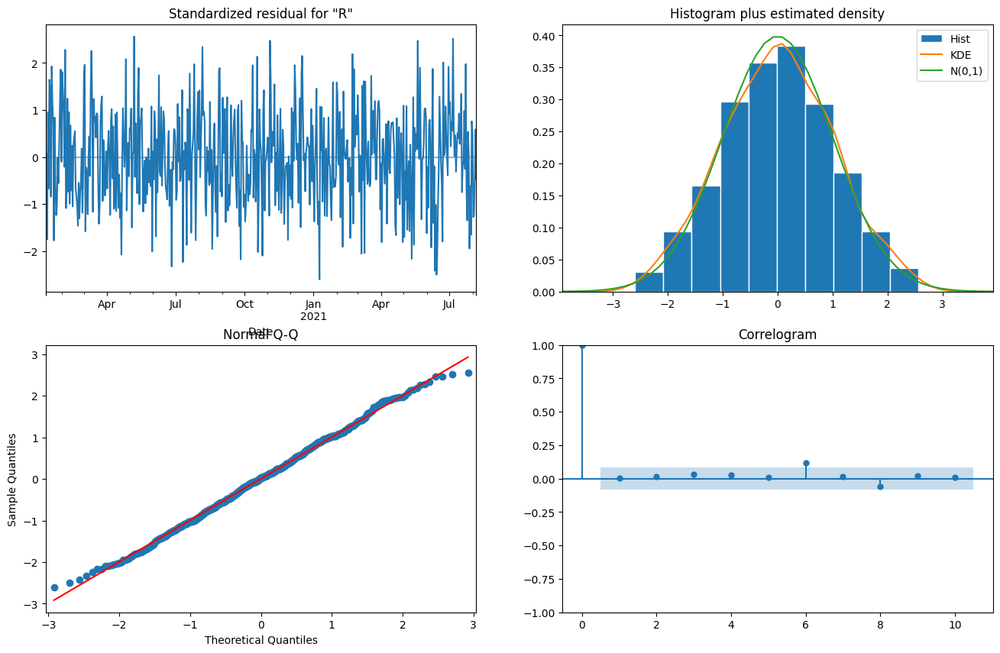

In [46]:
model_8, results_8, df_results_8 = model_creation(X_train, (0, 1, 2), None, (2, 1, 0, 8), False)

In [43]:
# Passes order, trend, and season_order to model_creation using training data from an 80/20 split of df. Calculates
# predictions and forecasts three months beyond the end of the dataset. Produces plots of the model's residuals and
# predictions/forecasts. Then calculates model evaluation statistics and returns it as a dataframe.
def model_predictions(order, trend=None, season_order=None, df=df_med, save=False):
    split = 0.2
    forecast_steps = 237
    fig_dim = (12, 6)
    pred_color = 'r'
    fill_color = 'pink'
    forecast_end = '03-31-2022'

    train_data, test_data = train_test_split(df, test_size=split, shuffle=False)
    model_train, model_results = model_creation(train_data, order, trend, season_order, True)
    train_fitted = model_results.fittedvalues

    predictions = model_results.predict(len(train_data), end=(len(df) - 1))
    prediction = model_results.get_prediction(start=len(train_data), end=(len(df)-1))
    confidence_intervals_pr = prediction.conf_int()
    lower_lims_pr = confidence_intervals_pr.loc[:, 'lower Revenue']
    upper_lims_pr = confidence_intervals_pr.loc[:, 'upper Revenue']
    x_pr = matplotlib.dates.date2num(predictions.index)
    L_pr = np.poly1d(np.polyfit(x_pr, predictions, 1))

    md_forecasting = model_results.forecast(forecast_steps)
    md_forecast = model_results.get_forecast(forecast_steps)
    confidence_intervals_ft = md_forecast.conf_int()
    lower_lims_ft = confidence_intervals_ft.loc[:, 'lower Revenue']
    upper_lims_ft = confidence_intervals_ft.loc[:, 'upper Revenue']
    x_ft = matplotlib.dates.date2num(md_forecasting.index)
    L_ft = np.poly1d(np.polyfit(x_ft, md_forecasting, 1))

    model_updated = model_results.append(test_data)
    updated_forecast = model_updated.forecast(forecast_steps-len(test_data))
    md_forecast_upd = model_updated.get_forecast(forecast_steps-len(test_data))
    confidence_intervals_ft_upd = md_forecast_upd.conf_int()
    lower_lims_ft_upd = confidence_intervals_ft_upd.loc[:, 'lower Revenue']
    upper_lims_ft_upd = confidence_intervals_ft_upd.loc[:, 'upper Revenue']
    x_ft_upd = matplotlib.dates.date2num(updated_forecast.index)
    L_ft_upd = np.poly1d(np.polyfit(x_ft_upd, updated_forecast, 1))

    print(f"Predicted values across test data:\n{predictions}\n")
    print(f"Forecasted values through {forecast_end}:\n{md_forecasting}\n")
    print(f"Forecasted values from 01-01-2022 through {forecast_end} after appending test data (model is still trained on training data):\n{updated_forecast}\n")

    resid_train = model_results.resid
    resid_test = predictions - test_data['Revenue']
    resid_all = pd.concat([train_fitted, predictions]) - df['Revenue']

    fig_rsd = plt.figure(figsize=(24, 12))
    fig_rsd.add_subplot(311)
    plt.plot(resid_train.index, resid_train)
    plt.title('Residuals of training data')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')

    fig_rsd.add_subplot(312)
    plt.plot(resid_test.index, resid_test)
    plt.title('Residuals of test data')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')

    fig_rsd.add_subplot(313)
    plt.plot(resid_all.index, resid_all)
    plt.title('Residuals of all data')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.tight_layout()
    if save:
        plt.savefig(img_dir+f'model_residuals_compilation_{order}_{trend}_{season_order}.png')
    plt.show()

    plt.figure(figsize=fig_dim)
    plt.plot(test_data.index, test_data, label='Observed (test data)')
    plt.plot(predictions.index, predictions, color=pred_color, label='Predicted')
    plt.plot(x_pr, L_pr(x_pr), 'k--', label='Predicted trend')
    plt.fill_between(lower_lims_pr.index, lower_lims_pr, upper_lims_pr, color=fill_color)
    plt.title('Comparing test data with model predictions and shaded confidence intervals')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.legend()
    if save:
        plt.savefig(img_dir+f'model_predictions_{order}_{trend}_{season_order}.png')
    plt.show()

    plt.figure(figsize=fig_dim)
    plt.plot(model_results.fittedvalues, label='Fitted by model', color='orange', linestyle='dashed')
    plt.plot(train_data, label='Training', color='b')
    plt.plot(test_data, label='Test', color='g')
    plt.plot(md_forecasting, label='Forecast', color=pred_color)
    plt.plot(x_ft, L_ft(x_ft), 'k--', label='Forecasted trend')
    plt.fill_between(lower_lims_ft.index, lower_lims_ft, upper_lims_ft, color=fill_color)
    plt.title('Revenue with forecasted projections for 2022 Q1 and shaded confidence intervals')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.legend()
    if save:
        plt.savefig(img_dir+f'model_forecast_confint_{order}_{trend}_{season_order}.png')
    plt.show()

    plt.figure(figsize=fig_dim)
    plt.plot(model_results.fittedvalues, label='Fitted by model', color='orange', linestyle='dashed')
    plt.plot(train_data, label='Training', color='b')
    plt.plot(test_data, label='Test', color='g')
    plt.plot(md_forecasting, label='Forecast', color=pred_color)
    plt.plot(x_ft, L_ft(x_ft), 'k--', label='Forecasted trend')
    plt.title('Revenue with forecasted projections for 2022 Q1')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.legend()
    if save:
        plt.savefig(img_dir+f'model_forecast_plain_{order}_{trend}_{season_order}.png')
    plt.show()

    plt.figure(figsize=fig_dim)
    plt.plot(model_results.fittedvalues, label='Fitted by model', color='orange', linestyle='dashed')
    plt.plot(train_data, label='Training', color='b')
    plt.plot(test_data, label='Test', color='g')
    plt.plot(updated_forecast, label='Forecast from last data point', color=pred_color)
    plt.plot(x_ft_upd, L_ft_upd(x_ft_upd), 'k--', label='Forecasted trend from last data point')
    plt.fill_between(lower_lims_ft_upd.index, lower_lims_ft_upd, upper_lims_ft_upd, color=fill_color)
    plt.title('Revenue with forecasted projections for 2022 Q1 (accounting for test data) and shaded confidence intervals')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.legend()
    if save:
        plt.savefig(img_dir+f'model_forecast_updated_confint_{order}_{trend}_{season_order}.png')
    plt.show()

    model_results.plot_diagnostics(figsize=(16, 10))
    if save:
        plt.savefig(img_dir+f'model_diagnostics_{order}_{trend}_{season_order}.png')
    plt.show()

    fig_tr = plt.figure(figsize=fig_dim)
    ax_tr = fig_tr.add_subplot(111)
    fig_tr = plot_acf(resid_train, lags=(len(train_data) - 2), ax=ax_tr)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation of residuals (training)')
    if save:
        plt.savefig(img_dir+f'model_acf_resid_train_{order}_{trend}_{season_order}.png')
    plt.show()

    fig_te = plt.figure(figsize=fig_dim)
    ax_te = fig_te.add_subplot(111)
    fig_te = plot_acf(resid_test, lags=(len(test_data) - 2), ax=ax_te)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation of residuals (test)')
    if save:
        plt.savefig(img_dir+f'model_acf_resid_test_{order}_{trend}_{season_order}.png')
    plt.show()

    fig_a = plt.figure(figsize=fig_dim)
    ax_a = fig_a.add_subplot(111)
    fig_a = plot_acf(resid_all, lags=(len(df) - 2), ax=ax_a)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation of residuals (all)')
    if save:
        plt.savefig(img_dir+f'model_acf_resid_all_{order}_{trend}_{season_order}.png')
    plt.show()

    total_predictions = pd.concat([model_results.fittedvalues, predictions])
    rss_train = sum(resid_train ** 2)
    rss_test = sum(resid_test ** 2)
    rss_all = rss_train + rss_test
    rss_statn = sum((total_predictions.diff().dropna() - df['Revenue'].diff().dropna()) ** 2)

    mae_train = np.mean(np.abs(resid_train))
    mae_test = np.mean(np.abs(resid_test))
    mae_all = mae_train + mae_test

    rmse_train = np.sqrt(mean_squared_error(model_results.fittedvalues, train_data['Revenue']))
    rmse_test = np.sqrt(mean_squared_error(predictions, test_data['Revenue']))
    rmse_all = rmse_train + rmse_test

    rsq_train = r2_score(train_data, train_fitted)
    rsq_test = r2_score(test_data, predictions)
    rsq_all = r2_score(df, total_predictions)

    df_results = pd.DataFrame([rmse_train, rmse_test, rmse_all,
                                    mae_train, mae_test, mae_all,
                                    rsq_train, rsq_test, rsq_all,
                                    rss_train, rss_test, rss_all, rss_statn],
                              columns=['Value'],
                              index=[['RMSE', 'RMSE', 'RMSE', 'MAE', 'MAE', 'MAE',
                                      'R^2', 'R^2', 'R^2', 'RSS', 'RSS', 'RSS', 'RSS'],
                                     ['train', 'test', 'all', 'train', 'test', 'all',
                                      'train', 'test', 'all', 'train', 'test', 'all', 'stationary']])
    print(model_results.summary())
    print(df_results)
    return df_results

Predicted values across test data:
2021-08-07    19.483198
2021-08-08    19.425940
2021-08-09    19.292369
2021-08-10    19.217616
2021-08-11    19.148979
                ...    
2021-12-27    13.392394
2021-12-28    12.754435
2021-12-29    12.687977
2021-12-30    12.507961
2021-12-31    13.014433
Freq: D, Name: predicted_mean, Length: 147, dtype: float64

Forecasted values through 03-31-2022:
2021-08-07    19.483198
2021-08-08    19.425940
2021-08-09    19.292369
2021-08-10    19.217616
2021-08-11    19.148979
                ...    
2022-03-27    12.562906
2022-03-28    12.913128
2022-03-29    12.925241
2022-03-30    13.033408
2022-03-31    13.410459
Freq: D, Name: predicted_mean, Length: 237, dtype: float64

Forecasted values from 01-01-2022 through 03-31-2022 after appending test data (model is still trained on training data):
2022-01-01    15.763684
2022-01-02    16.084506
2022-01-03    16.700458
2022-01-04    16.910520
2022-01-05    16.784183
                ...    
2022-03-27   

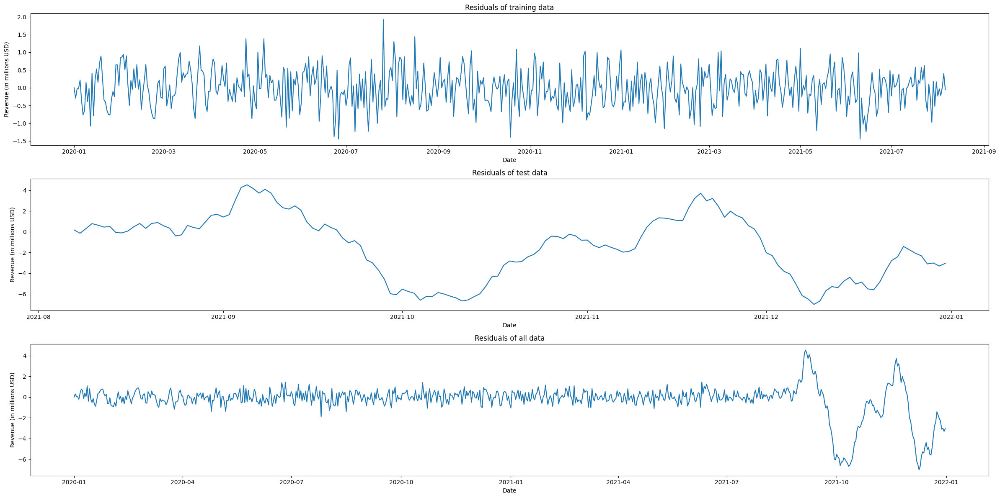

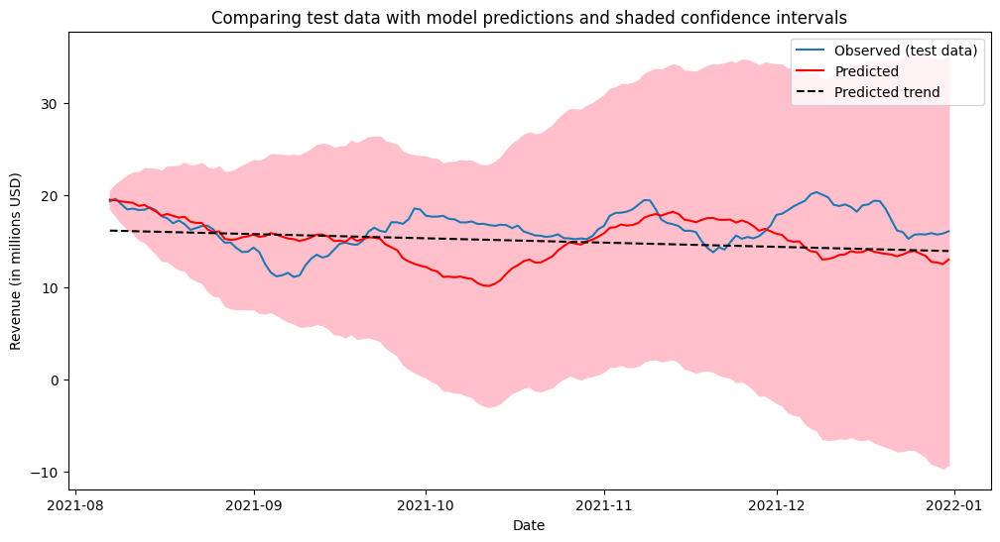

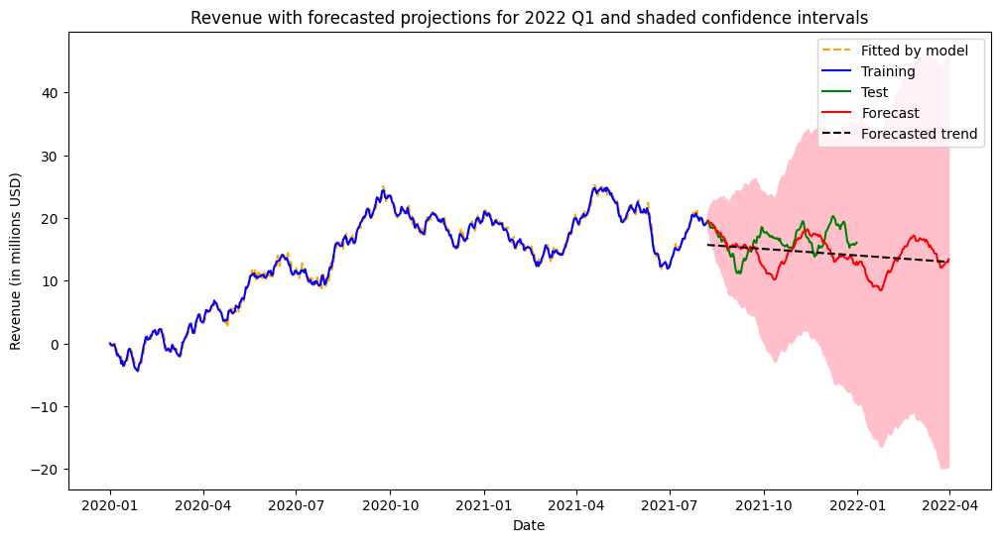

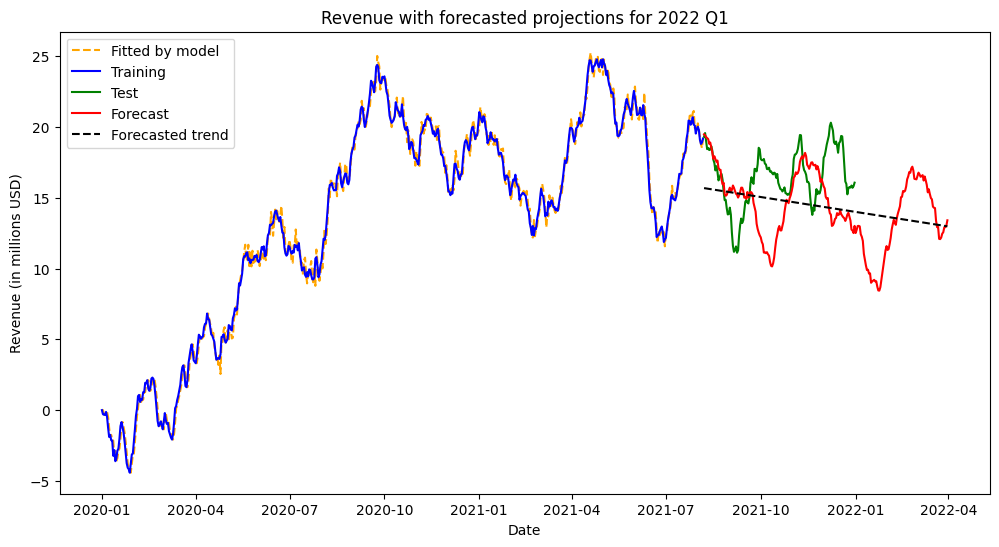

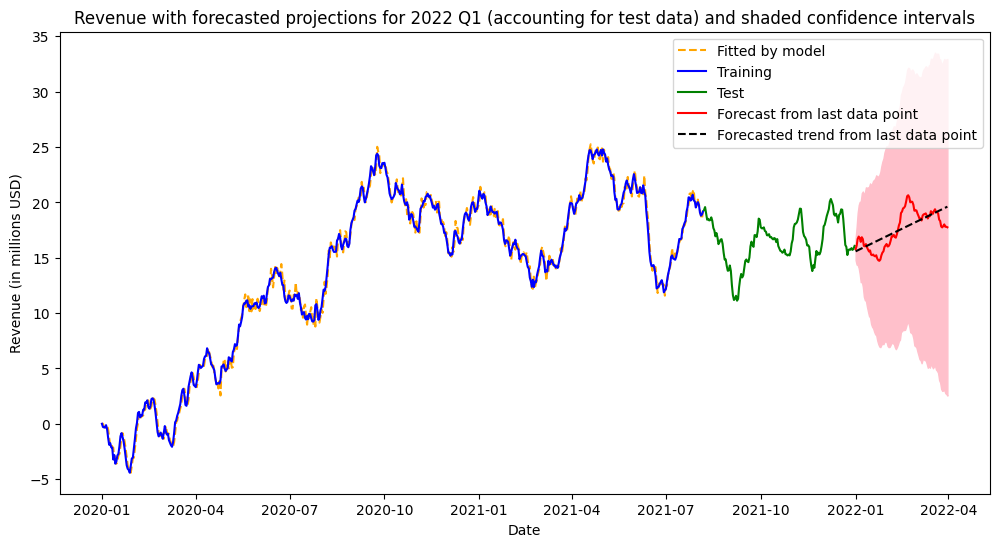

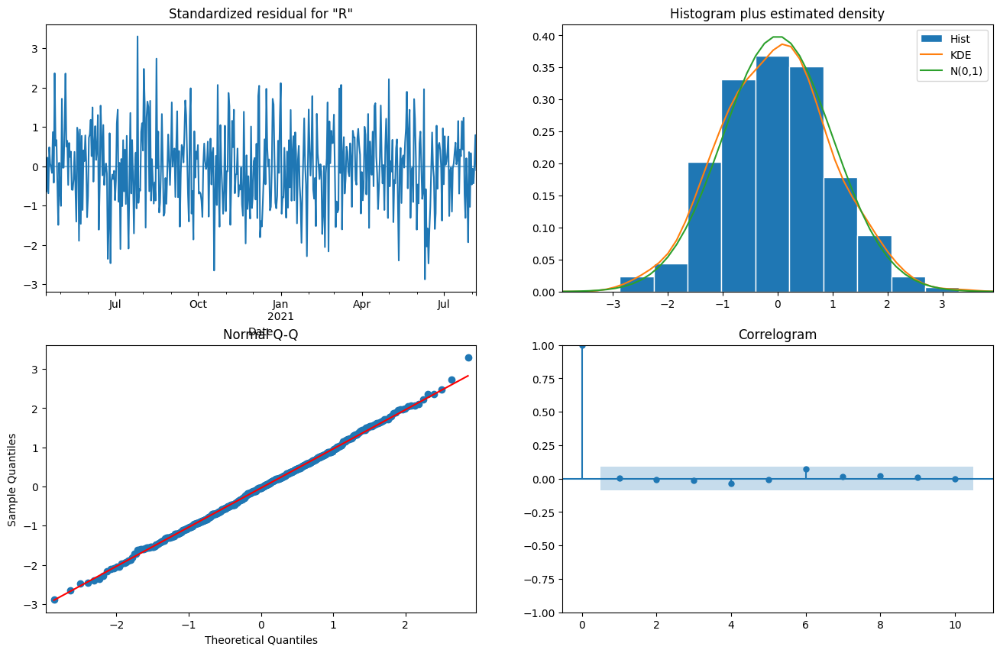

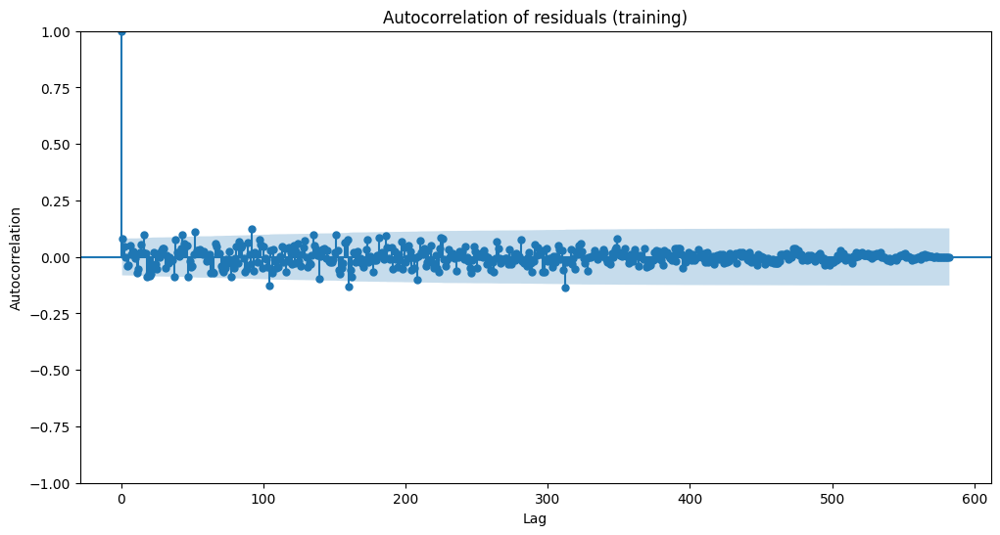

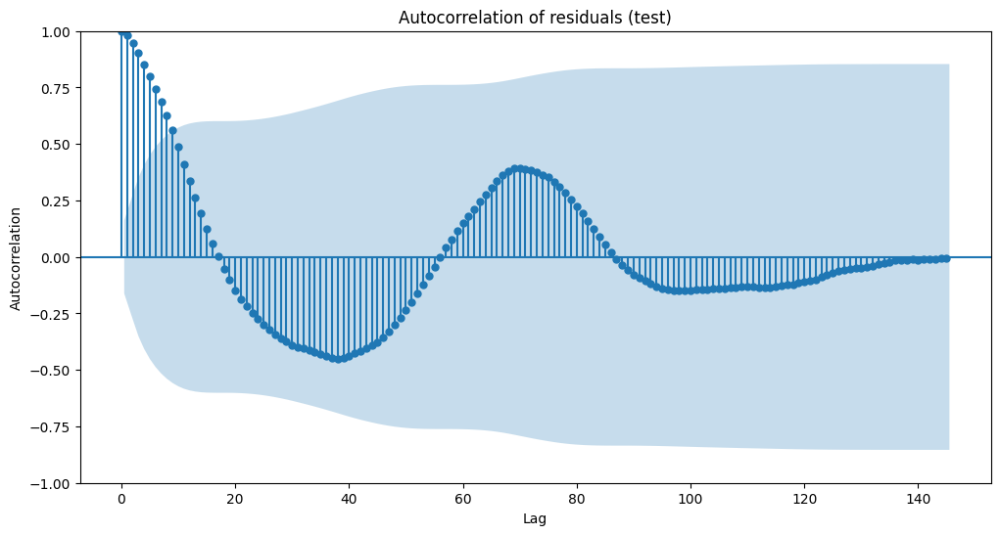

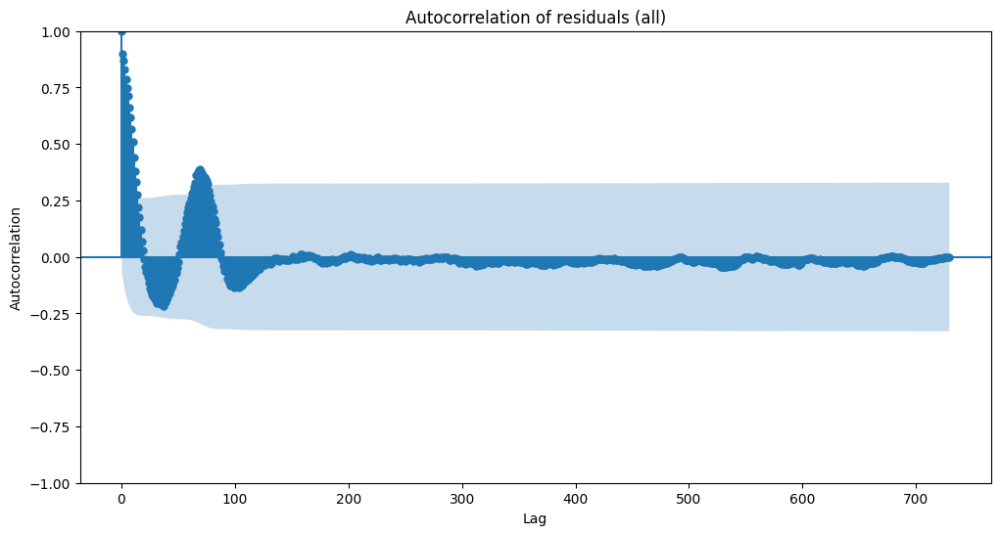

                                      SARIMAX Results                                       
Dep. Variable:                              Revenue   No. Observations:                  584
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 104)   Log Likelihood                -370.715
Date:                              Sun, 02 Jun 2024   AIC                            751.431
Time:                                      18:19:27   BIC                            772.289
Sample:                                  01-01-2020   HQIC                           759.631
                                       - 08-06-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4150      0.043      9.590      0.000       0.330       0.500
ma.L2          0.21

In [50]:
df_model_results = model_predictions((0, 1, 2), None, (2, 1, 0, 104), df_med, False)

<br>

Ultimately, the best model found was created with `SARIMAX(X_train, order=(0, 1, 2), seasonal_order=(2, 1, 0, 104), trend=None, freq='D')`.

<br>
<div style="font-size:18px; font-weight:bold;">
D.3. Forecasting using ARIMA model
</div>
<br>

The function `model_predictions` was used in the previous section to review the strength of a model when extended to the test data. Recreating that here, the final model selected was `SARIMAX(X_train, order=(0, 1, 2), seasonal_order=(2, 1, 0, 104), trend=None, freq='D')`, with the following forecast output:

Predicted values across test data:
2021-08-07    19.483198
2021-08-08    19.425940
2021-08-09    19.292369
2021-08-10    19.217616
2021-08-11    19.148979
                ...    
2021-12-27    13.392394
2021-12-28    12.754435
2021-12-29    12.687977
2021-12-30    12.507961
2021-12-31    13.014433
Freq: D, Name: predicted_mean, Length: 147, dtype: float64

Forecasted values through 03-31-2022:
2021-08-07    19.483198
2021-08-08    19.425940
2021-08-09    19.292369
2021-08-10    19.217616
2021-08-11    19.148979
                ...    
2022-03-27    12.562906
2022-03-28    12.913128
2022-03-29    12.925241
2022-03-30    13.033408
2022-03-31    13.410459
Freq: D, Name: predicted_mean, Length: 237, dtype: float64

Forecasted values from 01-01-2022 through 03-31-2022 after appending test data (model is still trained on training data):
2022-01-01    15.763684
2022-01-02    16.084506
2022-01-03    16.700458
2022-01-04    16.910520
2022-01-05    16.784183
                ...    
2022-03-27   

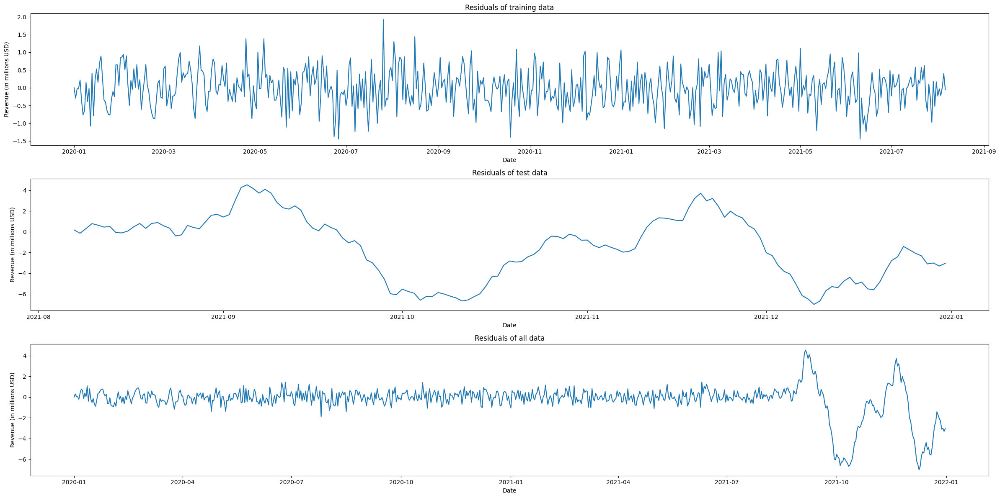

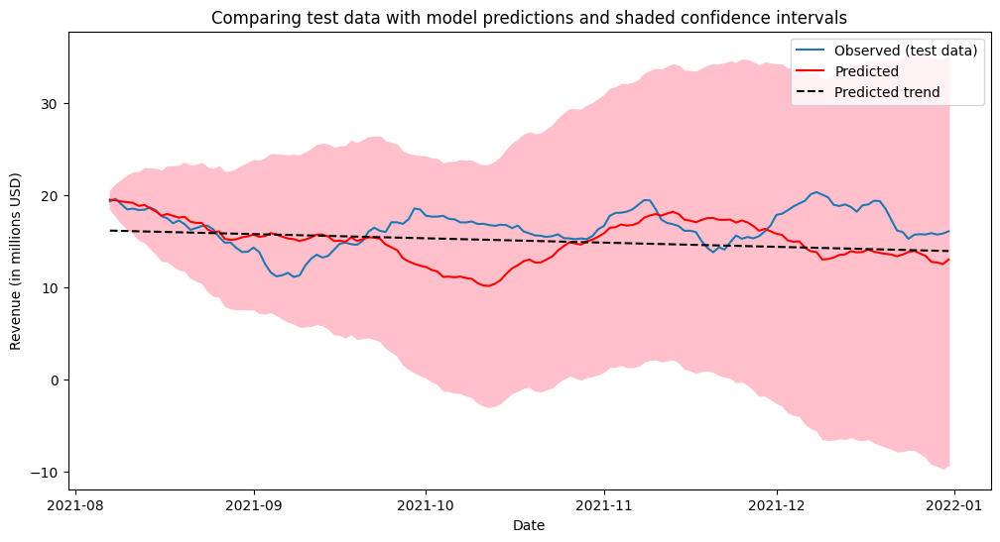

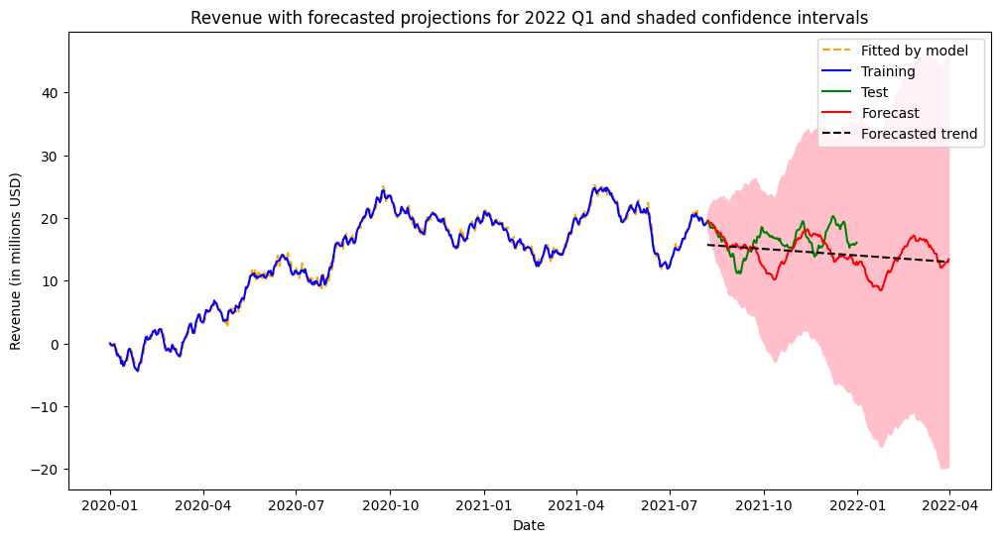

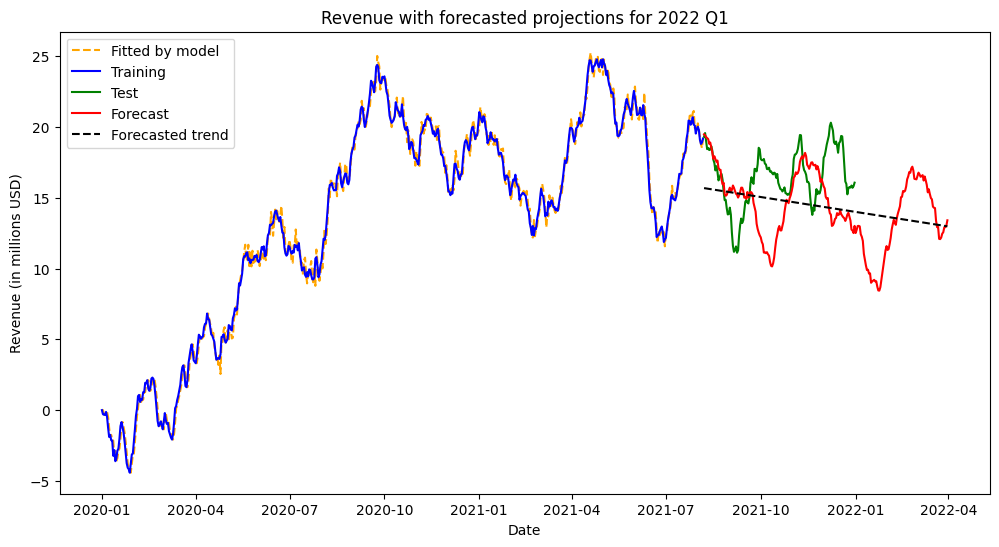

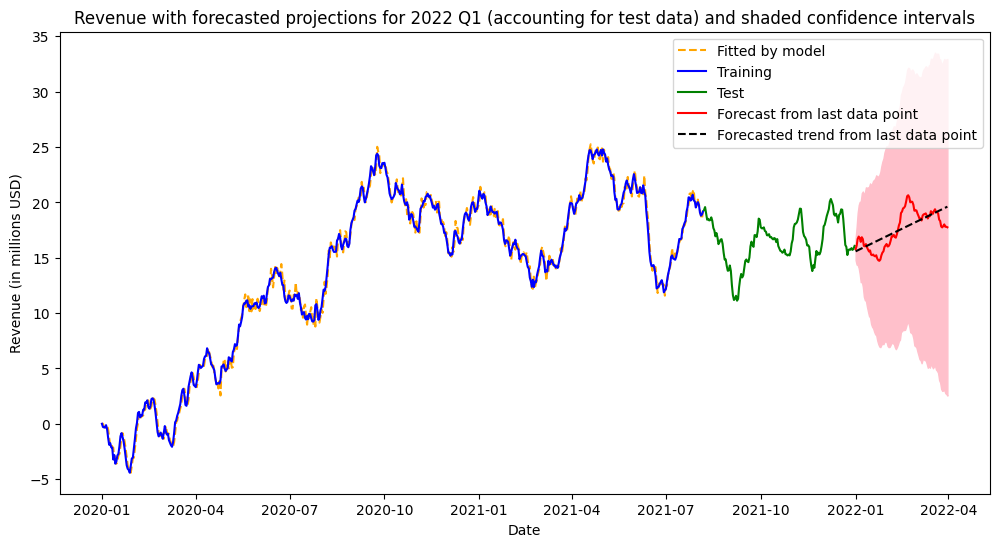

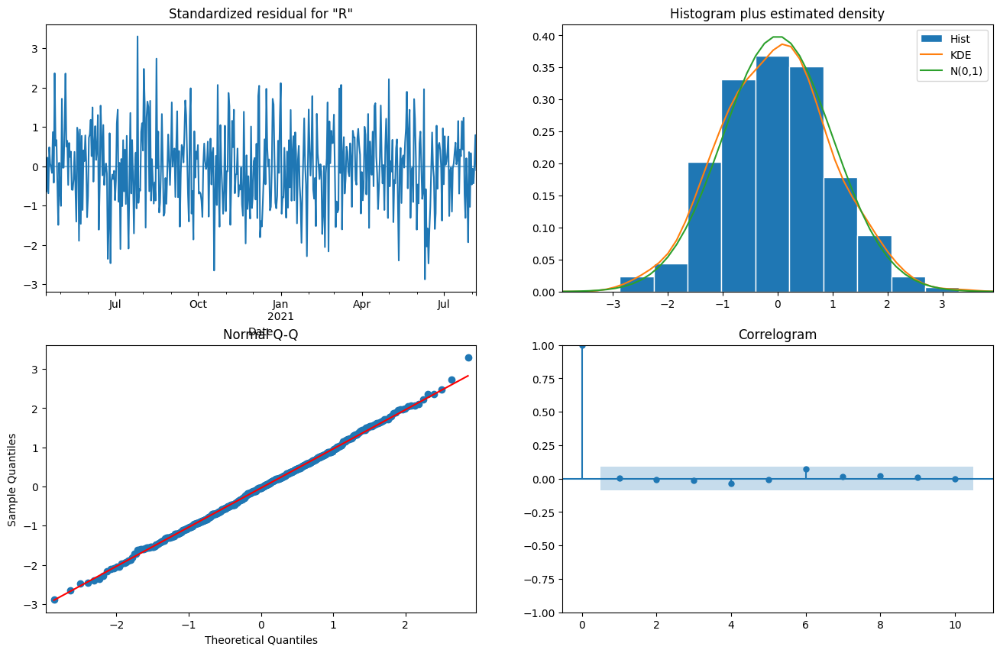

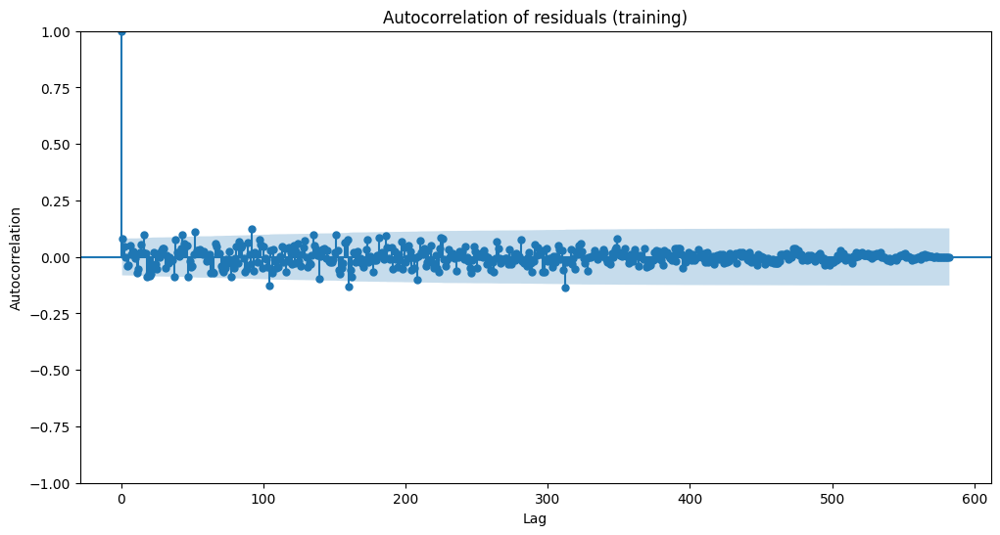

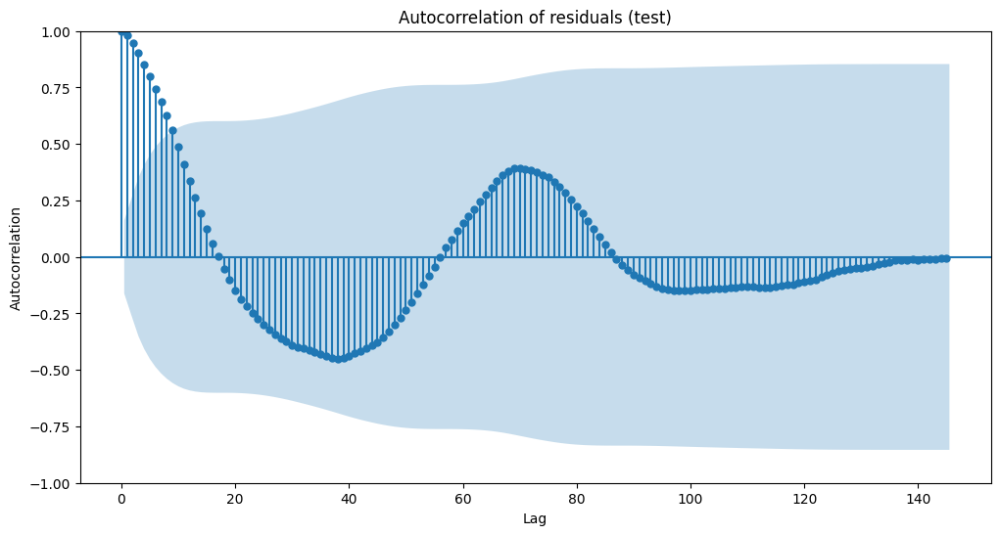

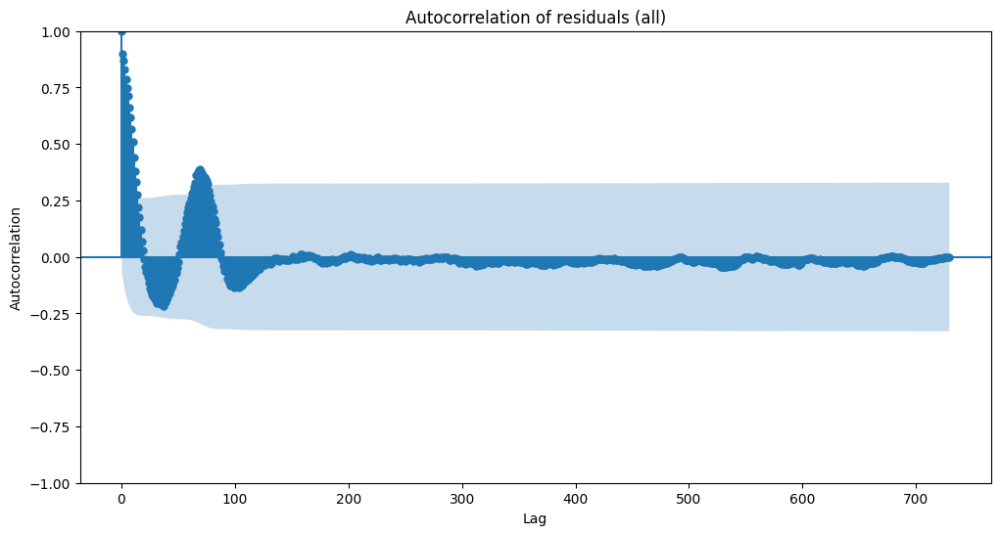

                                      SARIMAX Results                                       
Dep. Variable:                              Revenue   No. Observations:                  584
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 104)   Log Likelihood                -370.715
Date:                              Sun, 02 Jun 2024   AIC                            751.431
Time:                                      18:19:27   BIC                            772.289
Sample:                                  01-01-2020   HQIC                           759.631
                                       - 08-06-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4150      0.043      9.590      0.000       0.330       0.500
ma.L2          0.21

In [50]:
df_model_results = model_predictions((0, 1, 2), None, (2, 1, 0, 104), df_med, False)

<br>
<div style="font-size:18px; font-weight:bold;">
D.4. Output and calculations
</div>
<br>

For chronological consistency, all of the output and calculations in creating and evaluating the models are contained in sections D.1. through D.3. The supplementary section "Code with all output" displays all relevant plots, statistics, output, and more.
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
D.5. Code
</div>
<br>

All of the code is displayed above and can also be found in the attached file "arima.py". For convenience, it's also displayed below section H. under the heading "Code with all output".
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
E.1. Results
</div>
<br>

From section D.2., it was determined the best possible model on the training data that also behaved reasonably with the test data was
<br>
`SARIMAX(X_train, order=(0, 1, 2), seasonal_order=(2, 1, 0, 104), trend=None, freq='D')`.

                                      SARIMAX Results                                       
Dep. Variable:                              Revenue   No. Observations:                  584
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 104)   Log Likelihood                -370.715
Date:                              Sun, 02 Jun 2024   AIC                            751.431
Time:                                      18:46:03   BIC                            772.289
Sample:                                  01-01-2020   HQIC                           759.631
                                       - 08-06-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4150      0.043      9.590      0.000       0.330       0.500
ma.L2          0.21

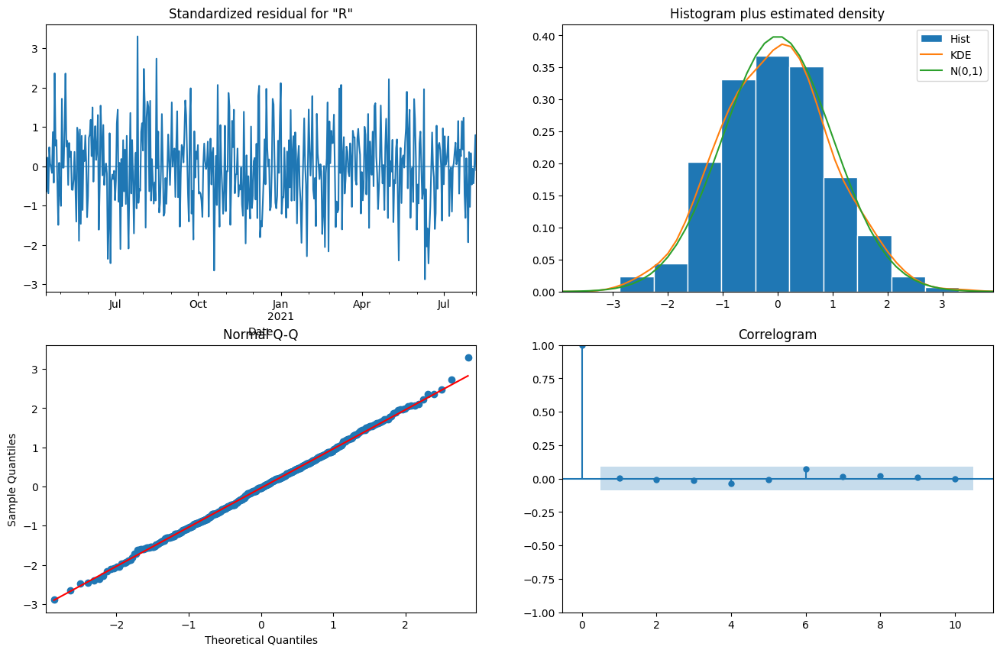

In [52]:
model_0, results_0, df_results_0 = model_creation(X_train, (0, 1, 2), None, (2, 1, 0, 104), False)

<br>

This was determined through extensive testing with the function `aic_arima_search`, taking into account the work done in section D.1. determining a preferred seasonal period of $D = 1$ and potential values of $p = 1$ and $q = 2$. Ultimately, the model was best served with $q = 2$ and $p = 0$.

The final model's AIC is 751.431, one of the lowest among all candidates tested that had acceptable p-values on Ljung-Box statistics and coefficients. The coefficients all have 0.000 p-values with standard errors of a reasonable magnitude compared to the coefficients themselves. The variance in the residuals is 0.2528, the Ljung-Box p-values are all very high (i.e. the model is a good fit), the RMSE on the training data is 0.524, the MAE is 0.420, and the RSS is 160.5. The diagnostic plots above all confirm the model's quality.

Further assessment comes from comparing to the test data, displayed in sections D.3. and E.2. Although the residuals on the test data are relatively high due to mistimed peaks, as mentioned in that section the general trend line (linear fit) is a reliable estimate for the test data. That is, day-to-day estimates are noisy and unreliable, but trends over longer time periods such as weeks prove to be trustworthy. As a result, the model's evaluation metrics of RMSE, MAE, and RSS all climb substantially between the train and test sets, but overall are acceptable when the limitations of the model are kept in mind. Specifically, the model's RMSE was 3.33, MAE was 2.63, and RSS was 1634.0 on the test data. Compared to other possible SARIMA models, these were some of the best performing values (on the test data).

As the revenue is reported daily for two years, the model is capable of predicting values at the same daily frequency. The data was split 80%/20% in training and test data (on 731 days), so predicting across the final 147 days won't necessarily be the most accurate, but is necessary to assess model performance. As the residuals demonstrate, the predicted values have an "out of phase" pattern with the test data that makes day-to-day predictions unreliable, but the trend line matches quite closely to the observed test data.

For the forecasting, businesses frequently handle financials in 90 day quarters, so a 90 day prediction would align with likely expectations of involved parties. Given the reliability of the trend line across the 147 days of the test data, a 90 day forecast should be achievable. That said, business shocks and outside influences can render a model's predictions useless, potentially requiring the model to be recalculated entirely. Although forecasts could be done outside of 90 days, given the extensive magnification of confidence intervals at those ranges, it's preferable to use a modest forecast length.
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
E.2. Annotated visualization
</div>
<br>

The final model's predictions from 08-07-2021 through 12-31-2021, forecast from 08-07-2021 through 03-31-2022, and a forecast that incorporates the test data (i.e. done through `SARIMAX().append()` while maintaining the coefficients found from the model on the training data) from 01-01-2022 through 03-31-2022, can all be found in the plots below.

Predicted values across test data:
2021-08-07    19.483198
2021-08-08    19.425940
2021-08-09    19.292369
2021-08-10    19.217616
2021-08-11    19.148979
                ...    
2021-12-27    13.392394
2021-12-28    12.754435
2021-12-29    12.687977
2021-12-30    12.507961
2021-12-31    13.014433
Freq: D, Name: predicted_mean, Length: 147, dtype: float64

Forecasted values through 03-31-2022:
2021-08-07    19.483198
2021-08-08    19.425940
2021-08-09    19.292369
2021-08-10    19.217616
2021-08-11    19.148979
                ...    
2022-03-27    12.562906
2022-03-28    12.913128
2022-03-29    12.925241
2022-03-30    13.033408
2022-03-31    13.410459
Freq: D, Name: predicted_mean, Length: 237, dtype: float64

Forecasted values from 01-01-2022 through 03-31-2022 after appending test data (model is still trained on training data):
2022-01-01    15.763684
2022-01-02    16.084506
2022-01-03    16.700458
2022-01-04    16.910520
2022-01-05    16.784183
                ...    
2022-03-27   

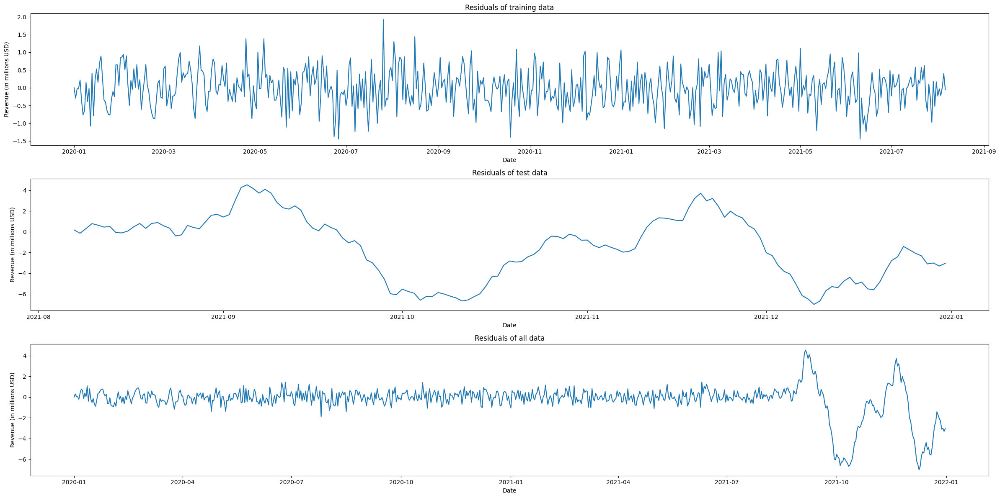

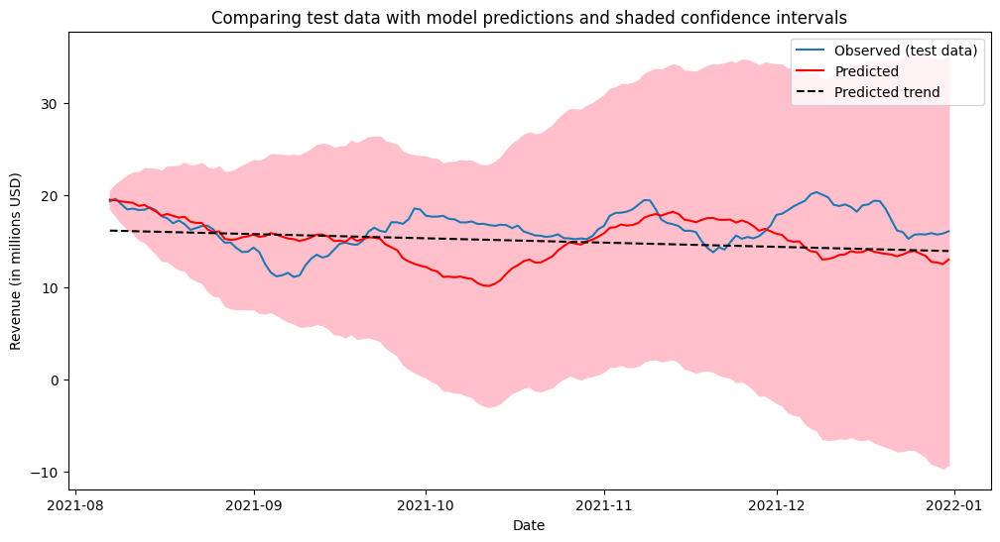

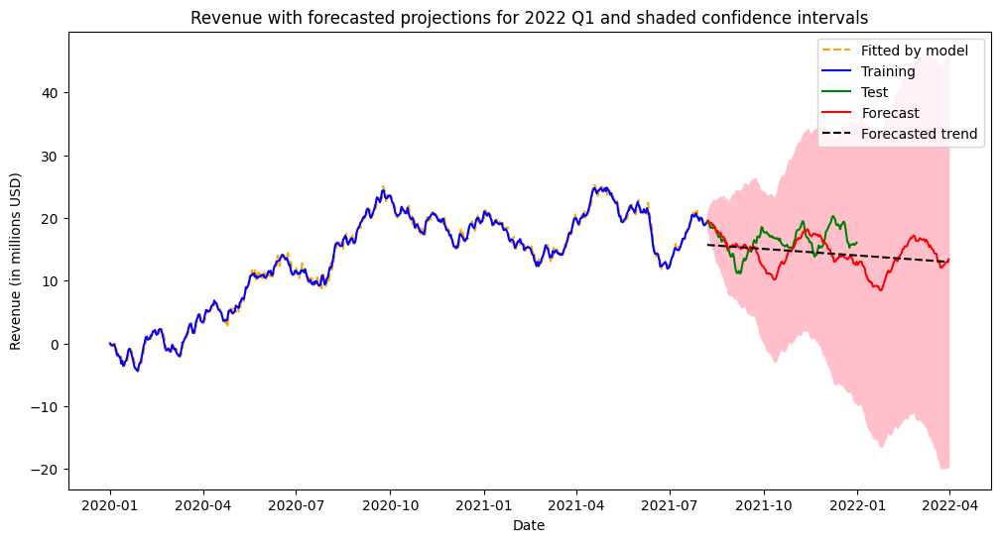

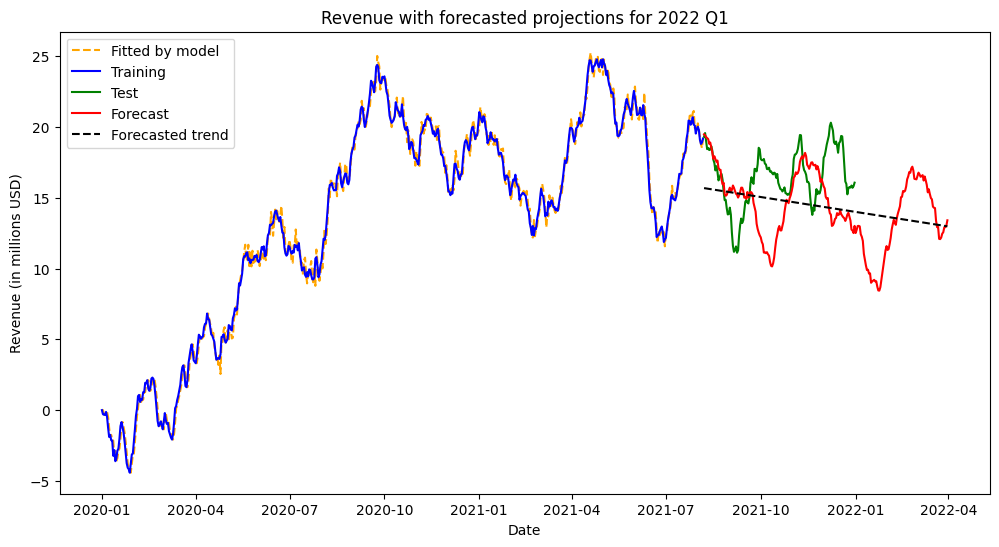

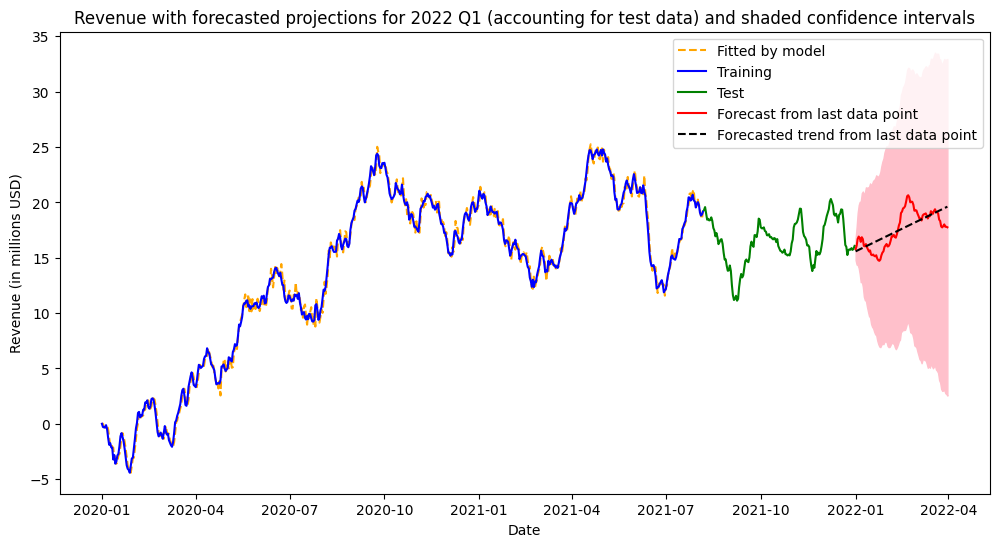

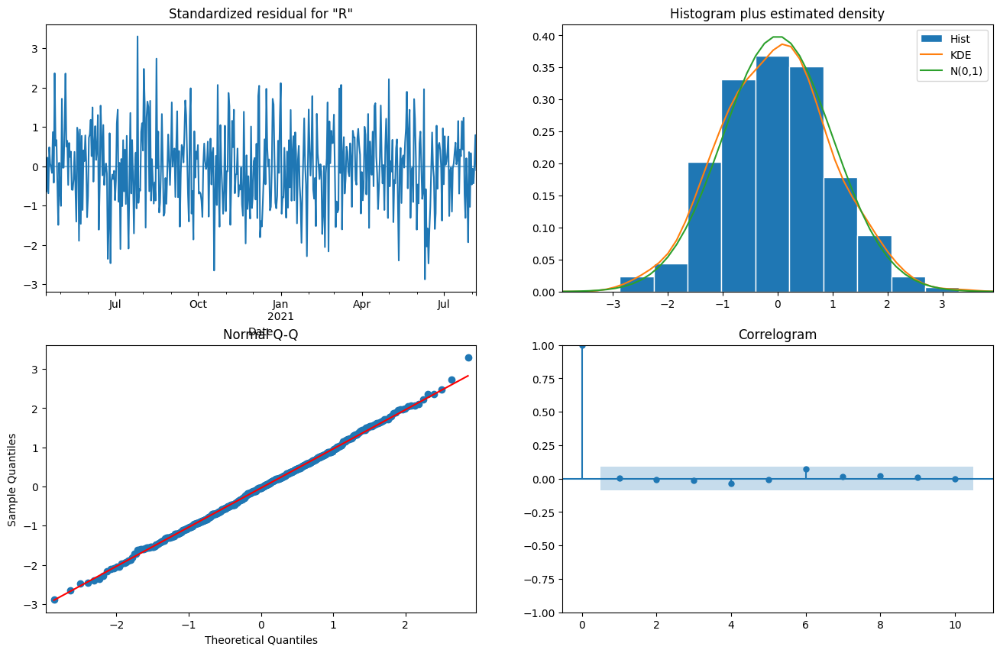

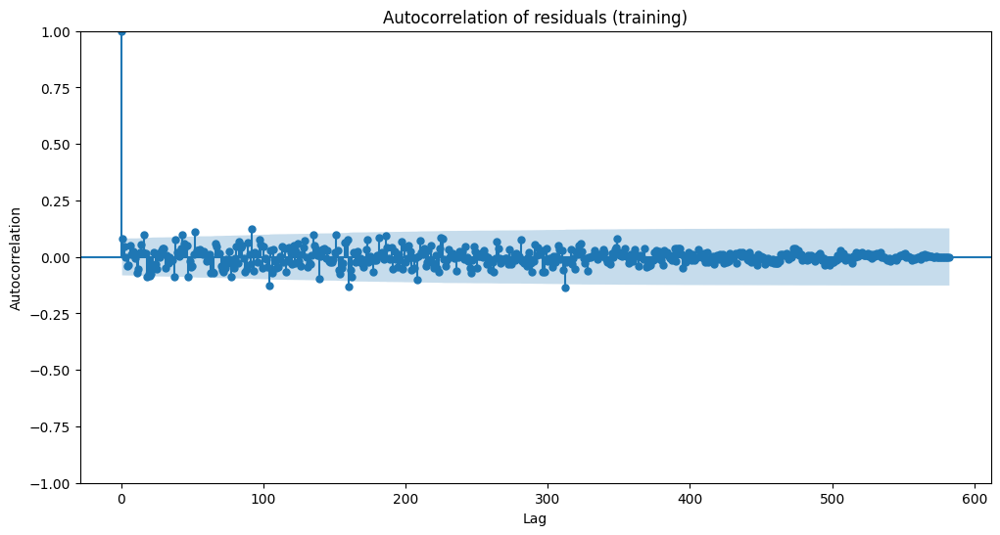

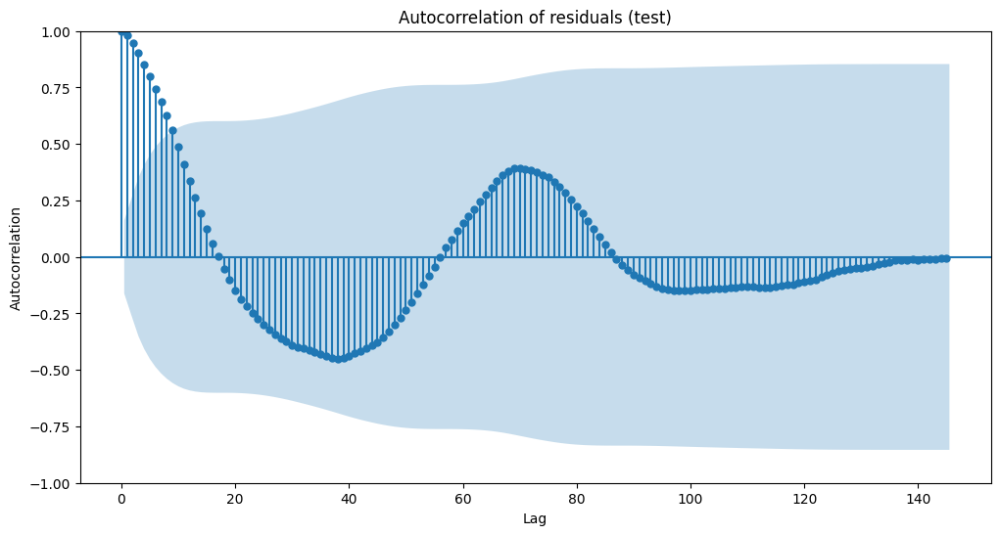

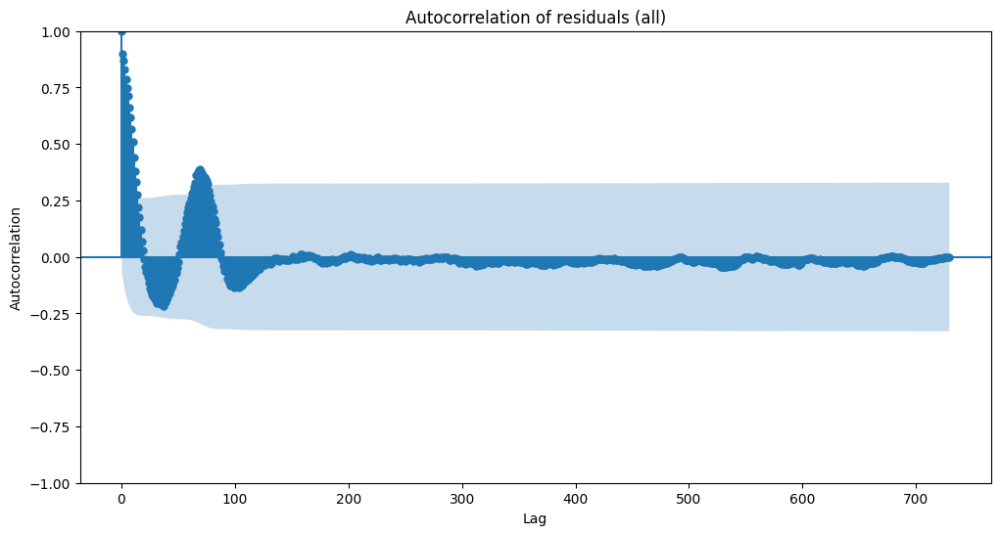

                                      SARIMAX Results                                       
Dep. Variable:                              Revenue   No. Observations:                  584
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 104)   Log Likelihood                -370.715
Date:                              Sun, 02 Jun 2024   AIC                            751.431
Time:                                      18:19:27   BIC                            772.289
Sample:                                  01-01-2020   HQIC                           759.631
                                       - 08-06-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4150      0.043      9.590      0.000       0.330       0.500
ma.L2          0.21

In [50]:
df_model_results = model_predictions((0, 1, 2), None, (2, 1, 0, 104), df_med, False)

<br>

The model's residuals on the test data range from approximately 4 to -6, which is significant when the overall revenue values ranged primarily from 0 to 20 across the two year timespan. However, when looking at the predicted values compared with the test data, the prediction appears to have incorrectly timed certain peaks. Its linear trend line is a much more reliable predictor compared with the test data. The day-to-day predictions aren't generally reliable, but the long term trend shows it's quite accurate.

The 237 day forecast shows confidence intervals that quickly balloon from -50 to 20, well outside reasonable expectations of the hospital's expected revenue given relative stability from October 2020 through December 2021. Clearly, the forecast can't predict that far ahead. When forecasting from January 1 2022 through March 31 2022 the confidence intervals shrink to 3 and 34, which is improved but still shows the limits of forecasting durations.

Comparing the forecasting starting on August 7 2021 with January 1 2022 shows the sensitivity to previous data and the point at which the forecasting begins. Starting on August 7 2021, it trends down from 19.48 to 13.41 on March 31 2022, being at ~12-13 on December 31 2021 (below the observed test data). When it starts on January 1 2022 after having the test data appended, it trends up from 15.76 to 17.75.

The forecasting ability of this model is limited in part because there's only two years' worth of data, with a primarily linear phase for the first ten months before stabilizing for the other fourteen. A more complex treatment, potentially with models created for different phases, could produce better estimates, but is beyond the scope of this project. Nonetheless, if the model's forecasting is taken as a general trend over the span of weeks rather than days, it scan be a reliable tool for hospital staff involved in financial, accounting, and executive roles.
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
E.3. Recommendation
</div>
<br>

As discussed above, hospital administrators and executives may benefit from using this model for short term forecasting (no more than 90 days), keeping in mind the day-to-day predictions may be off significantly, while the general trend line (linear fit) has proven to be reliable on the test data. That said, all sorts of business factors and influences can create changes in revenue or expenses that depart significantly from predictions, potentially requiring the model to be reevaluated entirely, such as the closure of a significant part of the hospital system. The predictive strength is limited yet worth using as a tool when expectations don't assume day-to-day accuracy.

Moreover, it would be beneficial to improve the model by considering additional data (going back further if possible) with more detail. The data seems to have different regimes that would benefit from different models, notably the approximately linear increase for the first ten months. A more complex model might be more appropriate to handle the multiple seasonal frequencies observed in the Fourier transform. Further insight would be gained by understanding underlying financials such as hospitals opening or closing, large swings in revenue or expenses at certain times of the year, and so forth.
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
F. Reporting
</div>
<br>

See the Jupyter notebook "arima.ipynb" and "D213 Task 1 Time Series Modeling.html" files.
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
G. Sources for third-party code
</div>
<br>

<b>1.</b> WGU. 2024. D213 Advanced Data Analytics “Data Files and Associated Dictionary Files”. Medical Data and Dictionary Files. Retrieved June 2, 2024, from https://access.wgu.edu/ASP3/aap/content/f9ck5mr9dk4fcd054klw.html.
<br>
<b>2.</b> Elleh, Festus. 2024. WGU D213 “D213 Webinar Task 1 Data Preprocessing Python”. Retrieved June 2, 2024, from https://wgu.hosted.panopto.com/Panopto/Pages/Viewer.aspx?id=8d32afc8-d66f-42d5-9117-b100016cf9ac.
<br>
<b>3.</b> Elleh, Festus. 2024. WGU D213 “Task 1 Building Arima Model in Python video”. Retrieved June 2, 2024, from https://wgu.hosted.panopto.com/Panopto/Pages/Viewer.aspx?id=1aaf2389-6483-4000-b498-b14f00441d57.
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
H. Sources
</div>
<br>

<b>1.</b> Feldman. Unknown. From AR to SARIMAX: Mathematical Definitions of Time Series Models. Retrieved June 2, 2024, from https://phosgene89.github.io/sarima.html.
<b>2.</b> Elleh, Festus. 2024. WGU “D213 Task 1 Cohort Webinar PPT”. Retrieved June 2, 2024 from https://westerngovernorsuniversity.sharepoint.com/:p:/r/sites/DataScienceTeam/_layouts/15/Doc.aspx?sourcedoc=%7BDC38E039-2BB1-4EBE-B156-F79C16334FC6%7D&file=D213%20Task%201%20Cohort%20Webinar%20PPT.pptx.
<br>
<br>
<br>

<div style="font-size:18px; font-weight:bold;">
Code with all output
</div>

In [37]:
print(f"\nChecking for columns with null values: {list(df_med.columns[df_med.isna().sum() > 0])}\n")
print(f"Number of duplicated values in column 'Day': {df_med.duplicated(subset='Day').sum()}\n")
print(f"Verifying 'Day' column is sequential from 1 to 731 with no gaps:\n{df_med.Day.describe()}\n")
print(f"Differences between rows are all 1.0:\n{df_med['Day'].diff().dropna().describe()}\n")


Checking for columns with null values: []

Number of duplicated values in column 'Day': 0

Verifying 'Day' column is sequential from 1 to 731 with no gaps:
count    731.000000
mean     366.000000
std      211.165812
min        1.000000
25%      183.500000
50%      366.000000
75%      548.500000
max      731.000000
Name: Day, dtype: float64

Differences between rows are all 1.0:
count    730.0
mean       1.0
std        0.0
min        1.0
25%        1.0
50%        1.0
75%        1.0
max        1.0
Name: Day, dtype: float64



In [38]:
# Adapted from Dr. Festus Elleh's “D213 Webinar Task 1 Data Preprocessing Python” lecture video, accessed 2024.
# https://wgu.hosted.panopto.com/Panopto/Pages/Viewer.aspx?id=8d32afc8-d66f-42d5-9117-b100016cf9ac

# Converts numbered day_coln to datetimes starting at January 1 of start_year.
def day_to_datetime(start_year=2020, day_coln='Day', df=df_med):
    start_month = 1
    start_day = 1
    df['Date'] = pd.date_range(start=datetime(start_year, start_month, start_day), periods=df.shape[0], freq='24h')
    df.set_index('Date', inplace=True)
    df = df.asfreq('D')
    df = df.drop(columns=[day_coln])
    return df


# Prints results of augmented Dickey-Fuller test. Null hypothesis H_0 is the data is non-stationary.
# It's rejected (i.e. the data is stationary) for p-values below alpha = 0.05.
def aug_dfuller_testing(data):
    results_adful = adfuller(data)
    print(f"\nTest statistic: {results_adful[0]}\n")
    print(f"p-value: {results_adful[1]}\n")
    print(f"Number of lags used: {results_adful[2]}\n")
    print(f"Number of observations: {results_adful[3]}\n")
    print(f"Critical values: {results_adful[4]}\n")
    return results_adful

In [39]:
# Adjusting dataframe from integer numbered days to dates starting at January 1, 2020 through December 31, 2021.
df_med = day_to_datetime(2020, 'Day', df_med)
df_stationary = df_med.diff().dropna()
print(df_med)
print(df_stationary)

              Revenue
Date                 
2020-01-01   0.000000
2020-01-02  -0.292356
2020-01-03  -0.327772
2020-01-04  -0.339987
2020-01-05  -0.124888
...               ...
2021-12-27  15.722056
2021-12-28  15.865822
2021-12-29  15.708988
2021-12-30  15.822867
2021-12-31  16.069429

[731 rows x 1 columns]
             Revenue
Date                
2020-01-02 -0.292356
2020-01-03 -0.035416
2020-01-04 -0.012215
2020-01-05  0.215100
2020-01-06 -0.366702
...              ...
2021-12-27 -0.032693
2021-12-28  0.143766
2021-12-29 -0.156834
2021-12-30  0.113880
2021-12-31  0.246562

[730 rows x 1 columns]


In [40]:
# Differences of one (day) make the data stationary
r_adf_trend = aug_dfuller_testing(df_med['Revenue'])
r_adf_statn = aug_dfuller_testing(df_stationary['Revenue'])


Test statistic: -2.2183190476089485

p-value: 0.19966400615064228

Number of lags used: 1

Number of observations: 729

Critical values: {'1%': -3.4393520240470554, '5%': -2.8655128165959236, '10%': -2.5688855736949163}


Test statistic: -17.374772303557062

p-value: 5.113206978840171e-30

Number of lags used: 0

Number of observations: 729

Critical values: {'1%': -3.4393520240470554, '5%': -2.8655128165959236, '10%': -2.5688855736949163}



In [41]:
# Splitting data into train and test sets, ending at August 7 for the training and starting at August 8
# for the test using test_size=0.2. X is the original trending data and X_statn is the stationary difference data.
X_train, X_test = train_test_split(df_med, test_size=0.2, shuffle=False)
X_statn_train, X_statn_test = train_test_split(df_stationary, test_size=0.2, shuffle=False)

# Saving processed data to csv files
if run_verbose:
    X_train.to_csv('X_train.csv')
    X_test.to_csv('X_test.csv')
    X_statn_train.to_csv('X_statn_train.csv')
    X_statn_test.to_csv('X_statn_test.csv')

In [42]:
# Produces various plots of the trending data (df_mov) and stationary data (df_stat) such as
# psd, seasonal decomposition, ACF, PACF, and others. Saves image files when save=True using img_dir set towards the
# beginning of this file. Be sure to adjust it to fit the local environment to avoid errors when save=True.
# Parameter only_acf_pacf=True only shows the ACF and PACF plots for df_stat. Optional parameter label can be appended
# to names of saved images, e.g. label='_train'.
def plots(df_mov=df_med, df_stat=df_stationary, save=False, only_acf_pacf=False, label=''):
    revenue_column = 'Revenue'
    dim_figures = (12, 6)
    prd = 90

    if not only_acf_pacf:
        plt.figure(figsize=dim_figures)
        plt.plot(df_mov[revenue_column])
        x0 = matplotlib.dates.date2num(df_mov.index)
        L0 = np.poly1d(np.polyfit(x0, df_mov[revenue_column], 1))
        plt.plot(x0, L0(x0), 'm--')
        plt.title('Revenue (cumulative) for 2020 and 2021')
        plt.xlabel('Date')
        plt.ylabel('Cumulative (current) revenue (in millions USD)')
        plt.grid(True)
        if save:
            plt.savefig(img_dir+'revenue_mov'+label+'.png')
        plt.show()

        plt.figure(figsize=dim_figures)
        plt.plot(df_stat)
        plt.axhline(y=df_stat[revenue_column].mean(), color='red', label=f'mean ({round(df_stat[revenue_column].mean(), 2)})')
        plt.xlabel('Date')
        plt.ylabel('Daily revenue (in millions USD)')
        plt.title('Daily revenue for 2020 and 2021')
        plt.legend()
        if save:
            plt.savefig(img_dir+'revenue_stat'+label+'.png')
        plt.show()
    
        plt.figure(figsize=dim_figures)
        plt.psd(df_mov[revenue_column])
        plt.title('Spectral density for trending data')
        plt.xlabel('Frequency')
        plt.ylabel('Spectral density')
        plt.grid(True)
        if save:
            plt.savefig(img_dir+'spectral_mov'+label+'.png')
        plt.show()
    
        f, sp_den = periodogram(df_stat[revenue_column])
        plt.figure(figsize=dim_figures)
        plt.semilogy(f, sp_den)
        plt.axhline(y=sp_den.mean(), color='red', label=f'mean ({round(sp_den.mean(), 2)})')
        tmp_arr = sorted(sp_den)
        sp_den_median = tmp_arr[int(len(sp_den)/2)]
        plt.axhline(y=sp_den_median, color='black', label=f'median ({round(sp_den_median, 2)})')
        plt.ylim([1e-4, 1e1])
        plt.title('Spectral density for stationary data')
        plt.xlabel('Frequency')
        plt.ylabel('Spectral density')
        plt.grid(True)
        plt.legend()
        if save:
            plt.savefig(img_dir+'spectral_stat'+label+'.png')
        plt.show()
    
        decomp_mov = seasonal_decompose(df_mov[revenue_column], period=prd)
        decomp_mov.plot()
        plt.show()

        plt.figure(figsize=dim_figures)
        plt.plot(decomp_mov.observed)
        plt.xlabel('Date')
        plt.ylabel('Cumulative (current) revenue (in millions USD)')
        plt.title('Revenue (cumulative)')
        if save:
            plt.savefig(img_dir+'decomp_revenue_mov'+label+'.png')
        plt.show()

        plt.figure(figsize=dim_figures)
        plt.plot(decomp_mov.trend)
        plt.xlabel('Date')
        plt.ylabel('Cumulative (current) revenue (in millions USD)')
        plt.title('Trend for revenue (cumulative)')
        if save:
            plt.savefig(img_dir+'decomp_trend_mov'+label+'.png')
        plt.show()

        plt.figure(figsize=dim_figures)
        plt.plot(decomp_mov.seasonal)
        plt.axhline(y=decomp_mov.seasonal.mean(), color='red', label=f'mean ({round(decomp_mov.seasonal.mean(), 2)})')
        plt.xlabel('Date')
        plt.ylabel('USD (in millions)')
        plt.title('Seasonal decomposition of revenue with trend')
        plt.legend()
        if save:
            plt.savefig(img_dir+'decomp_seasonal_mov'+label+'.png')
        plt.show()

        plt.figure(figsize=dim_figures)
        plt.plot(decomp_mov.resid)
        plt.axhline(y=decomp_mov.resid.mean(), color='red', label=f'mean ({round(decomp_mov.resid.mean(), 2)})')
        plt.xlabel('Date')
        plt.ylabel('USD (in millions)')
        plt.title('Residuals from seasonal decomposition of revenue with trend')
        plt.legend()
        if save:
            plt.savefig(img_dir+'decomp_residuals_mov'+label+'.png')
        plt.show()
    
        decomp_stat = seasonal_decompose(df_stat[revenue_column], period=prd)
        decomp_stat.plot()
        plt.show()

        plt.figure(figsize=dim_figures)
        plt.plot(decomp_stat.observed)
        plt.xlabel('Date')
        plt.ylabel('Daily revenue (in millions USD)')
        plt.title('Daily revenue')
        if save:
            plt.savefig(img_dir+'decomp_revenue_stat'+label+'.png')
        plt.show()

        plt.figure(figsize=dim_figures)
        plt.plot(decomp_stat.trend)
        plt.xlabel('Date')
        plt.ylabel('Daily revenue (in millions USD)')
        plt.title('Trend for revenue (daily)')
        if save:
            plt.savefig(img_dir+'decomp_trend_stat'+label+'.png')
        plt.show()

        plt.figure(figsize=dim_figures)
        plt.plot(decomp_stat.seasonal)
        plt.axhline(y=decomp_stat.seasonal.mean(), color='red', label=f'mean ({round(decomp_stat.seasonal.mean(), 2)})')
        plt.xlabel('Date')
        plt.ylabel('USD (in millions)')
        plt.title('Seasonal decomposition of stationary revenue')
        plt.legend()
        if save:
            plt.savefig(img_dir+'decomp_seasonal_stat'+label+'.png')
        plt.show()

        plt.figure(figsize=dim_figures)
        plt.plot(decomp_stat.resid)
        plt.axhline(y=decomp_stat.resid.mean(), color='red', label=f'mean ({round(decomp_stat.resid.mean(), 2)})')
        plt.xlabel('Date')
        plt.ylabel('USD (in millions)')
        plt.title('Residuals from seasonal decomposition of stationary revenue')
        plt.legend()
        if save:
            plt.savefig(img_dir+'decomp_residuals_stat'+label+'.png')
        plt.show()

        plt.figure(figsize=dim_figures)
        autocorrelation_plot(df_mov[revenue_column].tolist())
        plt.xlabel('Lag')
        plt.ylabel('Autocorrelation')
        plt.title('Autocorrelation vs Lag')
        if save:
            plt.savefig(img_dir+'autocorr_v_lag_plot_mov'+label+'.png')
        plt.show()

        fig_0 = plt.figure(figsize=dim_figures)
        ax_0 = fig_0.add_subplot(111)
        fig_0 = plot_acf(df_mov[revenue_column], lags=30, ax=ax_0)
        plt.xlabel('Lag')
        plt.ylabel('Autocorrelation')
        plt.title('Autocorrelation on trending revenue data vs lag')
        if save:
            plt.savefig(img_dir+'acf_mov'+label+'.png')
        plt.show()

        fig_1 = plt.figure(figsize=dim_figures)
        ax_1 = fig_1.add_subplot(111)
        fig_1 = plot_pacf(df_mov[revenue_column], lags=30, ax=ax_1)
        plt.xlabel('Lag')
        plt.ylabel('Partial autocorrelation')
        plt.title('Partial autocorrelation on trending revenue data vs lag')
        if save:
            plt.savefig(img_dir+'pacf_mov'+label+'.png')
        plt.show()

    fig_2 = plt.figure(figsize=dim_figures)
    ax_2 = fig_2.add_subplot(111)
    fig_2 = plot_acf(df_stat[revenue_column], ax=ax_2)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title('Autocorrelation on stationary revenue data vs lag')
    if save:
        plt.savefig(img_dir+'acf_stat'+label+'.png')
    plt.show()

    fig_3 = plt.figure(figsize=dim_figures)
    ax_3 = fig_3.add_subplot(111)
    fig_3 = plot_pacf(df_stat[revenue_column], ax=ax_3)
    plt.xlabel('Lag')
    plt.ylabel('Partial autocorrelation')
    plt.title('Partial autocorrelation on stationary revenue data vs lag')
    if save:
        plt.savefig(img_dir+'pacf_stat'+label+'.png')
    plt.show()

    return

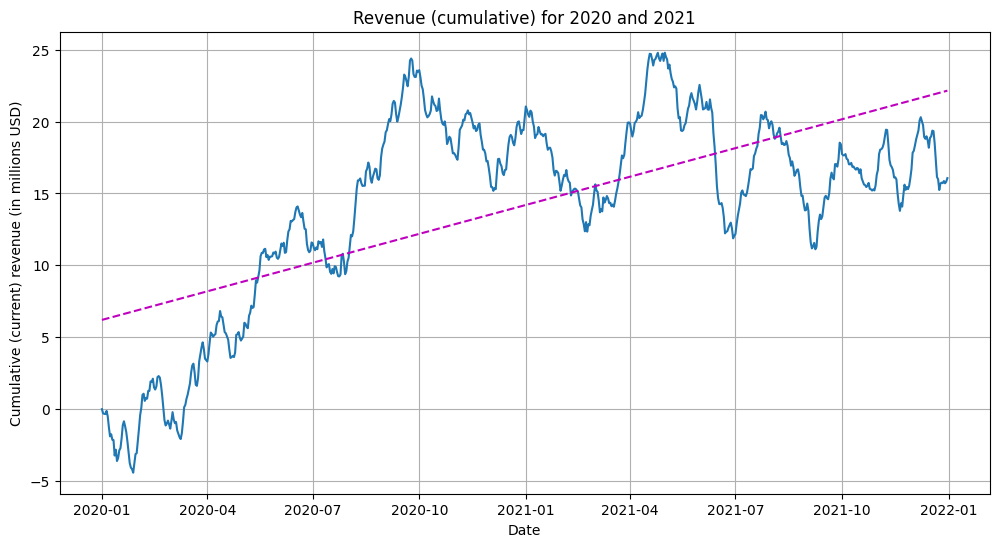

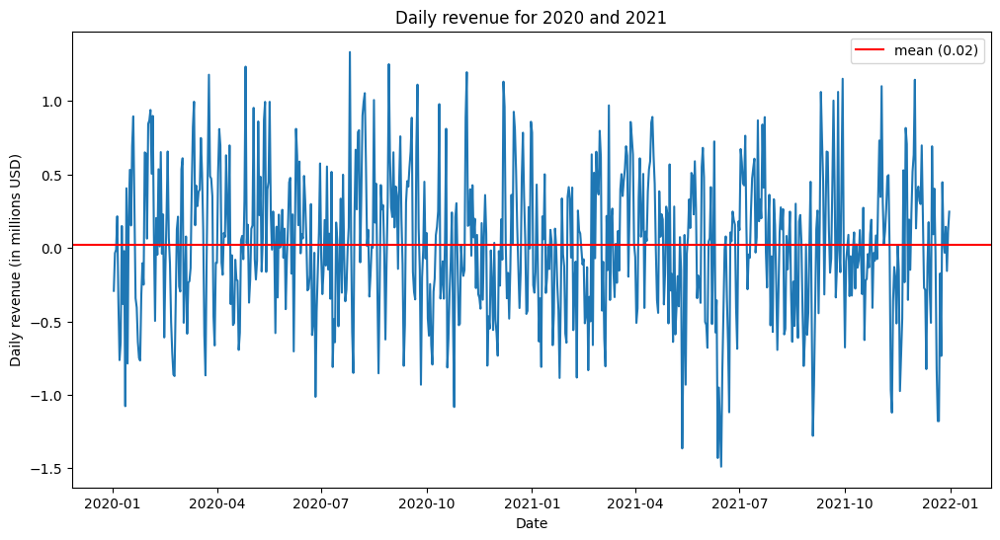

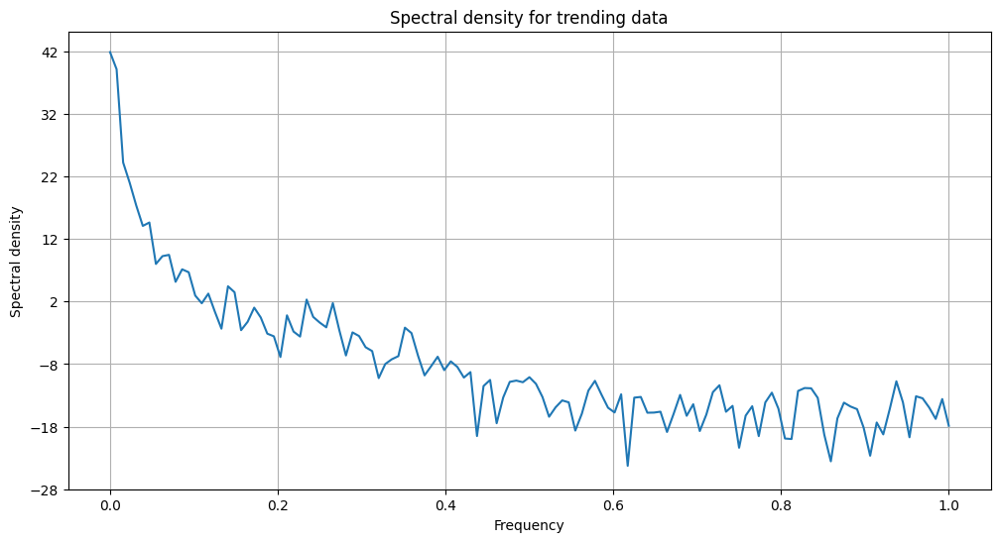

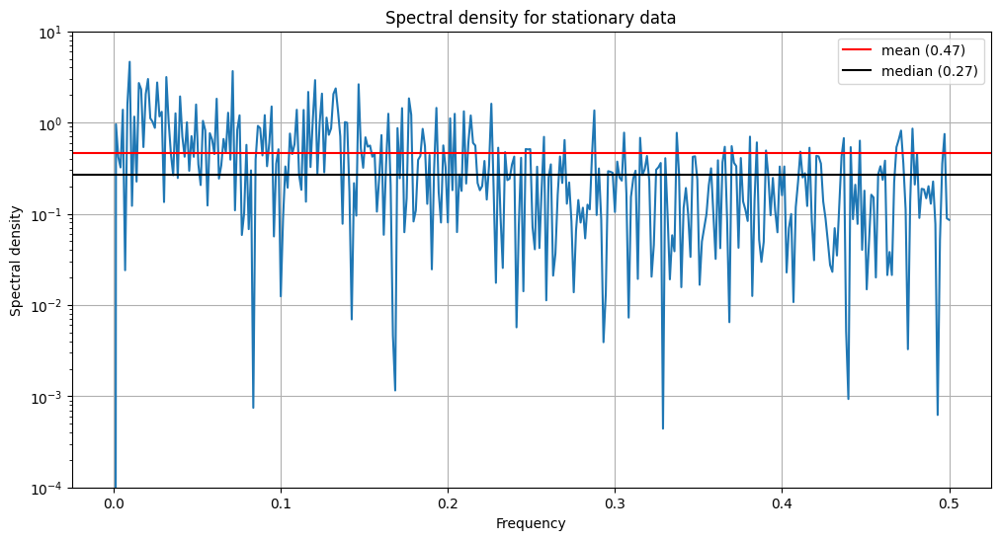

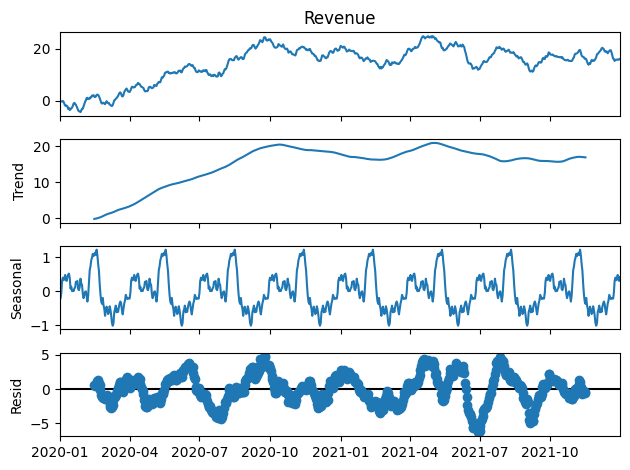

...

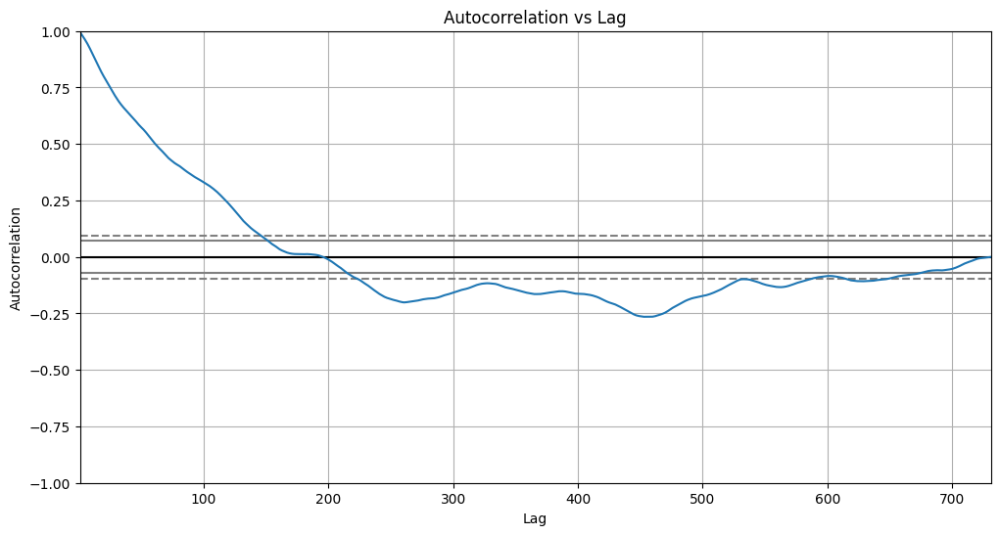

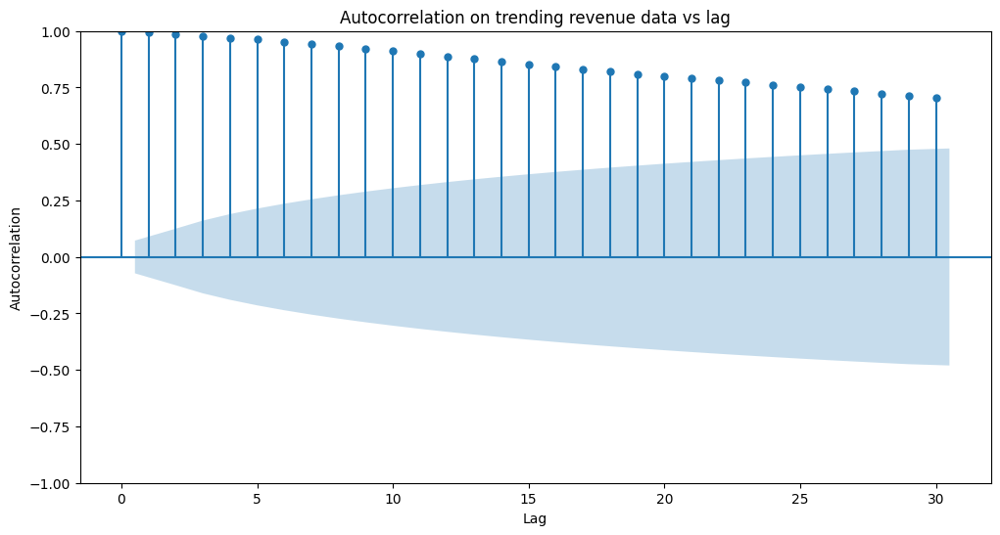

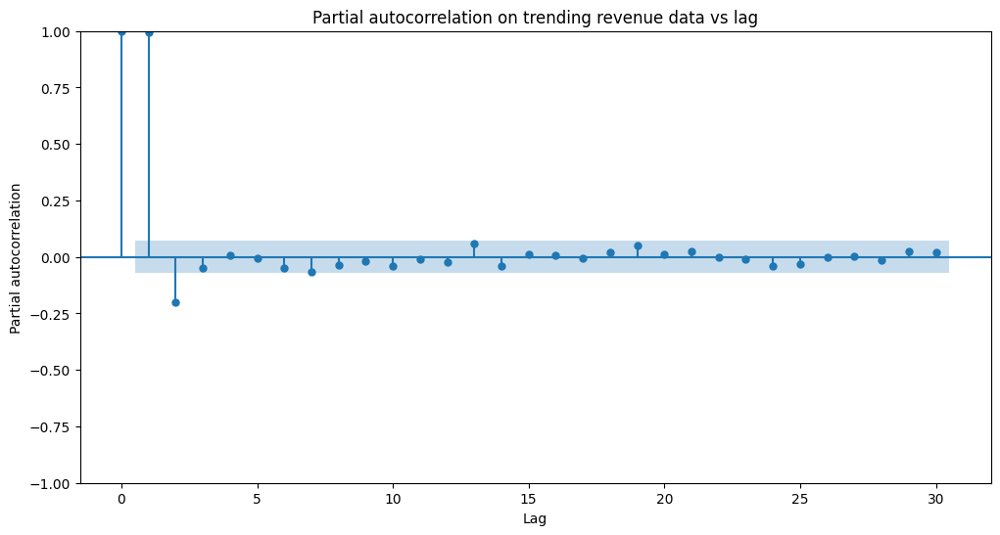

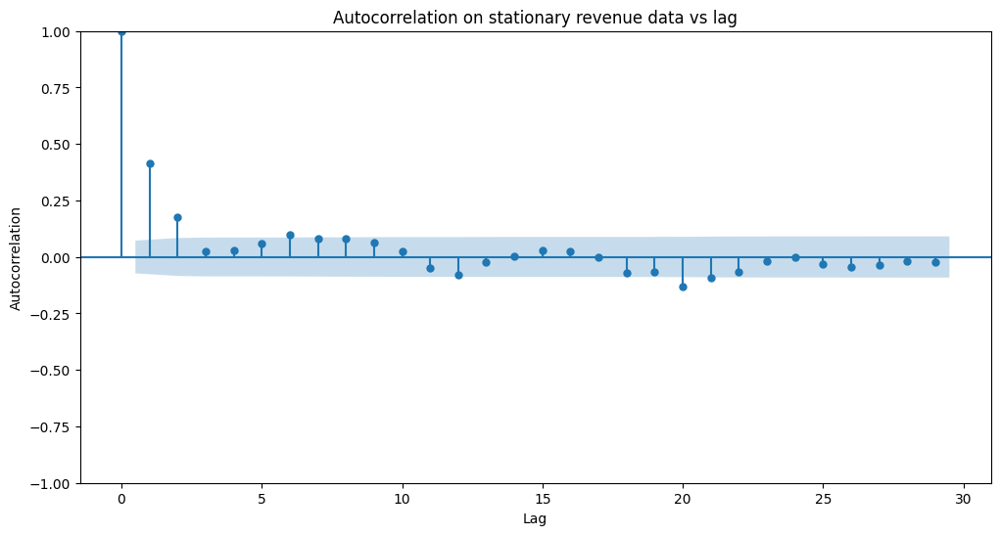

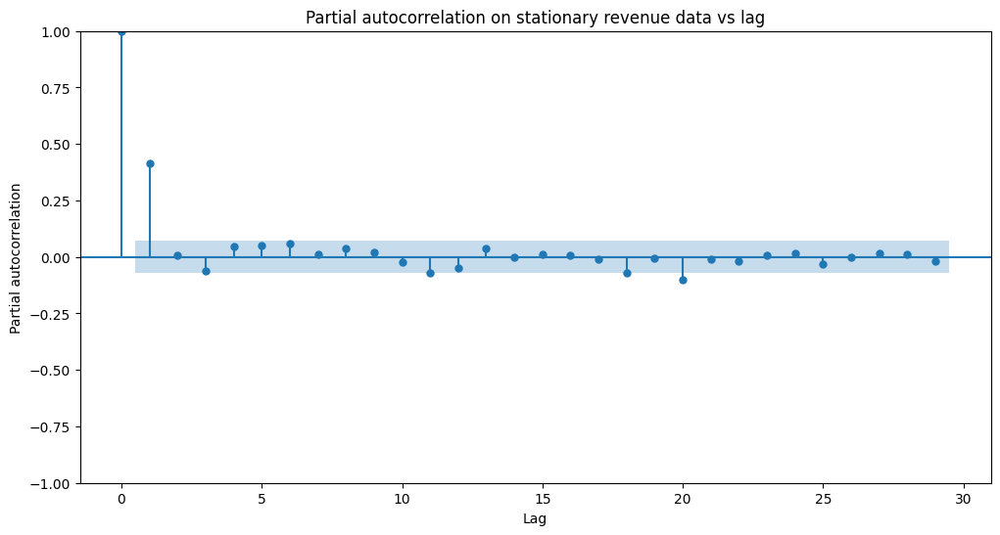

In [43]:
plots(df_med, df_stationary, False, False)

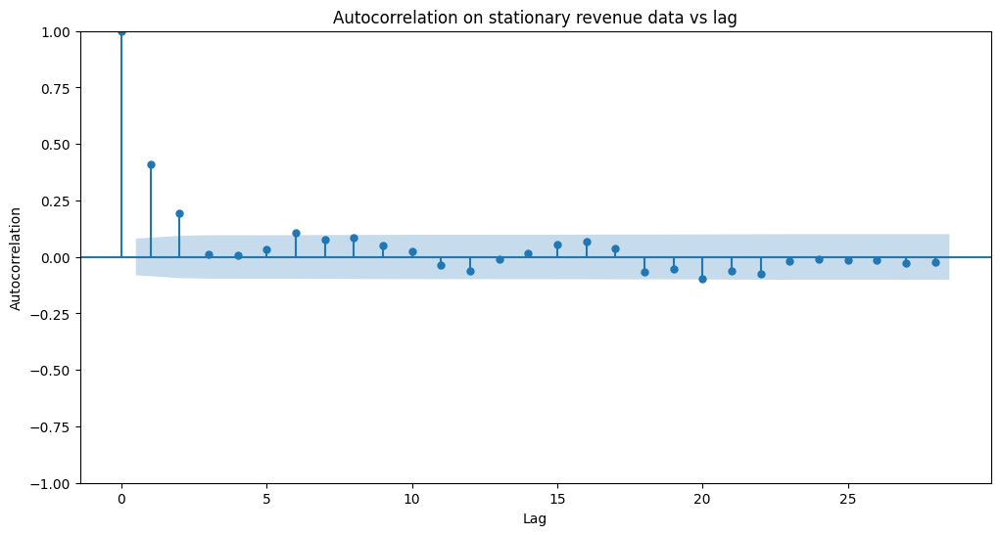

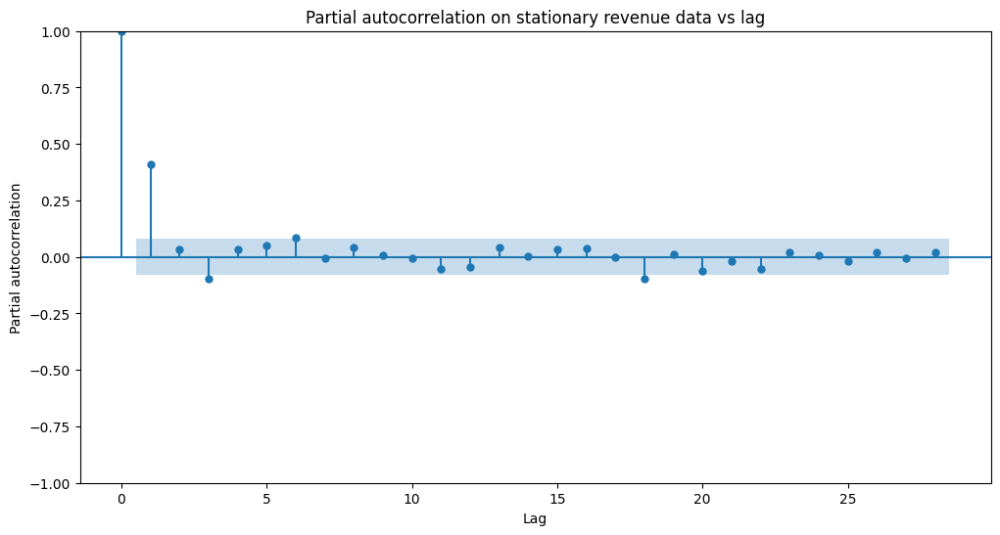

In [44]:
plots(X_train, X_statn_train, False, True, '_train')

In [45]:
# Adapted from Dr. Festus Elleh's “Task 1 Building Arima Model in Python video” lecture video, accessed 2024.
# https://wgu.hosted.panopto.com/Panopto/Pages/Viewer.aspx?id=1aaf2389-6483-4000-b498-b14f00441d57

# Selects ARIMA model with the lowest AIC and Ljung-Box statistic greater than lb_thresh = 0.05 and model
# coefficients with p-values below z_thresh = 0.10. Default value of d is 1 while p and q are looped from 0 to pq_rng-1.
# The SARIMAX trend parameter is looped over the array [None, 'c']. The models' AIC, smallest Ljung-Box value,
# largest p-value on model coefficients, and RSS values are placed in a dictionary with key (p, d, q, f_trend). The
# function returns the best model (lowest AIC and Ljung-Box > lb_thresh and coefficient p-values below z_thresh) and
# a dataframe for the models' AIC, smallest Ljung-Box value, the largest p-value for its coefficients, and RSS values
# (indexed by (p, d, q, f_trend) tuples). Methods other than 'lbfgs' were tried when fitting, but they all periodically 
# had convergence issues.
def aic_arima_search(pq_rng, d=1, data=X_train, season_param=None):
    # Could include 't', 'ct', or other options, but anything other than None or 'c' consistently created poor models
    trend_arr = [None, 'c']
    lb_thresh = 0.05
    z_thresh = 0.10
    mthd = 'lbfgs'

    aic_dict = {}
    best_aic = np.inf
    best_order = None
    best_model = None
    best_lb = None
    best_z_max = None

    for p in range(pq_rng):
        for q in range(pq_rng):
            for f_trend in trend_arr:
                try:
                    tmp_model = SARIMAX(data, order=(p, d, q), seasonal_order=season_param, trend=f_trend, freq='D')
                    tmp_results = tmp_model.fit(method=mthd, maxiter=100)
                    tmp_aic = tmp_results.aic
                    tmp_rss_mov = sum((tmp_results.fittedvalues - data['Revenue'])**2)
                    # When d != 1 this needs to be rewritten as nested diff()^d - this is currently a placeholder functional when d = 1
                    tmp_rss_statn = sum((tmp_results.fittedvalues.diff(d).dropna() - data['Revenue'].diff(d).dropna())**2)
                    tmp_ljung_box_results = acorr_ljungbox(tmp_results.filter_results.standardized_forecasts_error[0], lags=10, return_df=True)
                    tmp_lb_min = tmp_ljung_box_results['lb_pvalue'].min()
                    tmp_z_score_arr = []
                    for i in range(1, len(tmp_results.summary().tables[1])):
                        tmp_z_score_arr.append(float(str(tmp_results.summary().tables[1][i][4])))
                    tmp_z_max = max(tmp_z_score_arr)
                    aic_dict[(p, d, q, f_trend)] = (tmp_results.aic, tmp_lb_min, tmp_z_max, tmp_rss_statn, tmp_rss_mov)
                    print("p, d, q, f_trend: ", p, d, q, f_trend)
                    print("AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary): ", tmp_results.aic, tmp_results.bic, tmp_lb_min, tmp_z_max, tmp_rss_statn)
                    if tmp_aic < best_aic and tmp_lb_min > lb_thresh and tmp_z_max <= z_thresh:
                        best_aic = tmp_aic
                        best_order = (p, d, q, f_trend)
                        best_model = tmp_model
                        best_lb = tmp_lb_min
                        best_z_max = tmp_z_max
                except:
                    print(f"Encountered an error with the above SARIMAX model on (p, d, q) = {(p, d, q)} and trend = '{f_trend}'.\n")
                    print(p, d, q, None, None)

    print(f"\nBest AIC: {best_aic} | Order: {best_order} | Ljung-Box: {best_lb} | Largest coefficient p-value: {best_z_max} | Seasonal order fixed at {season_param}")
    aic_dict = {k: v for k, v in sorted(aic_dict.items(), key=lambda s: s[1][0])}
    df_aic = pd.DataFrame.from_dict(aic_dict, orient='index', columns=['AIC', 'Ljung-Box min', 'Largest coef p-value', 'RSS (stationary)', 'RSS (with trend)'])
    with pd.option_context('display.max_rows', None):
        print(f"\nModels with Ljung-Box p-values above {lb_thresh}:\n")
        print(df_aic[df_aic['Ljung-Box min'] > lb_thresh])
        print(f"\nModels with Ljung-Box p-values above {lb_thresh} and coefficient p-values below {z_thresh}:\n")
        print(df_aic[(df_aic['Ljung-Box min'] > lb_thresh) & (df_aic['Largest coef p-value'] <= z_thresh)])
    print("Best model:\n", best_model.fit(method=mthd, maxiter=100).summary())
    return best_model, df_aic

In [21]:
b_model, b_aic = aic_arima_search(3, 1, X_train, (2, 1, 0, 104))

p, d, q, f_trend:  0 1 0 None
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  842.7209589439852 855.236060736218 2.2484946329382223e-25 0.0 220.0159443545302
p, d, q, f_trend:  0 1 0 c
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  842.8719208047273 859.5587231943709 2.572873709906637e-25 0.183 219.87907078166623
p, d, q, f_trend:  0 1 1 None
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  771.4604627113063 788.1472651009499 1.645945930742926e-05 0.0 289.47245883403724
p, d, q, f_trend:  0 1 1 c
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  772.1352897728922 792.9937927599467 1.7312115979268168e-05 0.255 289.06029695674465
p, d, q, f_trend:  0 1 2 None
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  751.4307942662888 772.2892972533433 0.6814481040745597 0.0 295.3992793253318
p, d, q, f_trend:  0 1 2 c
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  752.4729478383289 777.503151

C:\Users\Joe\Desktop\Files\Programming\WGU MS\Python_projects\.venv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Joe\Desktop\Files\Programming\WGU MS\Python_projects\.venv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


p, d, q, f_trend:  2 1 1 None
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  757.0315206555731 782.0617242400386 0.13384140771822645 0.093 292.0109658904266


C:\Users\Joe\Desktop\Files\Programming\WGU MS\Python_projects\.venv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Joe\Desktop\Files\Programming\WGU MS\Python_projects\.venv\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


p, d, q, f_trend:  2 1 1 c
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  758.1967900007118 787.3986941825882 0.12809838511612207 0.369 291.48054388971923
p, d, q, f_trend:  2 1 2 None
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  754.0324133511022 783.2343175329786 0.9045972540432836 0.967 295.117881017848
p, d, q, f_trend:  2 1 2 c
AIC, BIC, min Ljung-Box, largest coef p-value, RSS (stationary):  754.959965587064 788.3335703663513 0.9128903215523925 0.941 294.58741600247316

Best AIC: 751.4307942662888 | Order: (0, 1, 2, None) | Ljung-Box: 0.6814481040745597 | Largest coefficient p-value: 0.0 | Seasonal order fixed at (2, 1, 0, 104)

Models with Ljung-Box p-values above 0.05:

                        AIC  Ljung-Box min  Largest coef p-value  \
(0, 1, 2, None)  751.430794       0.681448                 0.000   
(0, 1, 2, c)     752.472948       0.683437                 0.333   
(1, 1, 2, None)  753.367386       0.683518                 0.826   
(

In [23]:
# Uses a Fast Fourier Transform on stationary data to look for prominent seasonal signals. Provides a plot and
# dictionary of the top 'max_peaks' frequencies, along with their associated periods and powers.
def seasonal_fft(max_peaks=5, df=df_stationary):
    itvl = 1.0
    fig_dims = (12, 6)

    fft_frq = np.fft.fftfreq(len(df))
    spec_pwr = np.abs(np.fft.fft(df['Revenue'])) ** 2

    plt.figure(figsize=fig_dims)
    plt.plot(fft_frq, spec_pwr)
    plt.xlabel('Frequency')
    plt.ylabel('Power')
    plt.xlim(0.0, 0.5)
    plt.title('FFT power spectrum of detrended revenue')
    plt.show()

    dom_idx = np.argsort(spec_pwr[:len(fft_frq) // 2])[::-1][:max_peaks]
    dom_pwr = spec_pwr[np.argsort(spec_pwr[:len(fft_frq) // 2])[::-1][:max_peaks]]
    dom_frqs = fft_frq[dom_idx]
    dom_periods = itvl / np.array(dom_frqs)
    dom_dict = {k: v for k, v in zip(np.round(dom_periods, 3), np.round(dom_pwr, 3))}

    print(f'Top {max_peaks} dominant frequencies: {np.round(dom_frqs, 5)}')
    print(f'Corresponding dominant periods and powers: {dom_dict}')
    return dom_dict

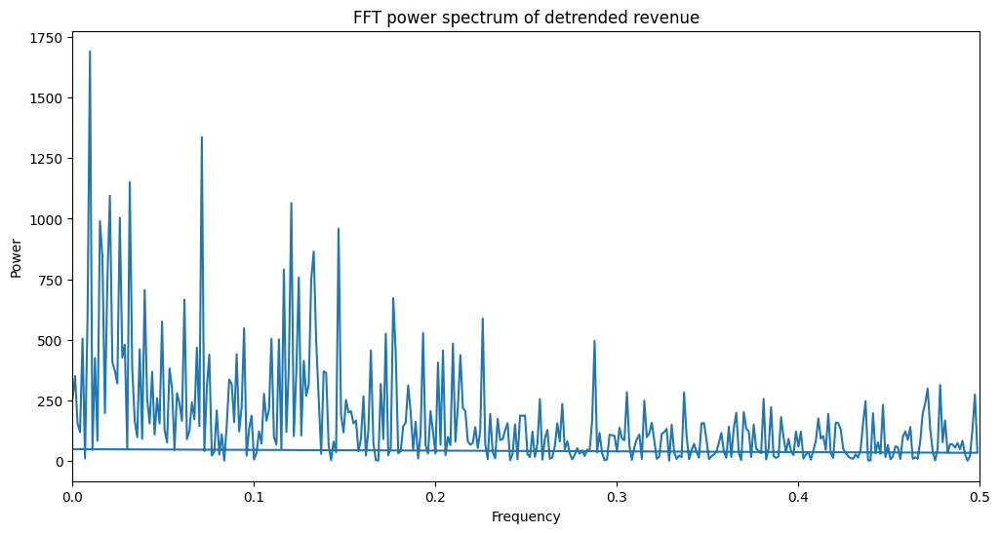

Top 7 dominant frequencies: [0.00959 0.07123 0.03151 0.02055 0.12055 0.02603 0.01507]
Corresponding dominant periods and powers: {104.286: 1691.46, 14.038: 1336.869, 31.739: 1150.716, 48.667: 1095.051, 8.295: 1064.39, 38.421: 1003.283, 66.364: 990.04}


In [24]:
fft_dict = seasonal_fft(7, df_stationary)

In [25]:
# Produces several plots (such as ACF, PACF, and rolling differences) to investigate seasonality. The seasonal period
# is set by 'per', 'max_lags' defines the range of most plots, and save=False by default as the global 'img_dir' at
# the top of the file is set to the local environment.
def inspect_seasonal(per=100, max_lags=600, df=df_med, save=False):
    fig_dims = (12, 6)
    # roll_window_arr = [14, 32, 104]
    roll_window_arr = [15, 30, 90]
    color_arr = [['green', 'red', 'xkcd:dark rose'], ['orange', 'blue', 'xkcd:hot pink'], ['purple', 'xkcd:neon green', 'cyan']]
    df_season = df.diff().diff(per).dropna()

    fig_0 = plt.figure(figsize=fig_dims)
    ax_0 = fig_0.add_subplot(111)
    fig_0 = plot_acf(df_stationary['Revenue'], lags=max_lags, ax=ax_0)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title('Autocorrelation on stationary revenue data vs lag')
    if save:
        plt.savefig(img_dir+'seasonal_acf_statn.png')
    plt.show()

    fig_1 = plt.figure(figsize=(24, 12))
    for i, w in enumerate(roll_window_arr):
        fig_1.add_subplot(3, 1, i+1)
        mean_roll = df.rolling(w).mean()
        std_roll = df.rolling(w).std()
        df_roll_diff = (df - mean_roll).dropna()
        plt.plot(df['Revenue'], color='black', label='Original', linestyle='dotted')
        plt.plot(df_roll_diff['Revenue'], color=color_arr[i][0], label=f'Rolling difference ({w}d)', linestyle='dashed')
        plt.plot(mean_roll, color=color_arr[i][1], label=f'Rolling mean ({w}d)')
        plt.plot(std_roll, color=color_arr[i][2], label=f'Rolling std ({w}d)', linestyle='dashdot')
        plt.xlabel('Date')
        plt.ylabel('Revenue (in millions USD)')
        plt.title(f'Rolling difference ({w}d), mean, and standard deviation against original')
        plt.legend(loc='best')
    plt.tight_layout()
    if save:
        plt.savefig(img_dir+'seasonal_rolling_diffs.png')
    plt.show()

    fig_2 = plt.figure(figsize=fig_dims)
    ax_2 = fig_2.add_subplot(111)
    fig_2 = plot_acf(df_roll_diff, lags=max_lags, ax=ax_2)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on difference of trending data with {roll_window_arr[-1]} day rolling average')
    plt.annotate(text='61', xy=(58, -0.193))
    plt.annotate(text='111', xy=(101, 0.249))
    plt.annotate(text='163', xy=(160, -0.235))
    plt.annotate(text='216', xy=(206, 0.229))
    plt.annotate(text='278', xy=(275, -0.316))
    plt.annotate(text='334', xy=(324, 0.062))
    plt.grid(True)
    if save:
        plt.savefig(img_dir+f'seasonal_rolling_diff_{roll_window_arr[-1]}_acf.png')
    plt.show()

    plt.figure(figsize=fig_dims)
    plt.plot(df_season['Revenue'])
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.title(f'Time series after first order difference then seasonal difference of {per}')
    if save:
        plt.savefig(img_dir+f'seasonal_revenue_statn_{per}.png')
    plt.show()

    fig_3 = plt.figure(figsize=fig_dims)
    ax_3 = fig_3.add_subplot(111)
    fig_3 = plot_acf(df_season, lags=max_lags, ax=ax_3)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on seasonally differenced data .diff().diff({per})')
    if save:
        plt.savefig(img_dir+f'seasonal_differenced_acf_{per}.png')
    plt.show()

    fig_4 = plt.figure(figsize=fig_dims)
    ax_4 = fig_4.add_subplot(111)
    fig_4 = plot_acf(df_season['Revenue'], lags=range(per, max_lags+1, per), ax=ax_4)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on seasonally differenced data .diff().diff({per}) by periodic increments')
    if save:
        plt.savefig(img_dir+f'seasonal_differenced_acf_periodic_{per}.png')
    plt.show()

    fig_5 = plt.figure(figsize=fig_dims)
    ax_5 = fig_5.add_subplot(111)
    fig_5 = plot_pacf(df_season['Revenue'], lags=range(per, int(max_lags/2+1), per), ax=ax_5)
    plt.xlabel('Lag')
    plt.ylabel('Partial autocorrelation')
    plt.title(f'Partial autocorrelation on seasonally differenced data .diff().diff({per}) by periodic increments')
    if save:
        plt.savefig(img_dir+f'seasonal_differenced_pacf_periodic_{per}.png')
    plt.show()

    return

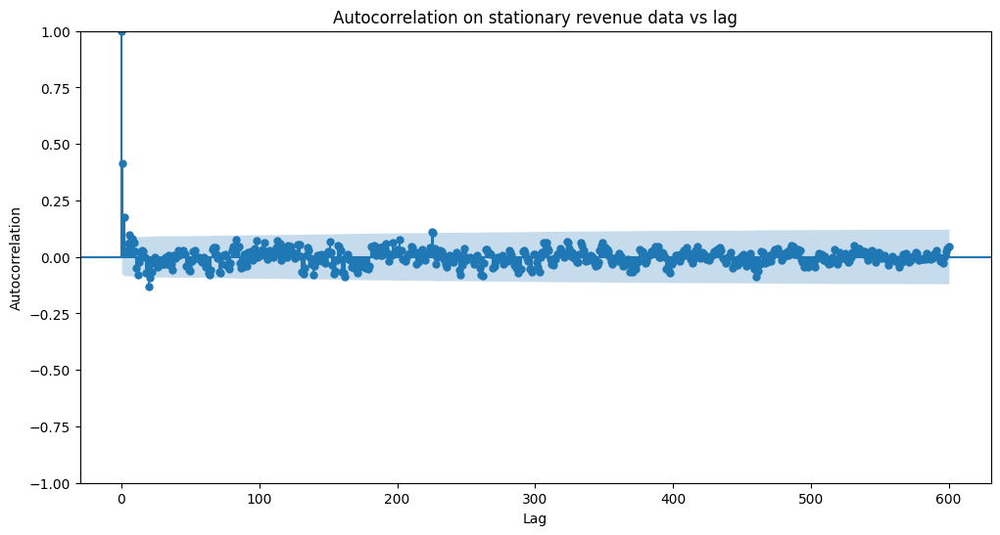

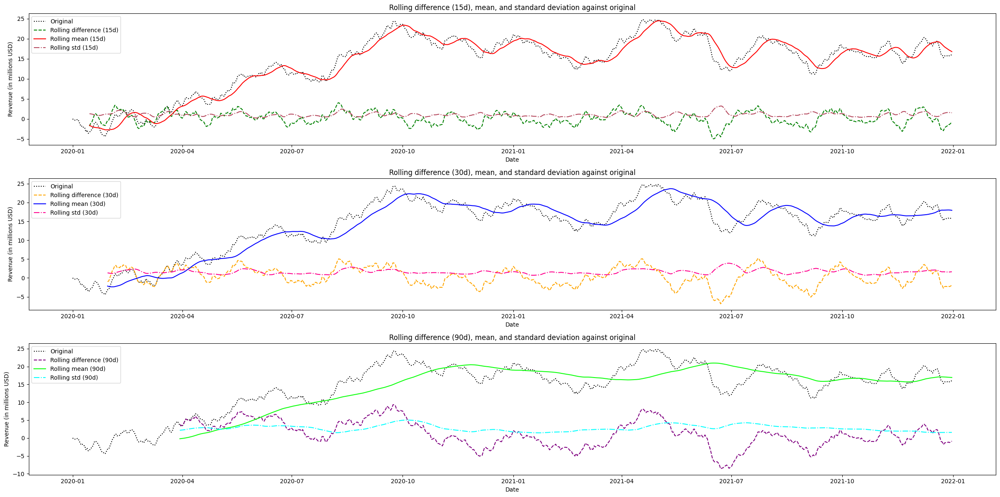

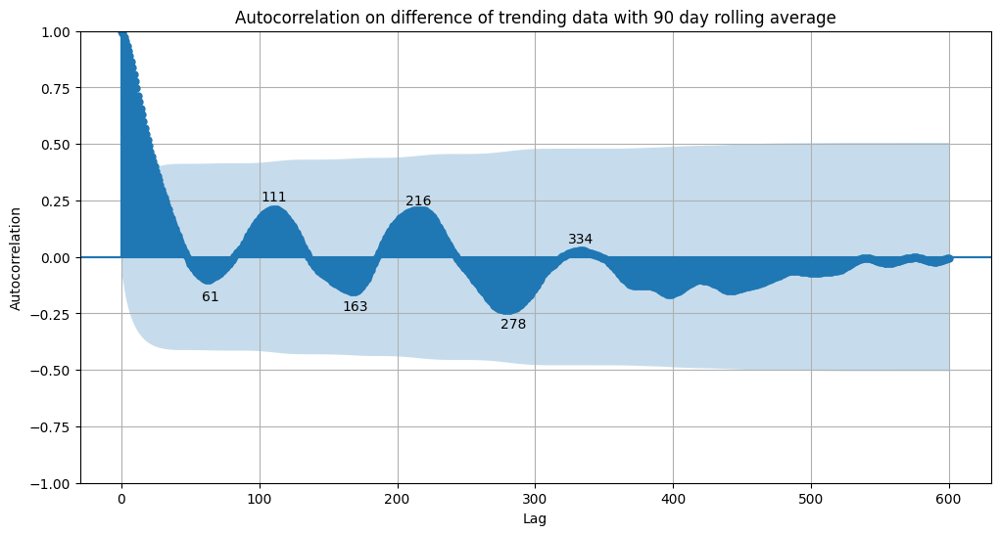

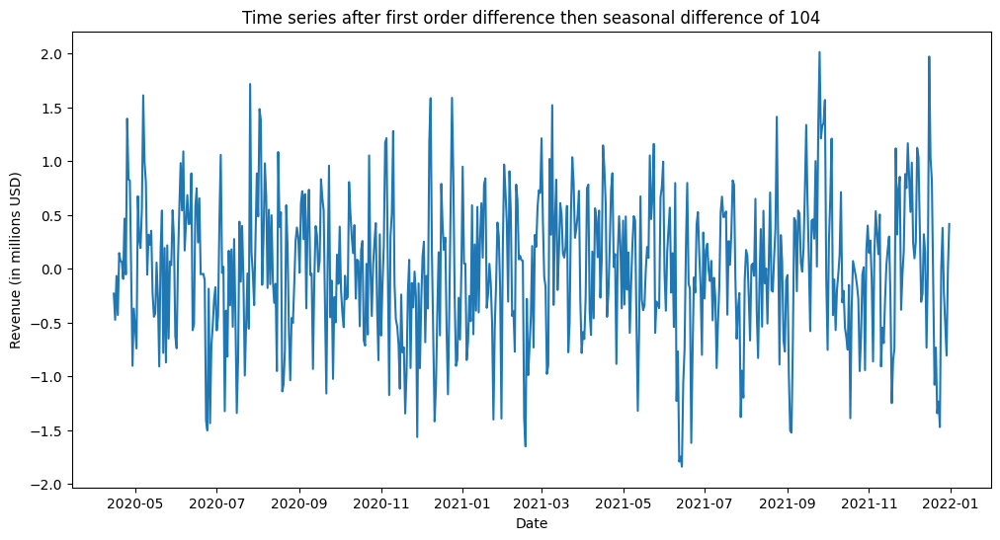

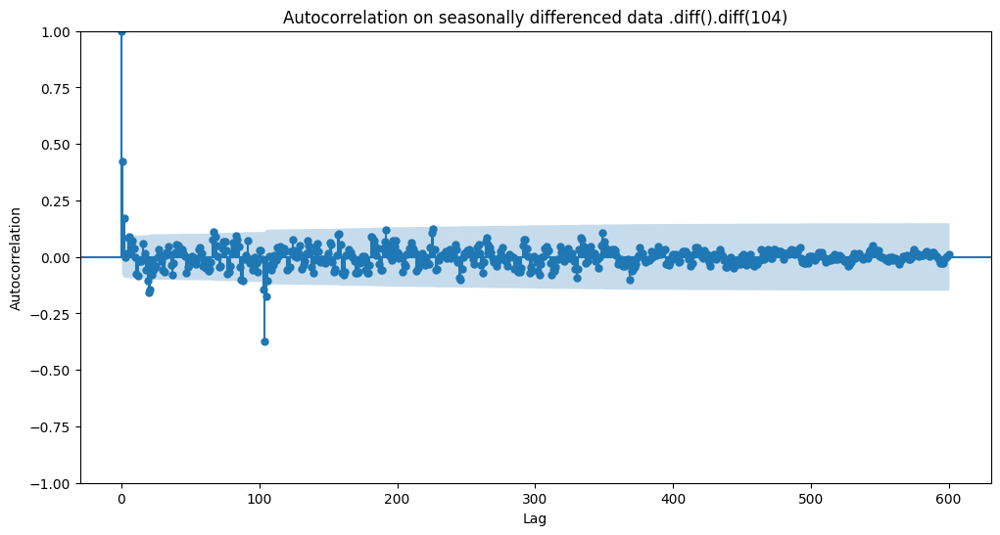

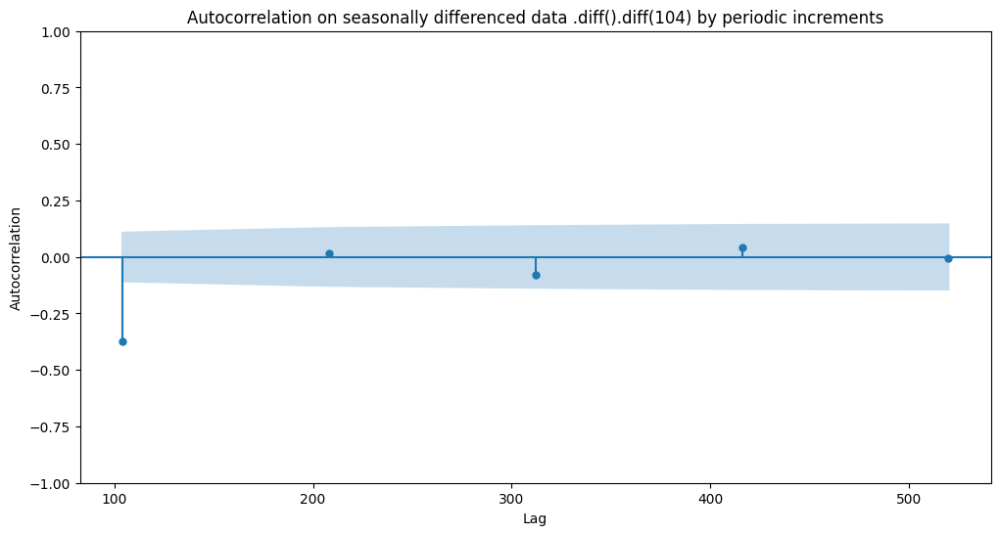

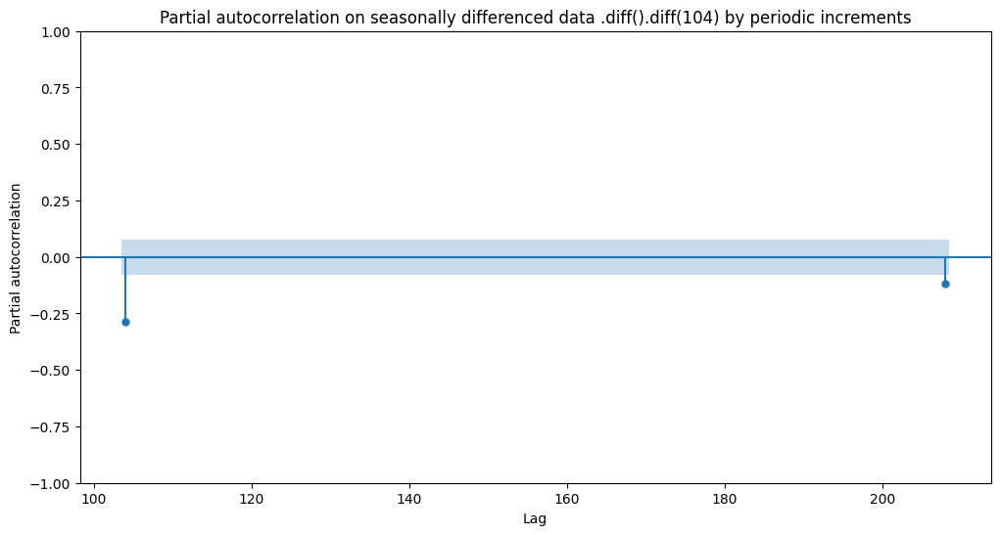

In [26]:
inspect_seasonal(104, 600, df_med, False)

In [27]:
# Creates 16 subplots of seasonal decomposition seasonal and residual components on trending and stationary data,
# along with their corresponding autocorrelation functions.
def seasonal_plots(perd, save=False, df_mov=df_med, df_statn=df_stationary):
    max_lags = perd * 3
    decomp_mov = seasonal_decompose(df_mov['Revenue'], period=perd)
    fig1 = plt.figure(figsize=(24, 12))
    fig1.add_subplot(4, 4, 1)
    plt.plot(decomp_mov.resid)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Residuals of seasonal decomposition of trending revenue (period {perd})')

    fig1.add_subplot(4, 4, 2)
    plt.plot(decomp_mov.seasonal)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Seasonal decomposition of trending revenue (period {perd})')

    plot_acf(decomp_mov.resid.dropna(), lags=max_lags, ax=fig1.add_subplot(4, 4, 3))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on non-stationary residuals (period {perd})')

    plot_acf(decomp_mov.seasonal, lags=max_lags, ax=fig1.add_subplot(4, 4, 4))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on non-stationary seasonal component (period {perd})')

    decomp_mov = seasonal_decompose(df_mov['Revenue'])
    fig1.add_subplot(4, 4, 5)
    plt.plot(decomp_mov.resid)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Residuals of seasonal decomposition of trending revenue (no period)')

    fig1.add_subplot(4, 4, 6)
    plt.plot(decomp_mov.seasonal)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title('Seasonal decomposition of trending revenue (no period)')

    plot_acf(decomp_mov.resid.dropna(), lags=max_lags, ax=fig1.add_subplot(4, 4, 7))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on non-stationary residuals (no period))')

    plot_acf(decomp_mov.seasonal, lags=max_lags, ax=fig1.add_subplot(4, 4, 8))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on non-stationary seasonal component (no period)')

    decomp_stat = seasonal_decompose(df_statn['Revenue'], period=perd)
    fig1.add_subplot(4, 4, 9)
    plt.plot(decomp_stat.resid)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Residuals of seasonal decomposition of stationary revenue (period {perd})')

    fig1.add_subplot(4, 4, 10)
    plt.plot(decomp_stat.seasonal)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Seasonal decomposition of stationary revenue (period {perd})')

    plot_acf(decomp_stat.resid.dropna(), lags=max_lags, ax=fig1.add_subplot(4, 4, 11))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on stationary residuals with period {perd}')

    plot_acf(decomp_stat.seasonal, lags=max_lags, ax=fig1.add_subplot(4, 4, 12))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on stationary seasonal component with period {perd}')

    decomp_stat = seasonal_decompose(df_statn['Revenue'])
    fig1.add_subplot(4, 4, 13)
    plt.plot(decomp_stat.resid)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title(f'Residuals of seasonal decomposition of stationary revenue (no period)')

    fig1.add_subplot(4, 4, 14)
    plt.plot(decomp_stat.seasonal)
    plt.xlabel('Date')
    plt.ylabel('USD (in millions)')
    plt.title('Seasonal decomposition of stationary revenue (no period)')

    plot_acf(decomp_stat.resid.dropna(), lags=max_lags, ax=fig1.add_subplot(4, 4, 15))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on stationary residuals (no period))')

    plot_acf(decomp_stat.seasonal, lags=max_lags, ax=fig1.add_subplot(4, 4, 16))
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation on stationary seasonal component (no period))')

    plt.tight_layout()
    if save:
        plt.savefig(img_dir+f'seasonal_plots_{perd}.png')
    plt.show()
    return

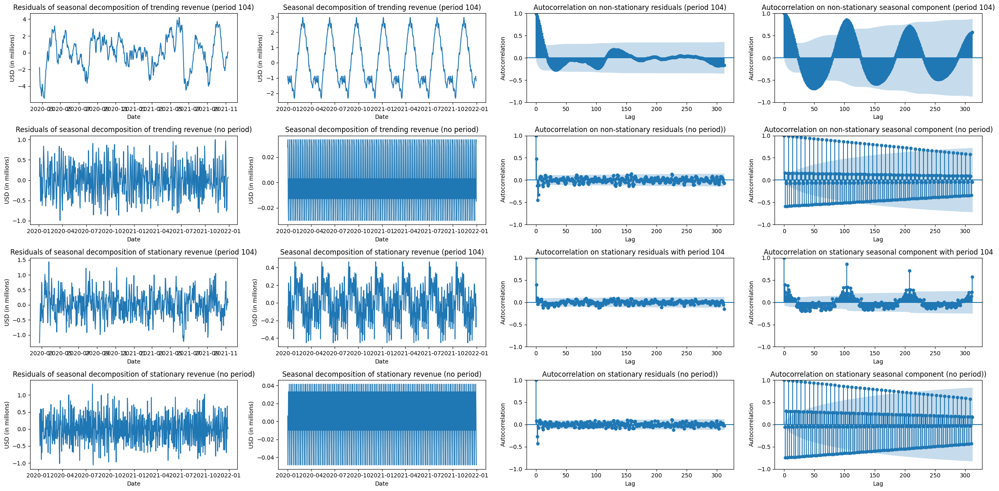

In [28]:
seasonal_plots(104, False, df_med, df_stationary)

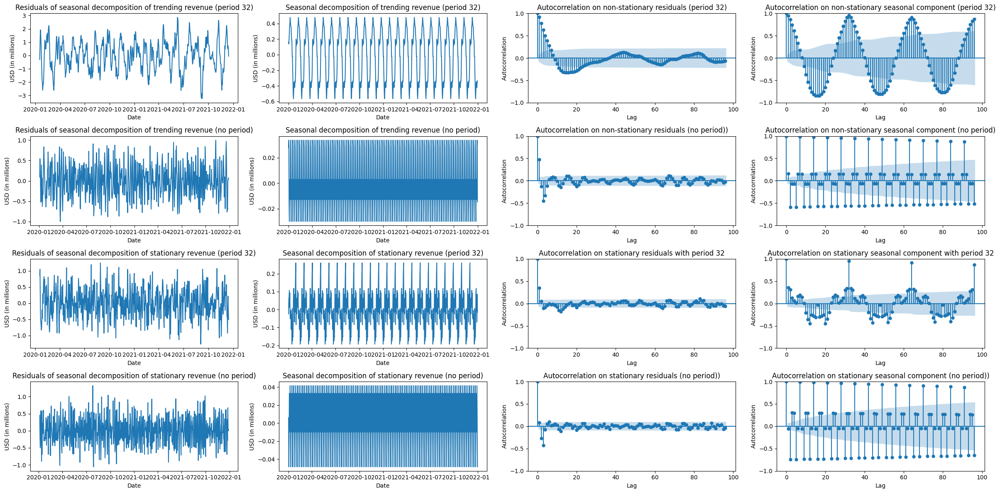

In [21]:
seasonal_plots(32, False, df_med, df_stationary)

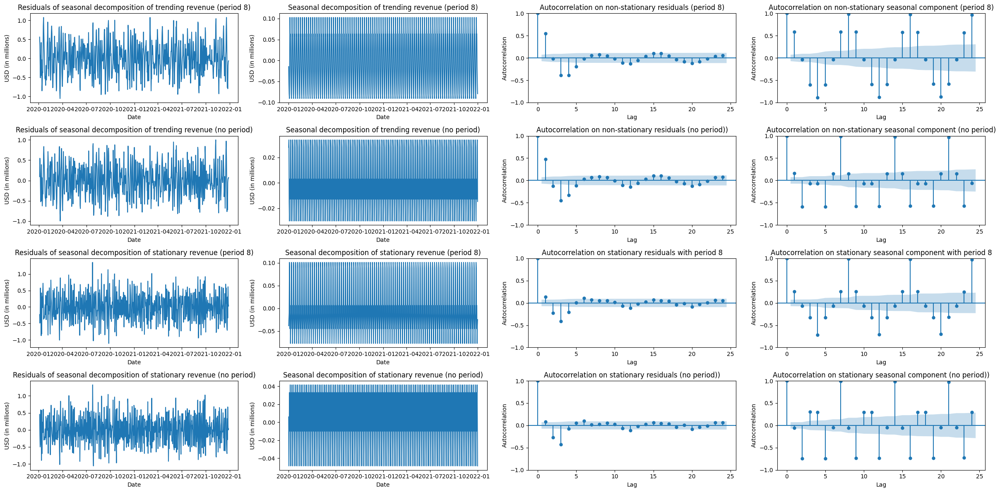

In [29]:
seasonal_plots(8, False, df_med, df_stationary)

In [27]:
# Creates a SARIMAX model using input 'data' with order 'ordr' as a tuple (p, d, q) and trend 'f_trend' and
# seasonal_order 'season_param'. The trend and seasonal_order default to None. Calculates results, RSS, RMSE, MAE,
# and Ljung-Box values. Returns the model, its results from applying .fit(), and the created dataframe df_results for
# additional statistics (when simple=False).
def model_creation(data, ordr, f_trend=None, season_param=None, simple=False):
    fq = 'D'
    fit_method = 'lbfgs'
    iter_max = 100
    max_lag = 10
    p, d, q = ordr

    model0 = SARIMAX(data, order=(p, d, q), seasonal_order=season_param, trend=f_trend, freq=fq)
    results0 = model0.fit(method=fit_method, maxiter=iter_max)

    if simple:
        return model0, results0
    else:
        rss = sum((results0.fittedvalues - data['Revenue']) ** 2)
        ljung_box_results = acorr_ljungbox(results0.filter_results.standardized_forecasts_error[0], lags=max_lag, return_df=True)
        lb_min = ljung_box_results['lb_pvalue'].min()
        rmse = np.sqrt(mean_squared_error(results0.fittedvalues, data['Revenue']))
        mae = np.mean(np.abs(results0.resid))

        if d == 1:
            rss_statn = sum((results0.fittedvalues.diff(d).dropna() - data['Revenue'].diff(d).dropna()) ** 2)
            df_results = pd.DataFrame([rmse, mae, rss, rss_statn, lb_min], columns=['Value'], index=['RMSE', 'MAE', 'RSS', 'RSS (stationary)', 'Lowest Ljung-Box p-value'])
        else:
            df_results = pd.DataFrame([rmse, mae, rss, lb_min], columns=['Value'], index=['RMSE', 'MAE', 'RSS', 'Lowest Ljung-Box p-value'])
        print(results0.summary())
        print(f"\nAdditional model statistics:\n{df_results}\n")
        print(f"Ljung-Box statistics for lags 1 to {max_lag}:\n{ljung_box_results}\n")
        results0.plot_diagnostics(figsize=[16, 10])
        plt.show()
        return model0, results0, df_results

                                      SARIMAX Results                                       
Dep. Variable:                              Revenue   No. Observations:                  584
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 104)   Log Likelihood                -370.715
Date:                              Sat, 01 Jun 2024   AIC                            751.431
Time:                                      20:38:34   BIC                            772.289
Sample:                                  01-01-2020   HQIC                           759.631
                                       - 08-06-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4150      0.043      9.590      0.000       0.330       0.500
ma.L2          0.21

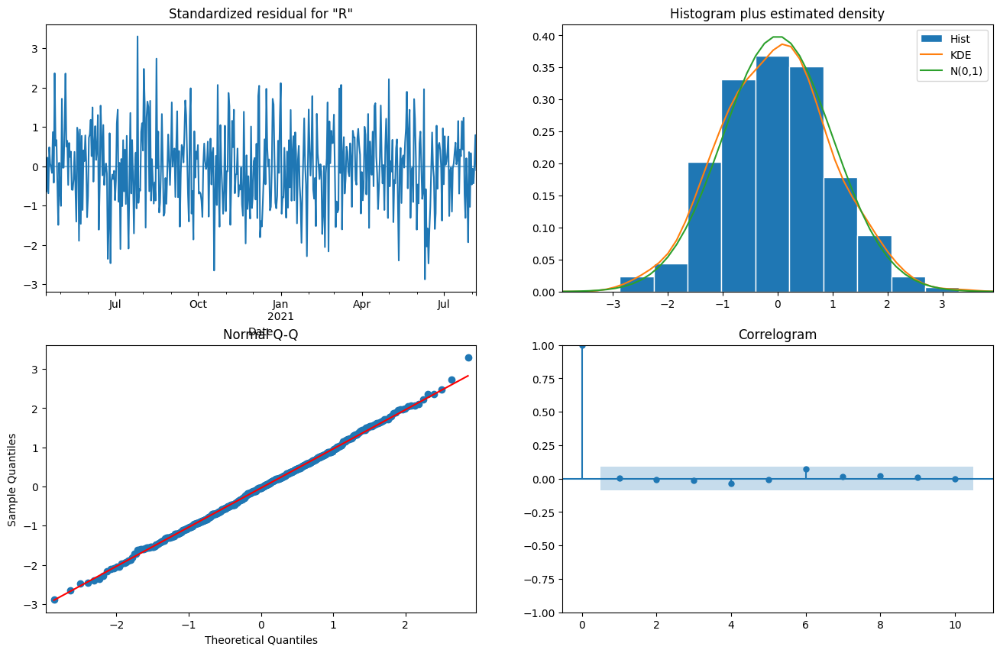

In [46]:
model_0, results_0, df_results_0 = model_creation(X_train, (0, 1, 2), None, (2, 1, 0, 104), False)

                                      SARIMAX Results                                      
Dep. Variable:                             Revenue   No. Observations:                  584
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 32)   Log Likelihood                -418.997
Date:                             Sun, 02 Jun 2024   AIC                            847.994
Time:                                     16:07:43   BIC                            869.553
Sample:                                 01-01-2020   HQIC                           856.418
                                      - 08-06-2021                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4012      0.041      9.750      0.000       0.321       0.482
ma.L2          0.1664      

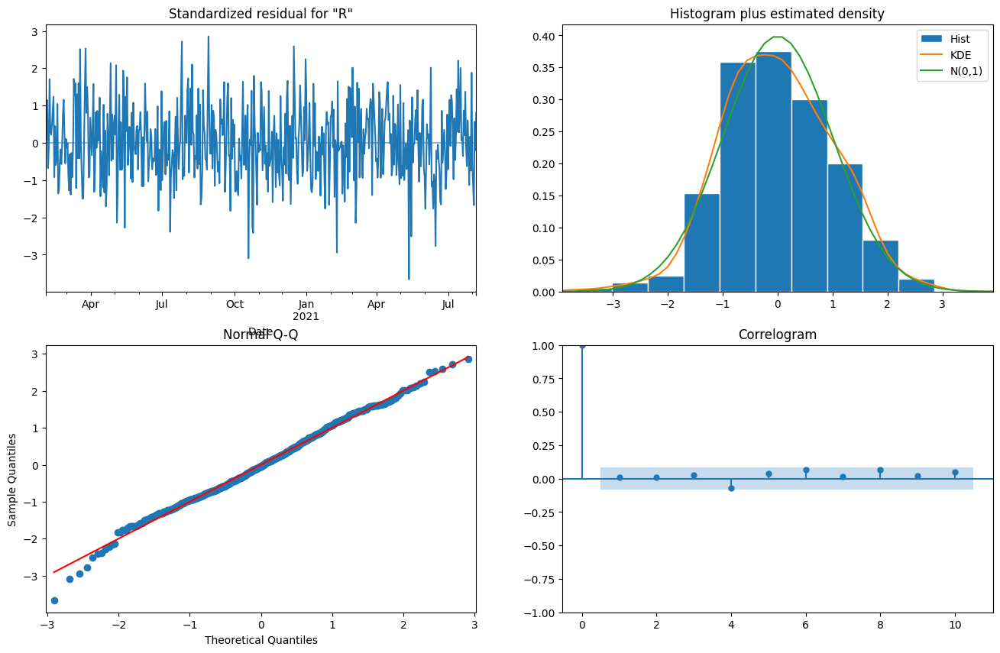

In [28]:
model_32, results_32, df_results_32 = model_creation(X_train, (0, 1, 2), None, (2, 1, 0, 32), False)

                                     SARIMAX Results                                      
Dep. Variable:                            Revenue   No. Observations:                  584
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 8)   Log Likelihood                -418.716
Date:                            Sun, 02 Jun 2024   AIC                            847.432
Time:                                    16:07:44   BIC                            869.203
Sample:                                01-01-2020   HQIC                           855.923
                                     - 08-06-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3805      0.041      9.294      0.000       0.300       0.461
ma.L2          0.2236      0.042   

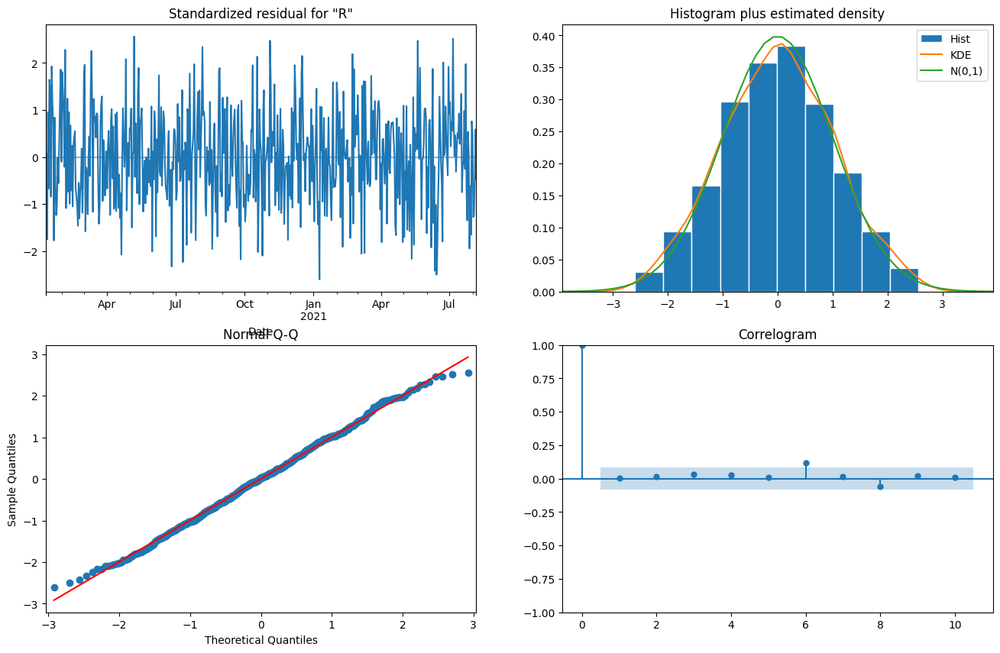

In [29]:
model_8, results_8, df_results_8 = model_creation(X_train, (0, 1, 2), None, (2, 1, 0, 8), False)

In [48]:
# Passes order, trend, and season_order to model_creation using training data from an 80/20 split of df. Calculates
# predictions and forecasts three months beyond the end of the dataset. Produces plots of the model's residuals and
# predictions/forecasts. Then calculates model evaluation statistics and returns it as a dataframe.
def model_predictions(order, trend=None, season_order=None, df=df_med, save=False):
    split = 0.2
    forecast_steps = 237
    fig_dim = (12, 6)
    pred_color = 'r'
    fill_color = 'pink'
    forecast_end = '03-31-2022'

    train_data, test_data = train_test_split(df, test_size=split, shuffle=False)
    model_train, model_results = model_creation(train_data, order, trend, season_order, True)
    train_fitted = model_results.fittedvalues

    predictions = model_results.predict(len(train_data), end=(len(df) - 1))
    prediction = model_results.get_prediction(start=len(train_data), end=(len(df)-1))
    confidence_intervals_pr = prediction.conf_int()
    lower_lims_pr = confidence_intervals_pr.loc[:, 'lower Revenue']
    upper_lims_pr = confidence_intervals_pr.loc[:, 'upper Revenue']
    x_pr = matplotlib.dates.date2num(predictions.index)
    L_pr = np.poly1d(np.polyfit(x_pr, predictions, 1))

    md_forecasting = model_results.forecast(forecast_steps)
    md_forecast = model_results.get_forecast(forecast_steps)
    confidence_intervals_ft = md_forecast.conf_int()
    lower_lims_ft = confidence_intervals_ft.loc[:, 'lower Revenue']
    upper_lims_ft = confidence_intervals_ft.loc[:, 'upper Revenue']
    x_ft = matplotlib.dates.date2num(md_forecasting.index)
    L_ft = np.poly1d(np.polyfit(x_ft, md_forecasting, 1))

    model_updated = model_results.append(test_data)
    updated_forecast = model_updated.forecast(forecast_steps-len(test_data))
    md_forecast_upd = model_updated.get_forecast(forecast_steps-len(test_data))
    confidence_intervals_ft_upd = md_forecast_upd.conf_int()
    lower_lims_ft_upd = confidence_intervals_ft_upd.loc[:, 'lower Revenue']
    upper_lims_ft_upd = confidence_intervals_ft_upd.loc[:, 'upper Revenue']
    x_ft_upd = matplotlib.dates.date2num(updated_forecast.index)
    L_ft_upd = np.poly1d(np.polyfit(x_ft_upd, updated_forecast, 1))

    print(f"Predicted values across test data:\n{predictions}\n")
    print(f"Forecasted values through {forecast_end}:\n{md_forecasting}\n")
    print(f"Forecasted values from 01-01-2022 through {forecast_end} after appending test data (model is still trained on training data):\n{updated_forecast}\n")

    resid_train = model_results.resid
    resid_test = predictions - test_data['Revenue']
    resid_all = pd.concat([train_fitted, predictions]) - df['Revenue']

    fig_rsd = plt.figure(figsize=(24, 12))
    fig_rsd.add_subplot(311)
    plt.plot(resid_train.index, resid_train)
    plt.title('Residuals of training data')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')

    fig_rsd.add_subplot(312)
    plt.plot(resid_test.index, resid_test)
    plt.title('Residuals of test data')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')

    fig_rsd.add_subplot(313)
    plt.plot(resid_all.index, resid_all)
    plt.title('Residuals of all data')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.tight_layout()
    if save:
        plt.savefig(img_dir+f'model_residuals_compilation_{order}_{trend}_{season_order}.png')
    plt.show()

    plt.figure(figsize=fig_dim)
    plt.plot(test_data.index, test_data, label='Observed (test data)')
    plt.plot(predictions.index, predictions, color=pred_color, label='Predicted')
    plt.plot(x_pr, L_pr(x_pr), 'k--', label='Predicted trend')
    plt.fill_between(lower_lims_pr.index, lower_lims_pr, upper_lims_pr, color=fill_color)
    plt.title('Comparing test data with model predictions and shaded confidence intervals')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.legend()
    if save:
        plt.savefig(img_dir+f'model_predictions_{order}_{trend}_{season_order}.png')
    plt.show()

    plt.figure(figsize=fig_dim)
    plt.plot(model_results.fittedvalues, label='Fitted by model', color='orange', linestyle='dashed')
    plt.plot(train_data, label='Training', color='b')
    plt.plot(test_data, label='Test', color='g')
    plt.plot(md_forecasting, label='Forecast', color=pred_color)
    plt.plot(x_ft, L_ft(x_ft), 'k--', label='Forecasted trend')
    plt.fill_between(lower_lims_ft.index, lower_lims_ft, upper_lims_ft, color=fill_color)
    plt.title('Revenue with forecasted projections for 2022 Q1 and shaded confidence intervals')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.legend()
    if save:
        plt.savefig(img_dir+f'model_forecast_confint_{order}_{trend}_{season_order}.png')
    plt.show()

    plt.figure(figsize=fig_dim)
    plt.plot(model_results.fittedvalues, label='Fitted by model', color='orange', linestyle='dashed')
    plt.plot(train_data, label='Training', color='b')
    plt.plot(test_data, label='Test', color='g')
    plt.plot(md_forecasting, label='Forecast', color=pred_color)
    plt.plot(x_ft, L_ft(x_ft), 'k--', label='Forecasted trend')
    plt.title('Revenue with forecasted projections for 2022 Q1')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.legend()
    if save:
        plt.savefig(img_dir+f'model_forecast_plain_{order}_{trend}_{season_order}.png')
    plt.show()

    plt.figure(figsize=fig_dim)
    plt.plot(model_results.fittedvalues, label='Fitted by model', color='orange', linestyle='dashed')
    plt.plot(train_data, label='Training', color='b')
    plt.plot(test_data, label='Test', color='g')
    plt.plot(updated_forecast, label='Forecast from last data point', color=pred_color)
    plt.plot(x_ft_upd, L_ft_upd(x_ft_upd), 'k--', label='Forecasted trend from last data point')
    plt.fill_between(lower_lims_ft_upd.index, lower_lims_ft_upd, upper_lims_ft_upd, color=fill_color)
    plt.title('Revenue with forecasted projections for 2022 Q1 (accounting for test data) and shaded confidence intervals')
    plt.xlabel('Date')
    plt.ylabel('Revenue (in millions USD)')
    plt.legend()
    if save:
        plt.savefig(img_dir+f'model_forecast_updated_confint_{order}_{trend}_{season_order}.png')
    plt.show()

    model_results.plot_diagnostics(figsize=(16, 10))
    if save:
        plt.savefig(img_dir+f'model_diagnostics_{order}_{trend}_{season_order}.png')
    plt.show()

    fig_tr = plt.figure(figsize=fig_dim)
    ax_tr = fig_tr.add_subplot(111)
    fig_tr = plot_acf(resid_train, lags=(len(train_data) - 2), ax=ax_tr)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation of residuals (training)')
    if save:
        plt.savefig(img_dir+f'model_acf_resid_train_{order}_{trend}_{season_order}.png')
    plt.show()

    fig_te = plt.figure(figsize=fig_dim)
    ax_te = fig_te.add_subplot(111)
    fig_te = plot_acf(resid_test, lags=(len(test_data) - 2), ax=ax_te)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation of residuals (test)')
    if save:
        plt.savefig(img_dir+f'model_acf_resid_test_{order}_{trend}_{season_order}.png')
    plt.show()

    fig_a = plt.figure(figsize=fig_dim)
    ax_a = fig_a.add_subplot(111)
    fig_a = plot_acf(resid_all, lags=(len(df) - 2), ax=ax_a)
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation of residuals (all)')
    if save:
        plt.savefig(img_dir+f'model_acf_resid_all_{order}_{trend}_{season_order}.png')
    plt.show()

    total_predictions = pd.concat([model_results.fittedvalues, predictions])
    rss_train = sum(resid_train ** 2)
    rss_test = sum(resid_test ** 2)
    rss_all = rss_train + rss_test
    rss_statn = sum((total_predictions.diff().dropna() - df['Revenue'].diff().dropna()) ** 2)

    mae_train = np.mean(np.abs(resid_train))
    mae_test = np.mean(np.abs(resid_test))
    mae_all = mae_train + mae_test

    rmse_train = np.sqrt(mean_squared_error(model_results.fittedvalues, train_data['Revenue']))
    rmse_test = np.sqrt(mean_squared_error(predictions, test_data['Revenue']))
    rmse_all = rmse_train + rmse_test

    rsq_train = r2_score(train_data, train_fitted)
    rsq_test = r2_score(test_data, predictions)
    rsq_all = r2_score(df, total_predictions)

    df_results = pd.DataFrame([rmse_train, rmse_test, rmse_all,
                                    mae_train, mae_test, mae_all,
                                    rsq_train, rsq_test, rsq_all,
                                    rss_train, rss_test, rss_all, rss_statn],
                              columns=['Value'],
                              index=[['RMSE', 'RMSE', 'RMSE', 'MAE', 'MAE', 'MAE',
                                      'R^2', 'R^2', 'R^2', 'RSS', 'RSS', 'RSS', 'RSS'],
                                     ['train', 'test', 'all', 'train', 'test', 'all',
                                      'train', 'test', 'all', 'train', 'test', 'all', 'stationary']])
    print(model_results.summary())
    print(df_results)
    return df_results

Predicted values across test data:
2021-08-07    19.483198
2021-08-08    19.425940
2021-08-09    19.292369
2021-08-10    19.217616
2021-08-11    19.148979
                ...    
2021-12-27    13.392394
2021-12-28    12.754435
2021-12-29    12.687977
2021-12-30    12.507961
2021-12-31    13.014433
Freq: D, Name: predicted_mean, Length: 147, dtype: float64

Forecasted values through 03-31-2022:
2021-08-07    19.483198
2021-08-08    19.425940
2021-08-09    19.292369
2021-08-10    19.217616
2021-08-11    19.148979
                ...    
2022-03-27    12.562906
2022-03-28    12.913128
2022-03-29    12.925241
2022-03-30    13.033408
2022-03-31    13.410459
Freq: D, Name: predicted_mean, Length: 237, dtype: float64

Forecasted values from 01-01-2022 through 03-31-2022 after appending test data (model is still trained on training data):
2022-01-01    15.763684
2022-01-02    16.084506
2022-01-03    16.700458
2022-01-04    16.910520
2022-01-05    16.784183
                ...    
2022-03-27   

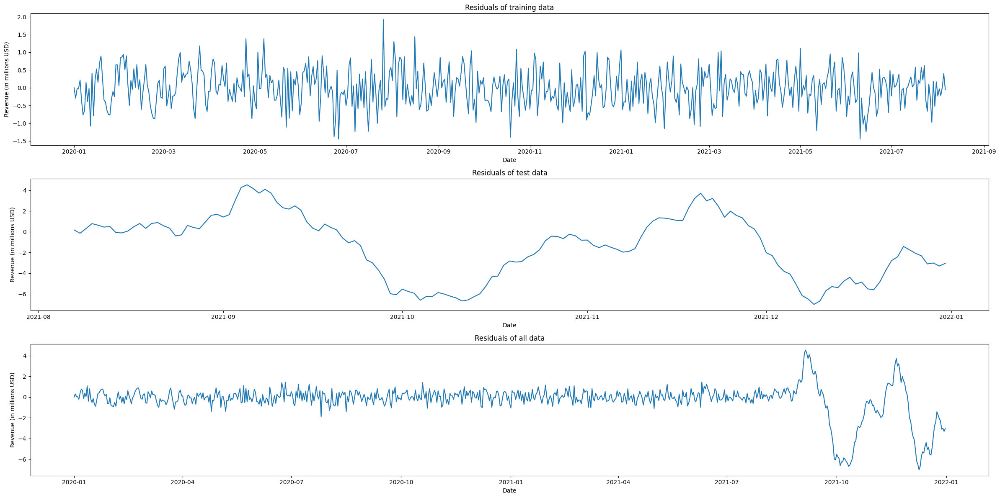

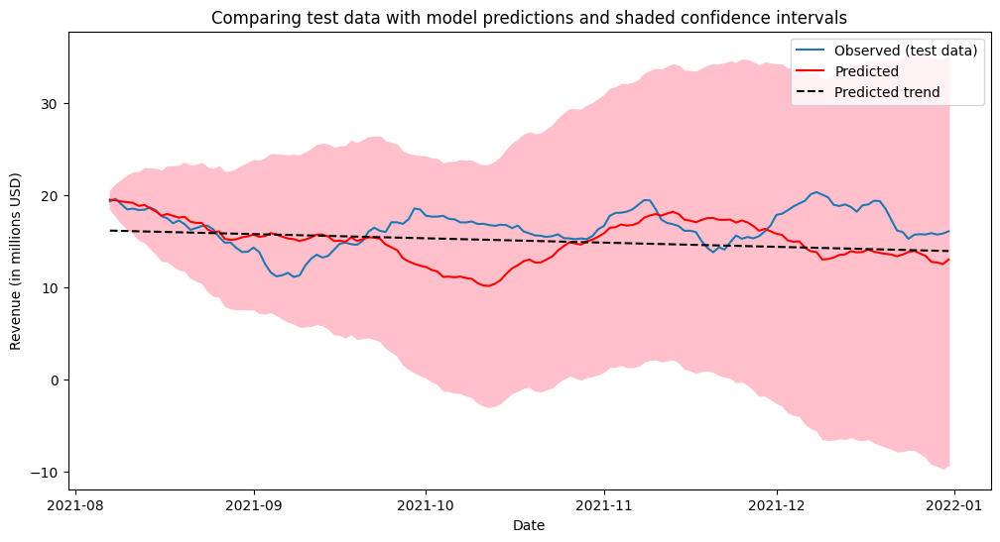

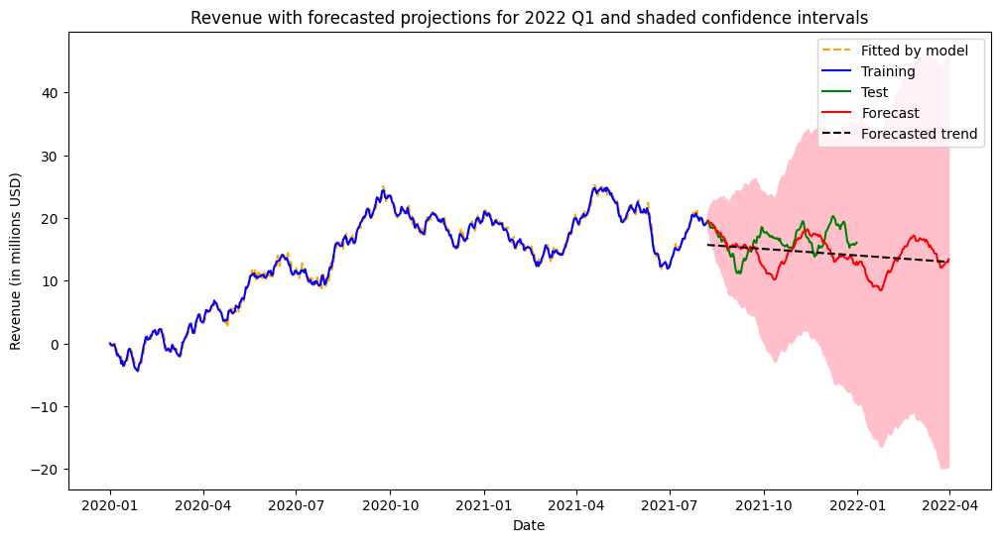

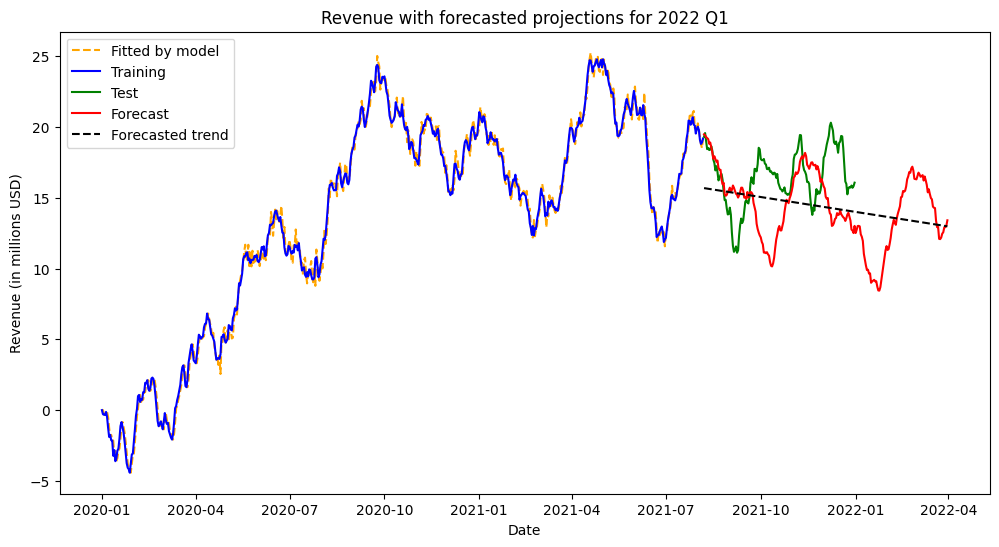

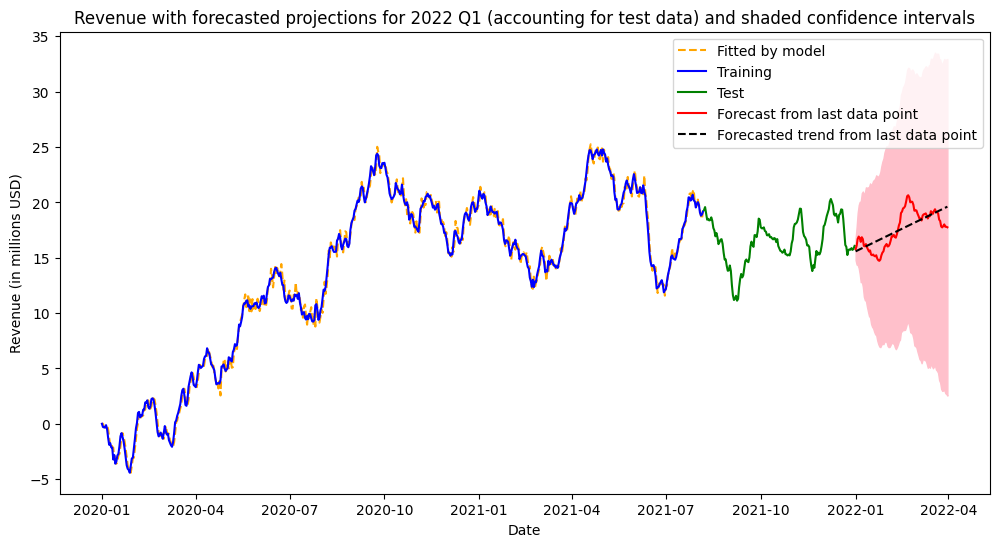

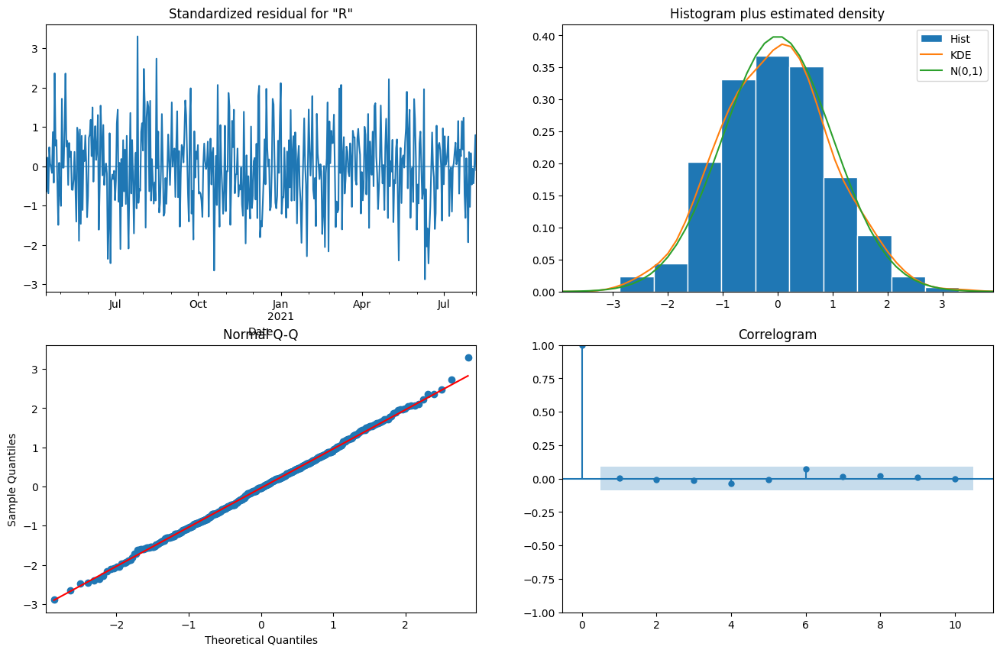

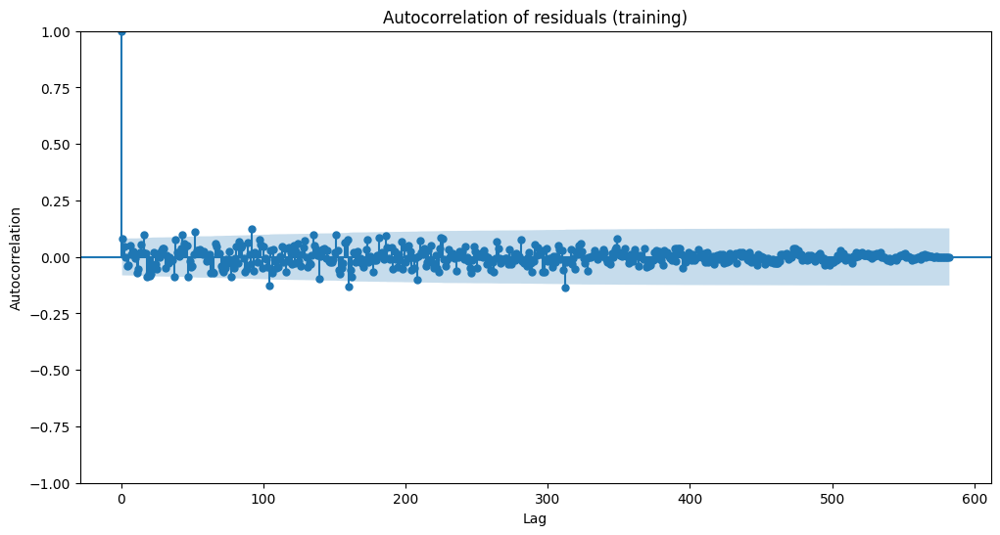

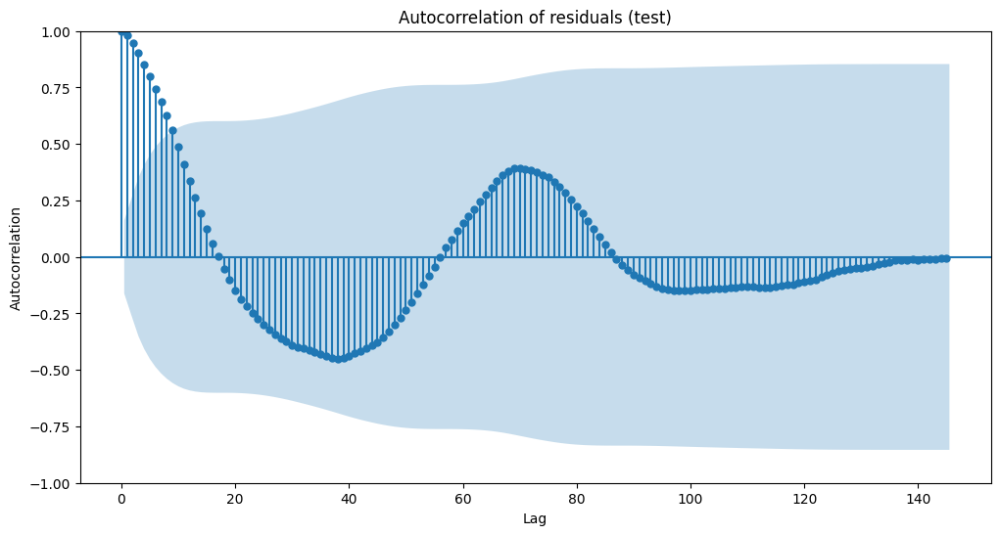

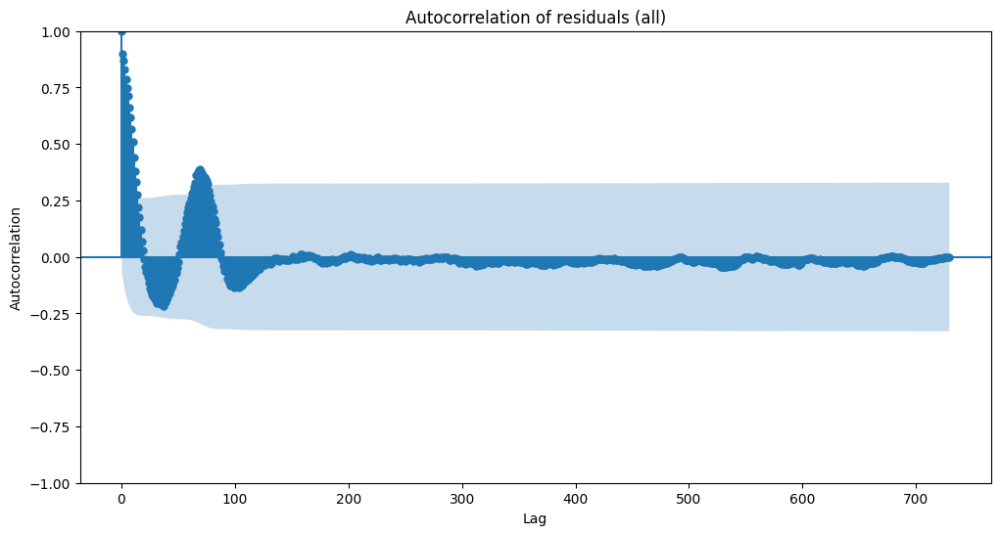

                                      SARIMAX Results                                       
Dep. Variable:                              Revenue   No. Observations:                  584
Model:             SARIMAX(0, 1, 2)x(2, 1, [], 104)   Log Likelihood                -370.715
Date:                              Sun, 02 Jun 2024   AIC                            751.431
Time:                                      18:21:07   BIC                            772.289
Sample:                                  01-01-2020   HQIC                           759.631
                                       - 08-06-2021                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4150      0.043      9.590      0.000       0.330       0.500
ma.L2          0.21

In [51]:
df_model_results = model_predictions((0, 1, 2), None, (2, 1, 0, 104), df_med, False)

In [ ]:
if use_auto_arima:
    model_season = auto_arima(df_med, seasonal=True, m=104, d=1, D=1, start_p=0, max_p=2, start_q=2, max_q=2, start_P=2,
                              max_P=2, start_Q=0, max_Q=1, trace=True, error_action='ignore', suppress_warnings=True)
    print(model_season.summary())

In [32]:
if run_verbose:
    plots(df_med, df_stationary, False, False)
    plots(X_train, X_statn_train, False, False, '_train')
    b_model, b_aic = aic_arima_search(3, 1, X_train, (2, 1, 0, 104))
    seasonal_fft(7, df_stationary)
    inspect_seasonal(104, 600, df_med, False)
    seasonal_plots(104, False, df_med, df_stationary)
    seasonal_plots(32, False, df_med, df_stationary)
    seasonal_plots(8, False, df_med, df_stationary)
    model_0, results_0, df_results_0 = model_creation(X_train, (0, 1, 2), None, (2, 1, 0, 104), False)
    df_model_results = model_predictions((0, 1, 2), None, (2, 1, 0, 104), df_med, False)